In [1]:
import utils as ut

# 목차
sampler로 `SVMSMOTE`와 `ROS`를 사용 \
각 case 마다 각각 수행
- do : drop outlier
- dn : drop null
- 1h : one hot encoding

0. import 
- 이상치 삭제
1. 원핫인코딩 x
- 1 ~ 8
2. 원핫인코딩

## 0. import
1. 이상치 삭제

In [2]:
df = pd.read_csv('../datas/insurance_fraud_detect_data.csv')
outliers = [43, 1504, 1762, 11706, 12031, 12665, 480, 4515, 4651, 8596, 9904, 10635, 11104, 11120, 11994, 12956, 12972, 14533, 14792, 15242, 209, 268, 12132, 8477, 12705, 8514, 532, 4158, 5401, 13077, 4595, 6839, 11710, 12377, 15080, 1115, 5398, 5790, 9523, 9528, 12050]
# drop outliers
df_do = df.drop(outliers)
df_do.shape

(15959, 25)

## 1. 원핫인코딩 x

### #1
(1) null 유지, no scaler, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


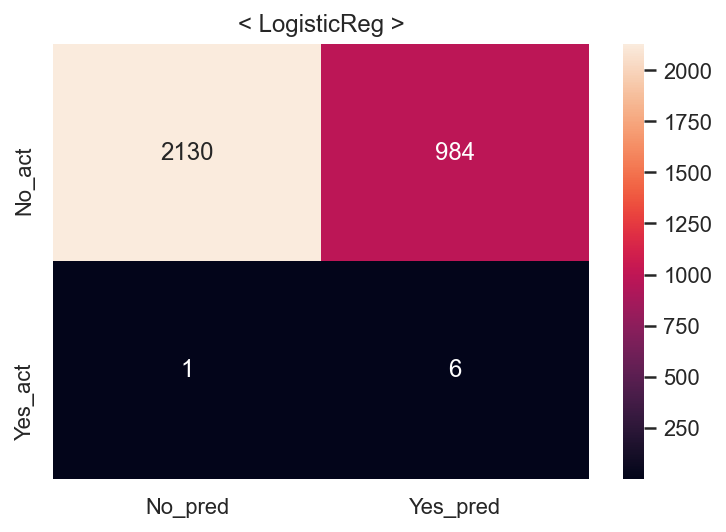

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


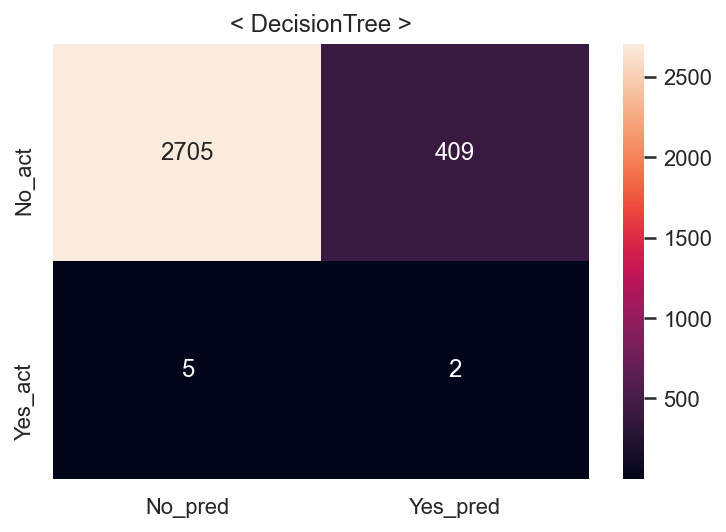

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


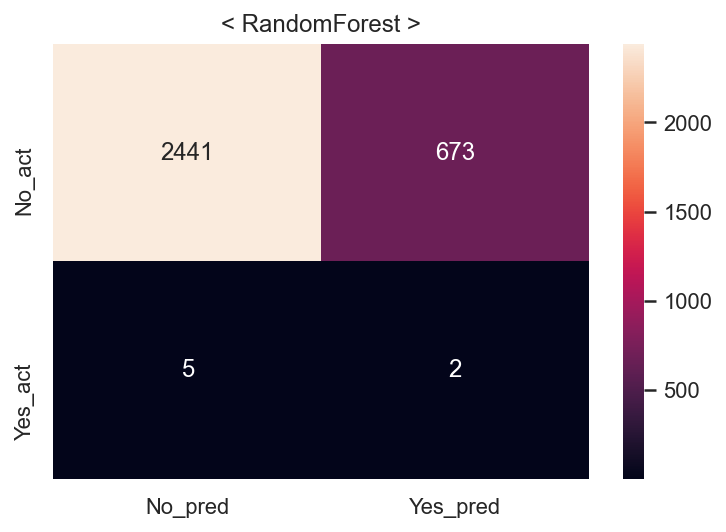

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


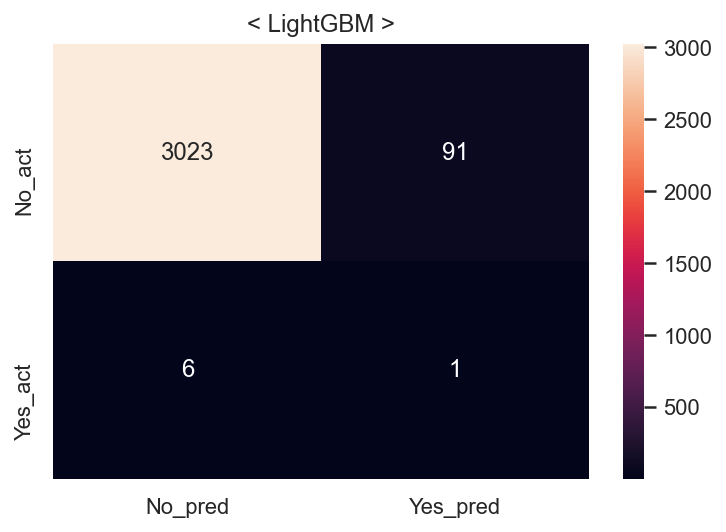

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  14.9s
====Done Evaluation====
====Done Evaluation====


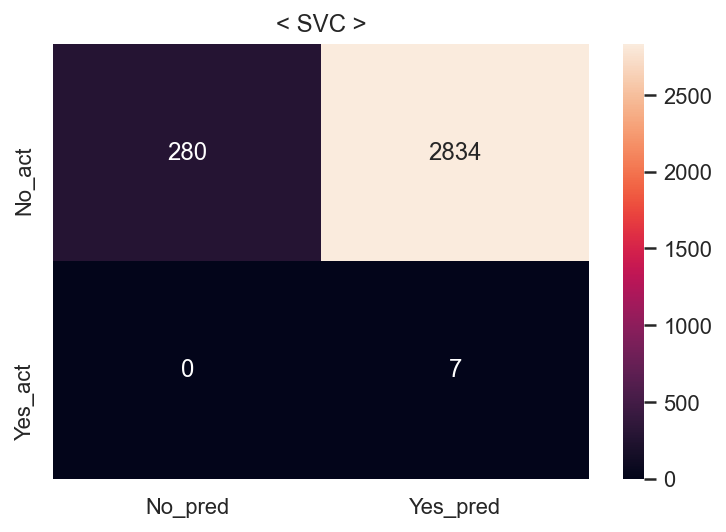

Fit time : 1.07 min


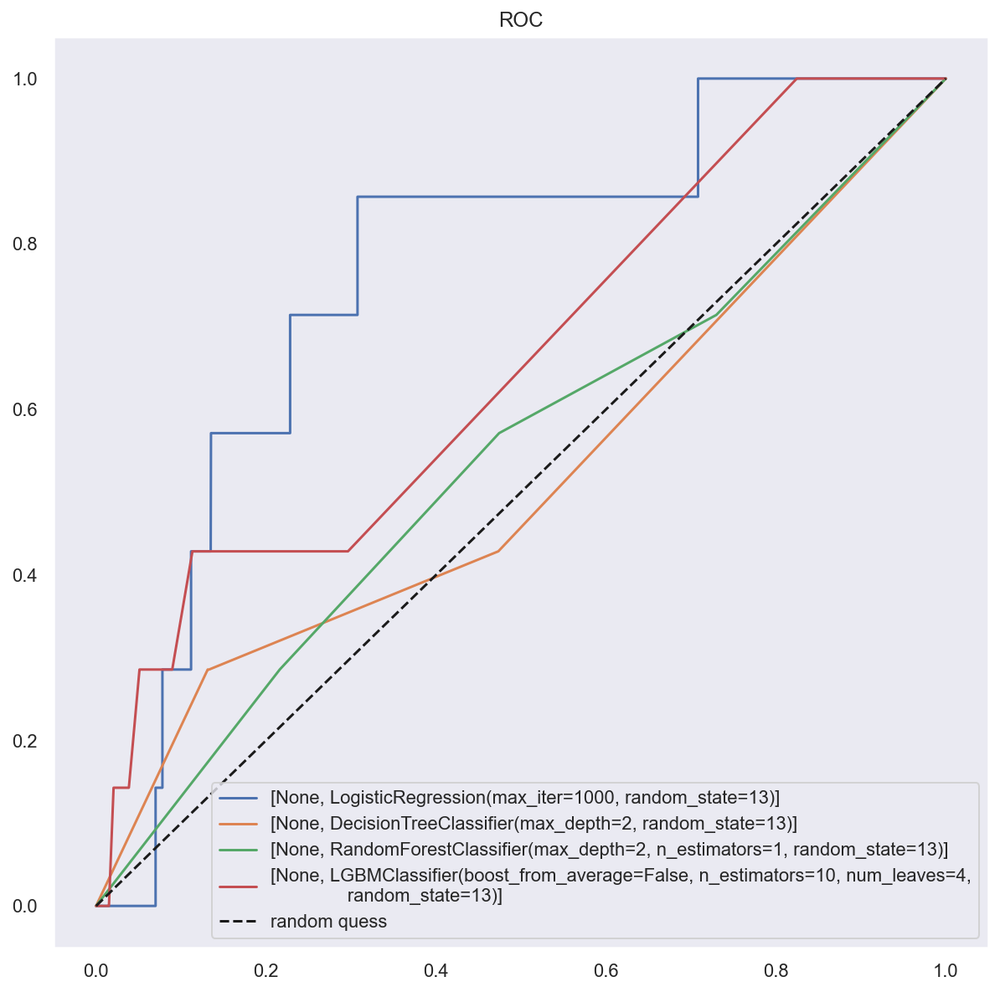

In [3]:
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list1 , result1 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [55]:
result1['null_del'], result1['encoded'], result1["scaler"], result1["sampler"] = 0, 0, 'None', "SVMSMOTE"
result1

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.774697,0.553007,0.995547,0.711044,0.842510,0.684396,0.006061,0.857143,0.012036,0.770575,0,0,None,SVMSMOTE
1,DecisionTree,0.936489,0.816988,0.994738,0.897143,0.954375,0.867350,0.004866,0.285714,0.009569,0.577186,0,0,None,SVMSMOTE
2,RandomForest,0.917216,0.772956,0.994940,0.870012,0.941082,0.782762,0.002963,0.285714,0.005865,0.534797,0,0,None,SVMSMOTE
3,LightGBM,0.984897,0.953601,0.994131,0.973444,0.987732,0.968920,0.010870,0.142857,0.020202,0.556817,0,0,None,SVMSMOTE
4,SVC,0.335757,0.295275,0.999190,0.455842,0.539466,0.091958,0.002464,1.000000,0.004916,0.544958,0,0,None,SVMSMOTE


(2) null 유지, no scaler, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


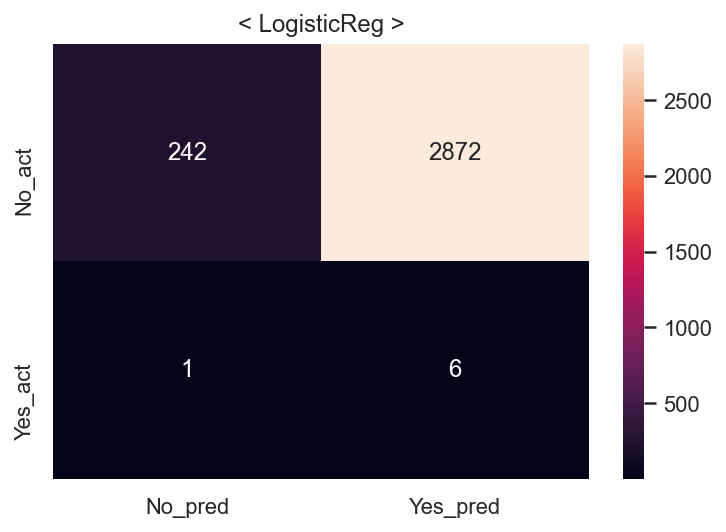

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


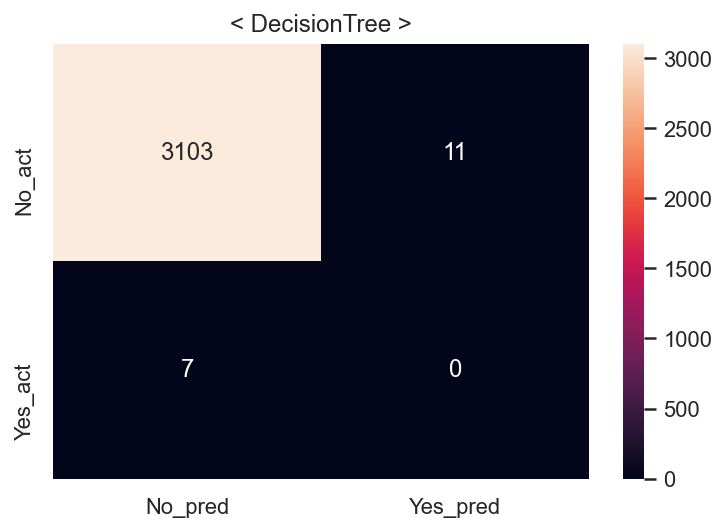

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


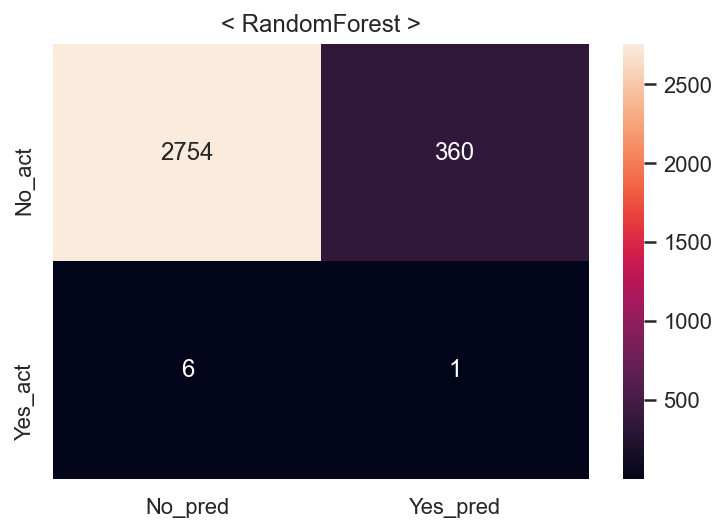

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


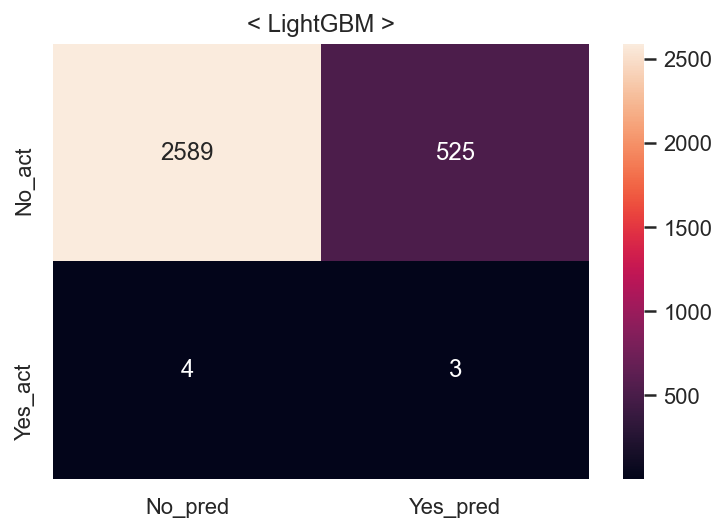

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=57.3min
====Done Evaluation====
====Done Evaluation====


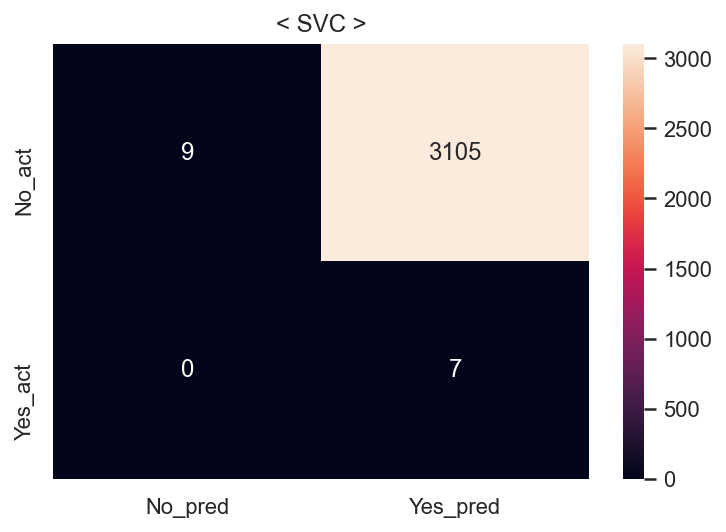

Fit time : 172.01 min


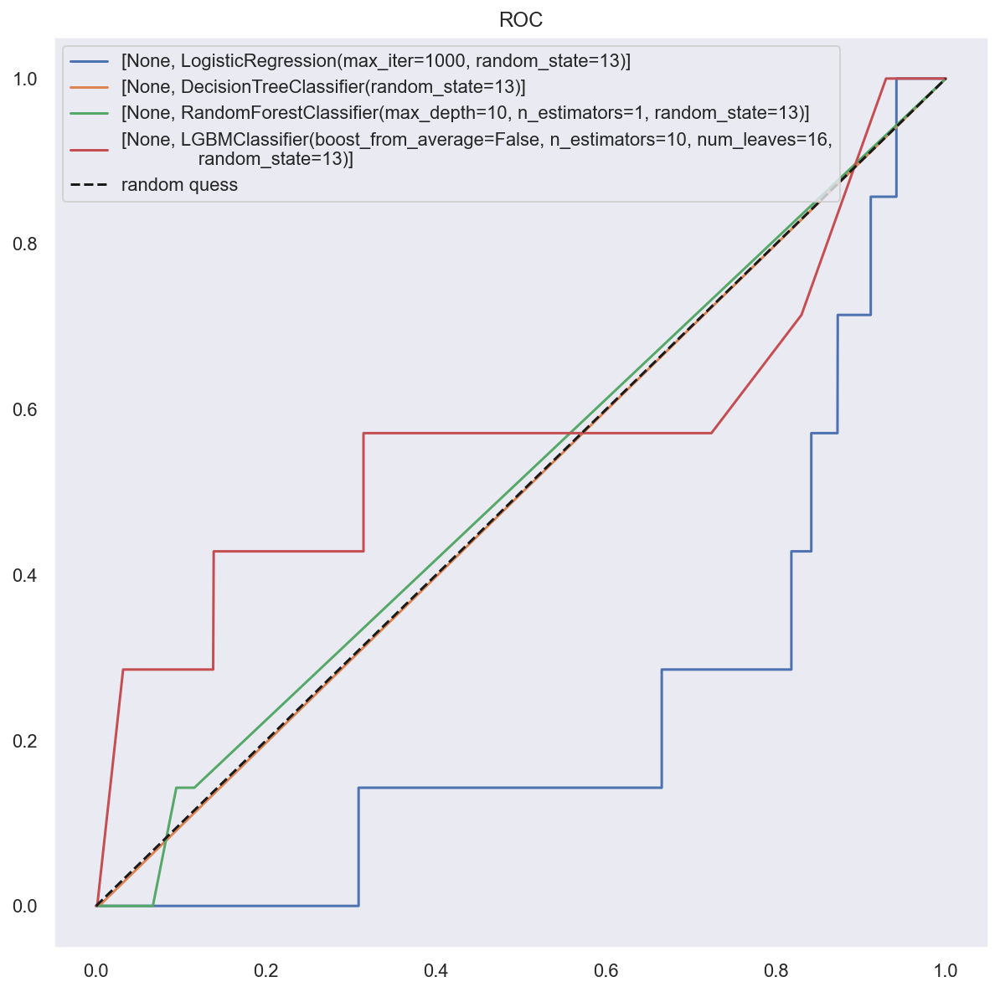

In [4]:
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list2 , result2 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [56]:
result2['null_del'], result2['encoded'], result2["scaler"], result2["sampler"] = 0, 0, 'None', "RandomOverSampler"
result2

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.536278,0.518822,1.0,0.683190,0.536278,0.079462,0.002085,0.857143,0.004159,0.467428,0,0,None,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.0,1.000000,1.000000,0.994233,0.000000,0.000000,0.000000,0.498234,0,0,None,RandomOverSampler
2,RandomForest,0.936778,0.887749,1.0,0.940537,0.936778,0.882730,0.002770,0.142857,0.005435,0.513625,0,0,None,RandomOverSampler
3,LightGBM,0.939082,0.891395,1.0,0.942580,0.939082,0.830503,0.005682,0.428571,0.011215,0.629989,0,0,None,RandomOverSampler
4,SVC,0.500898,0.500449,1.0,0.667066,0.500898,0.005127,0.002249,1.000000,0.004489,0.501445,0,0,None,RandomOverSampler


### #2
(1) null 유지, MinMax, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


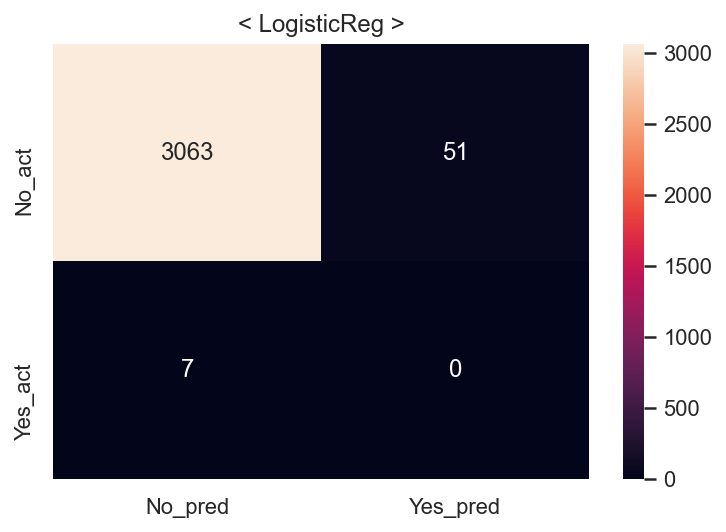

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


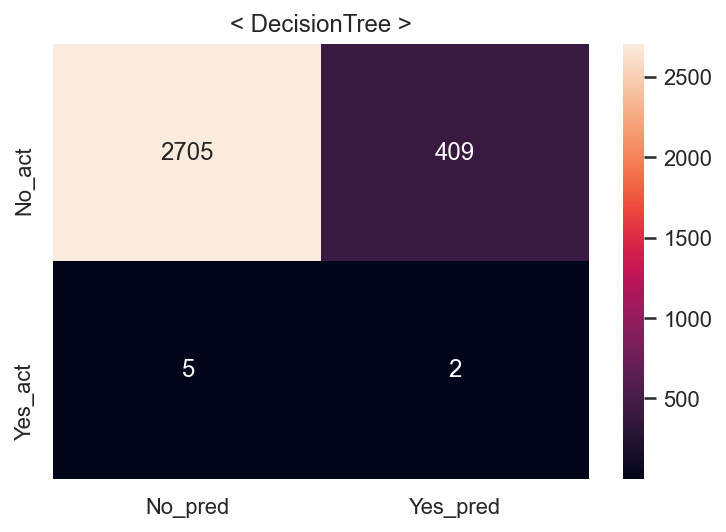

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


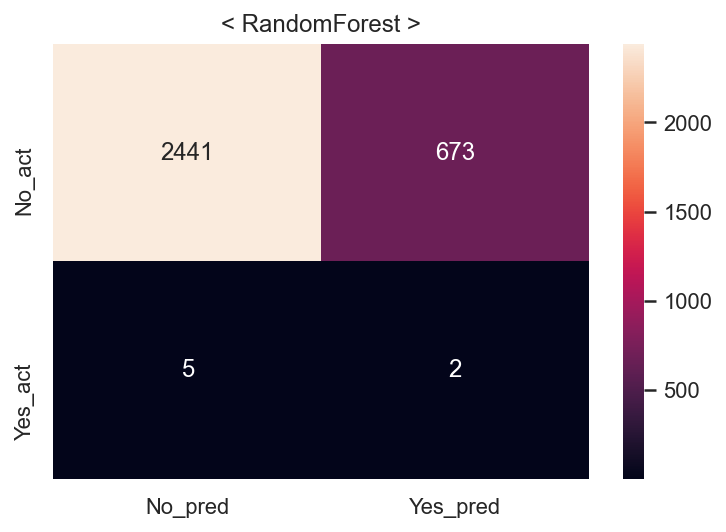

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


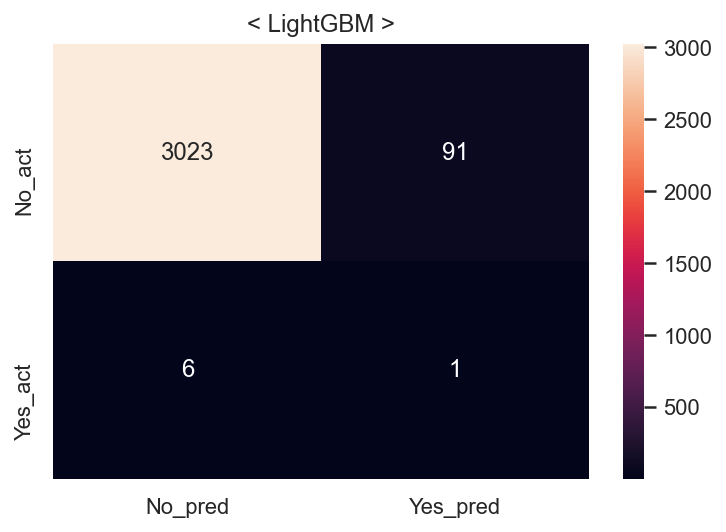

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.0s
====Done Evaluation====
====Done Evaluation====


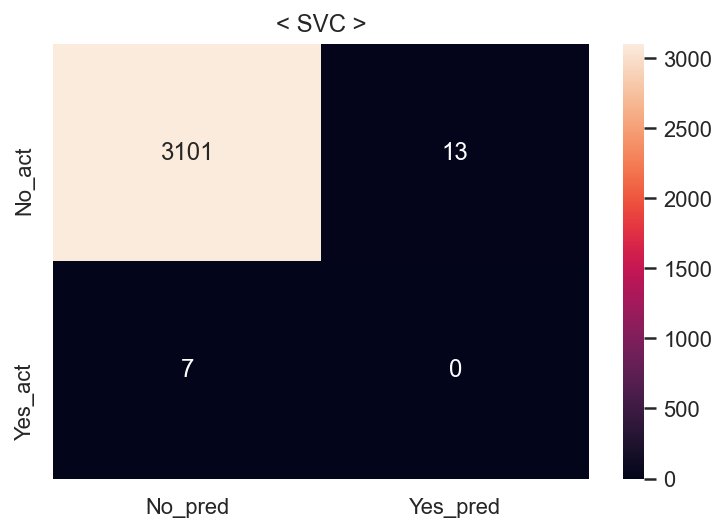

Fit time : 0.16 min


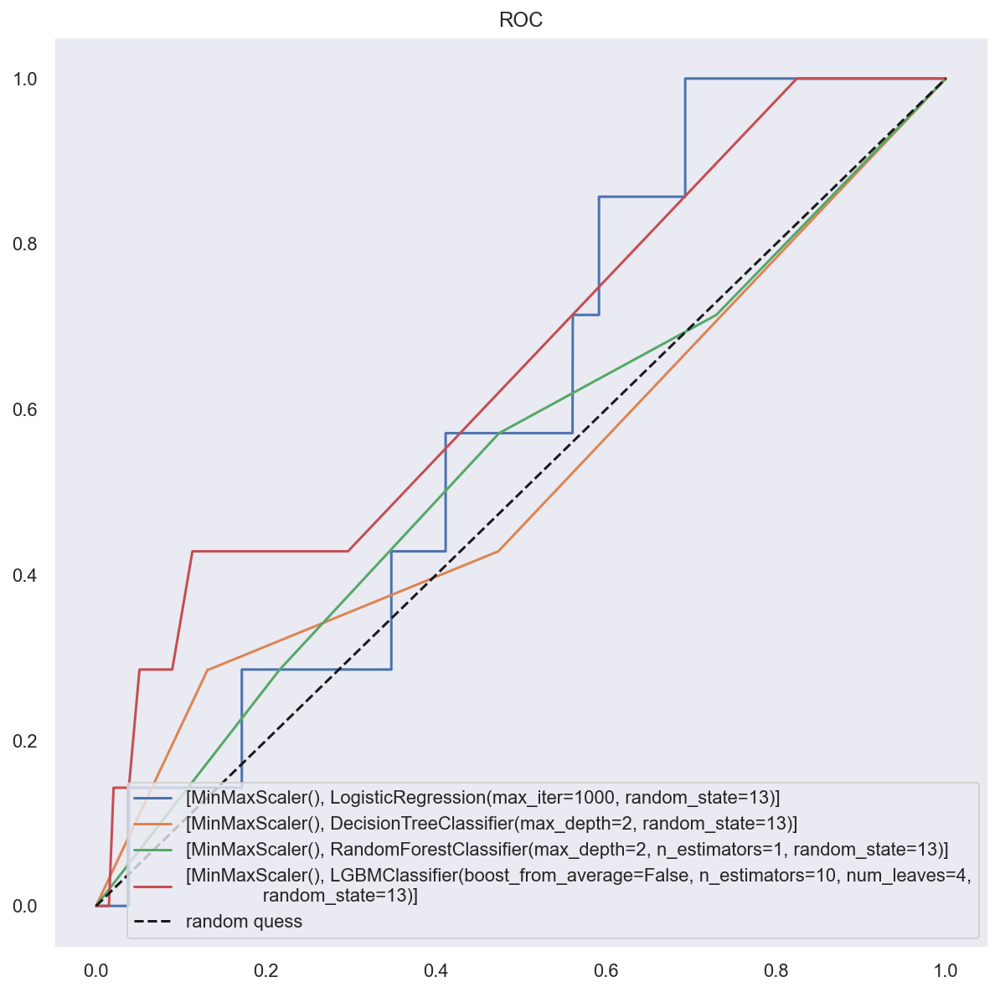

In [5]:
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list3 , result3 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [57]:
result3['null_del'], result3['encoded'], result3["scaler"], result3["sampler"] = 0, 0, 'MM', "SVMSMOTE"
result3

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.988955,0.967856,0.993321,0.980423,0.990295,0.981416,0.000000,0.000000,0.000000,0.491811,0,0,MM,SVMSMOTE
1,DecisionTree,0.936489,0.816988,0.994738,0.897143,0.954375,0.867350,0.004866,0.285714,0.009569,0.577186,0,0,MM,SVMSMOTE
2,RandomForest,0.917216,0.772956,0.994940,0.870012,0.941082,0.782762,0.002963,0.285714,0.005865,0.534797,0,0,MM,SVMSMOTE
3,LightGBM,0.984897,0.953601,0.994131,0.973444,0.987732,0.968920,0.010870,0.142857,0.020202,0.556817,0,0,MM,SVMSMOTE
4,SVC,0.996675,0.992336,0.995750,0.994040,0.996391,0.993592,0.000000,0.000000,0.000000,0.497913,0,0,MM,SVMSMOTE


(2) null 유지, MinMax, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


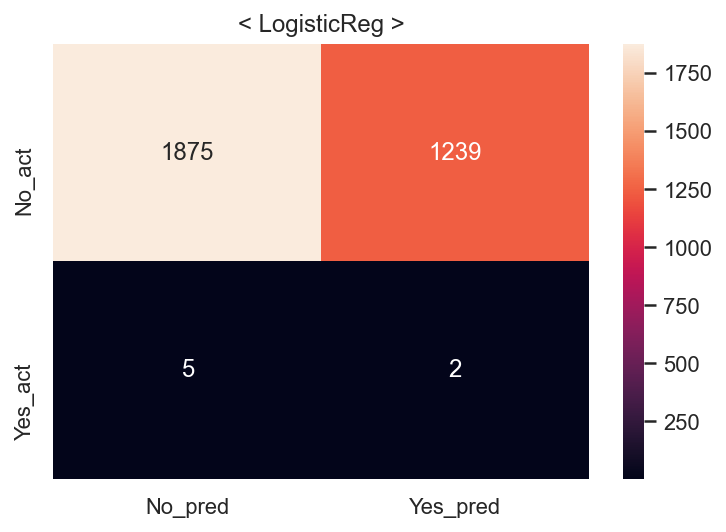

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


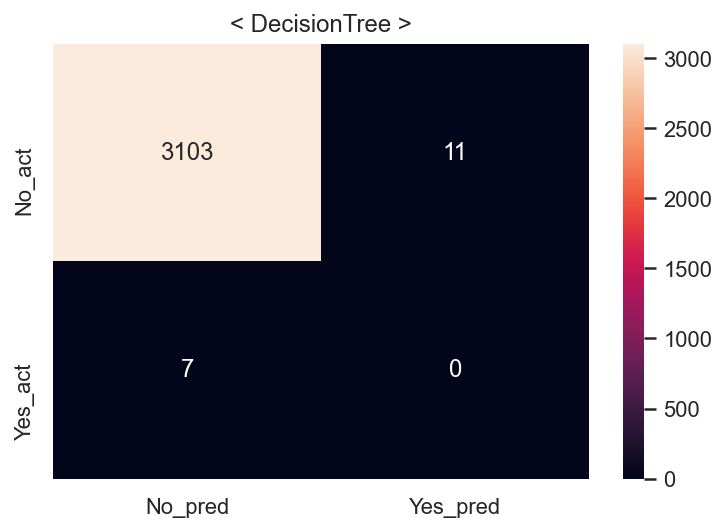

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


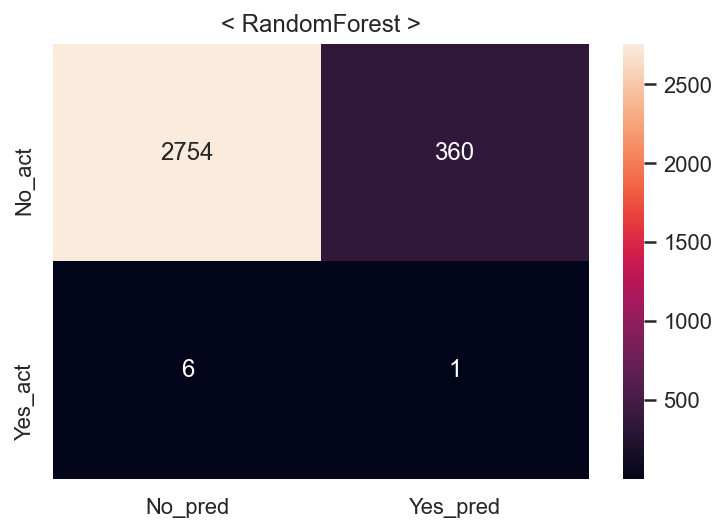

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


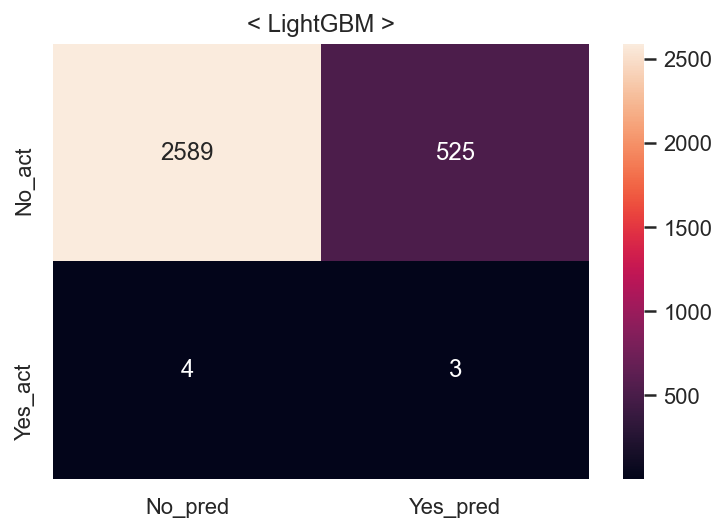

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   3.6s
====Done Evaluation====
====Done Evaluation====


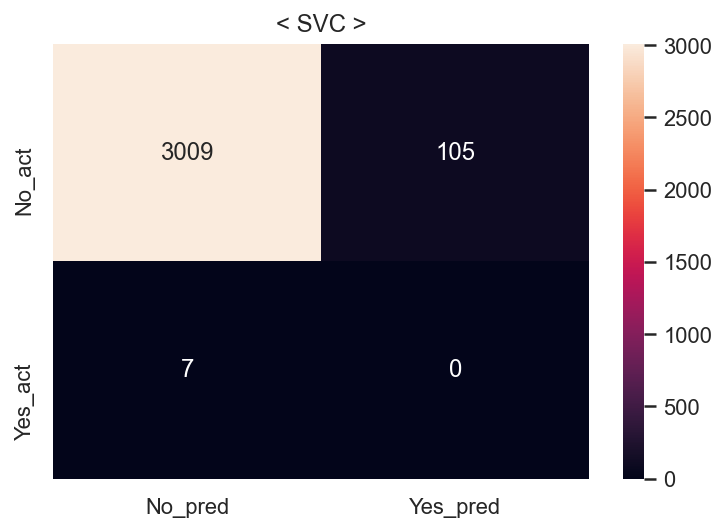

Fit time : 0.44 min


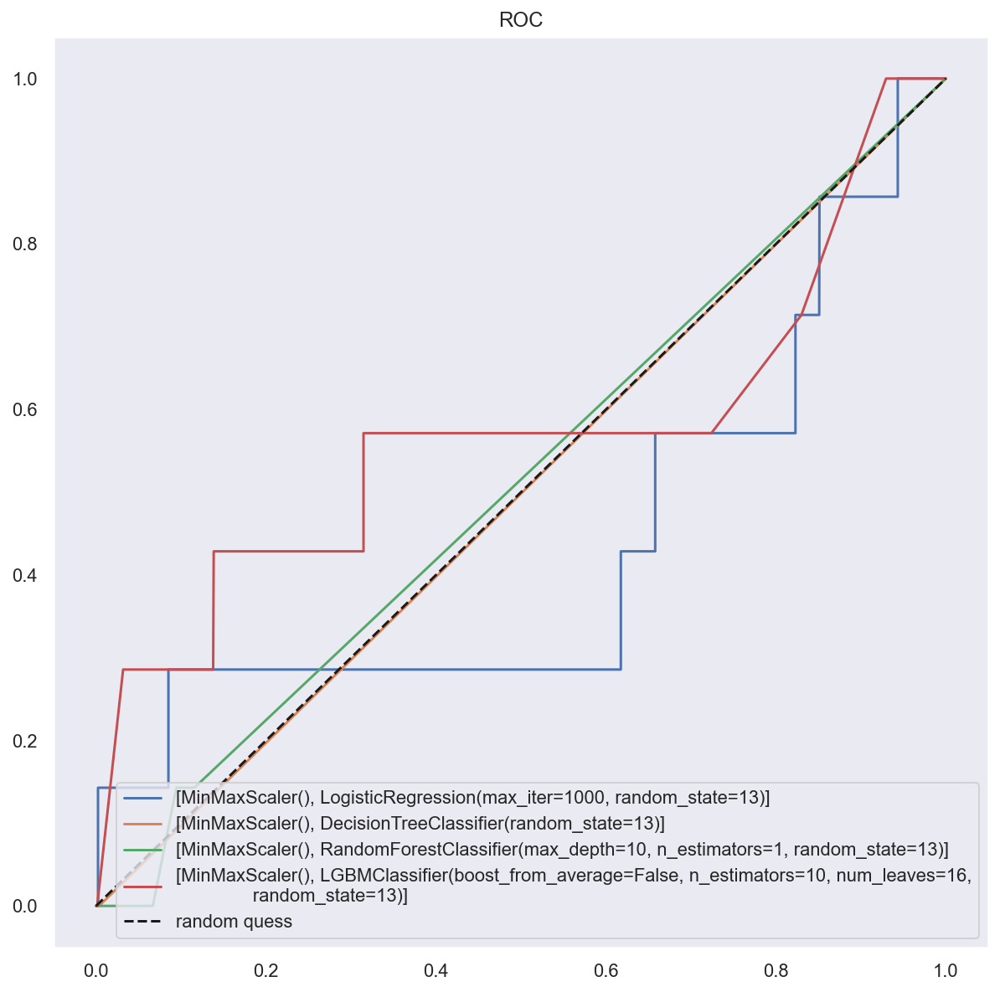

In [6]:
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list4 , result4 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [58]:
result4['null_del'], result4['encoded'], result4["scaler"], result4["sampler"] = 0, 0, 'MM', "RandomOverSampler"
result4

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.676585,0.691870,0.636754,0.663169,0.676585,0.601410,0.001612,0.285714,0.003205,0.443917,0,0,MM,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.994233,0.000000,0.000000,0.000000,0.498234,0,0,MM,RandomOverSampler
2,RandomForest,0.936778,0.887749,1.000000,0.940537,0.936778,0.882730,0.002770,0.142857,0.005435,0.513625,0,0,MM,RandomOverSampler
3,LightGBM,0.939082,0.891395,1.000000,0.942580,0.939082,0.830503,0.005682,0.428571,0.011215,0.629989,0,0,MM,RandomOverSampler
4,SVC,0.987231,0.975097,1.000000,0.987392,0.987231,0.964114,0.000000,0.000000,0.000000,0.483141,0,0,MM,RandomOverSampler


### #3
(1) null 유지, Standard, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


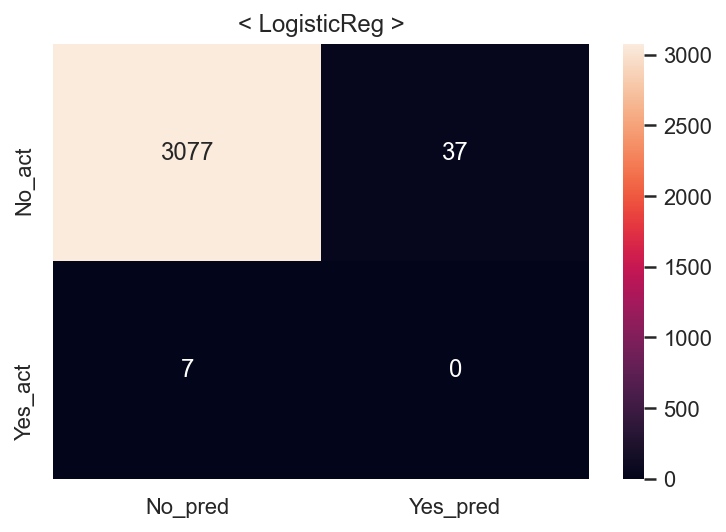

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


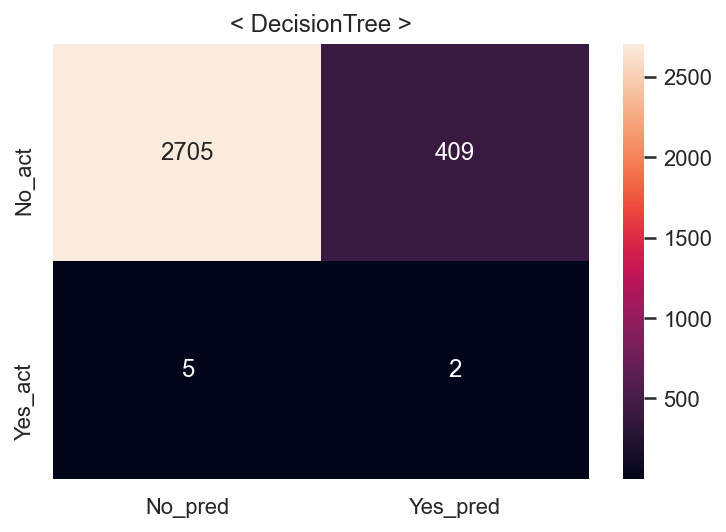

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


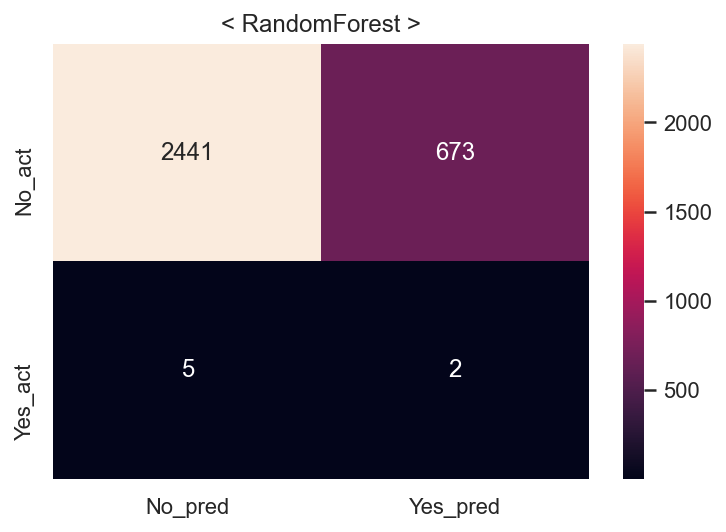

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


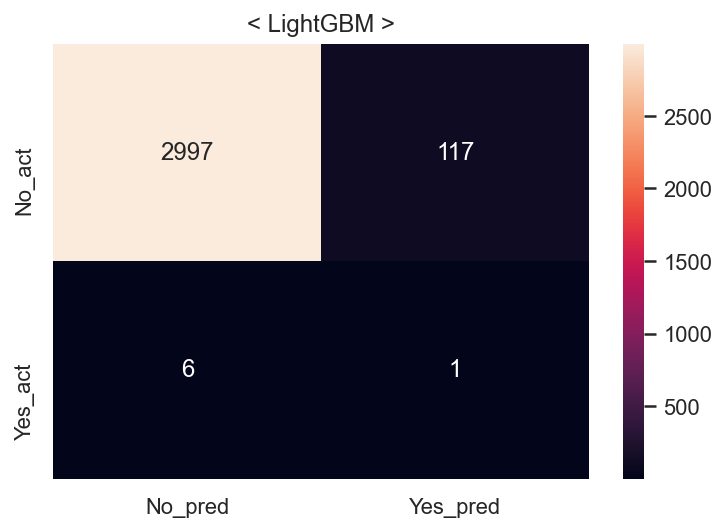

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.3s
====Done Evaluation====
====Done Evaluation====


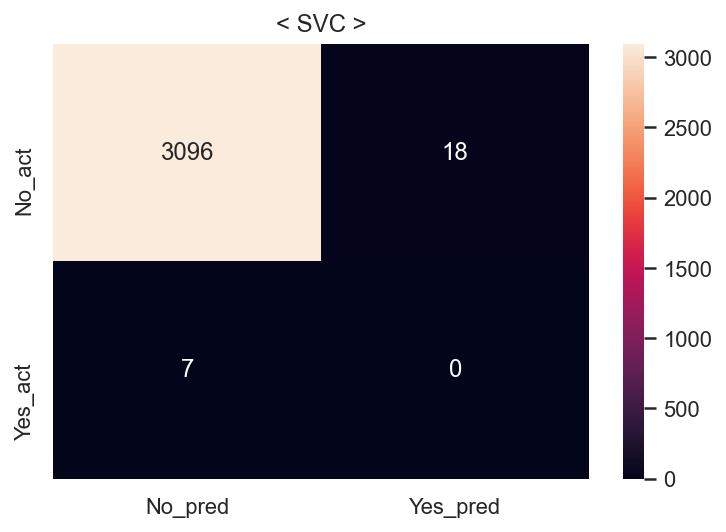

Fit time : 0.17 min


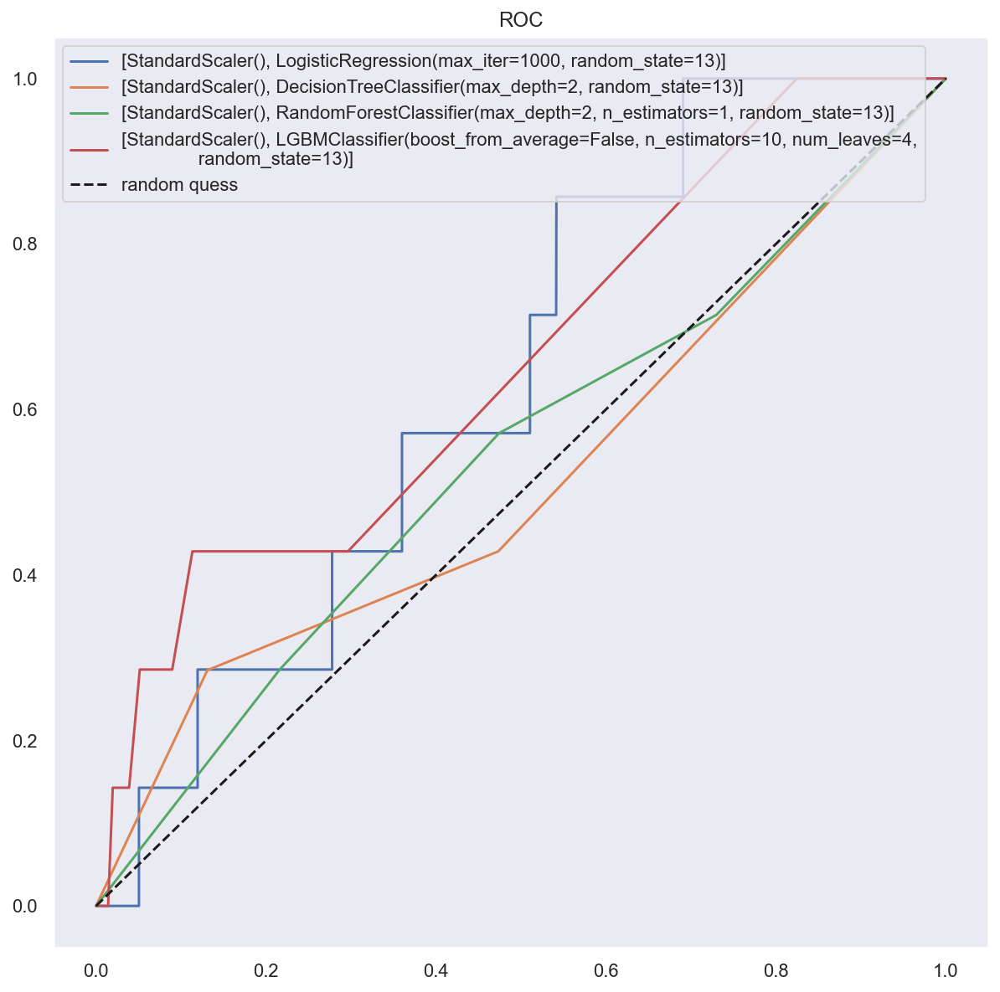

In [7]:
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list5 , result5 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [59]:
result5['null_del'], result5['encoded'], result5["scaler"], result5["sampler"] = 0, 0, 'SD', "SVMSMOTE"
result5

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.991434,0.976328,0.993321,0.984751,0.992014,0.985902,0.000000,0.000000,0.000000,0.494059,0,0,SD,SVMSMOTE
1,DecisionTree,0.936489,0.816988,0.994738,0.897143,0.954375,0.867350,0.004866,0.285714,0.009569,0.577186,0,0,SD,SVMSMOTE
2,RandomForest,0.917216,0.772956,0.994940,0.870012,0.941082,0.782762,0.002963,0.285714,0.005865,0.534797,0,0,SD,SVMSMOTE
3,LightGBM,0.980276,0.938659,0.994131,0.965599,0.984530,0.960590,0.008475,0.142857,0.016000,0.552642,0,0,SD,SVMSMOTE
4,SVC,0.997633,0.994549,0.996964,0.995755,0.997428,0.991990,0.000000,0.000000,0.000000,0.497110,0,0,SD,SVMSMOTE


(2) null 유지, Standard, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


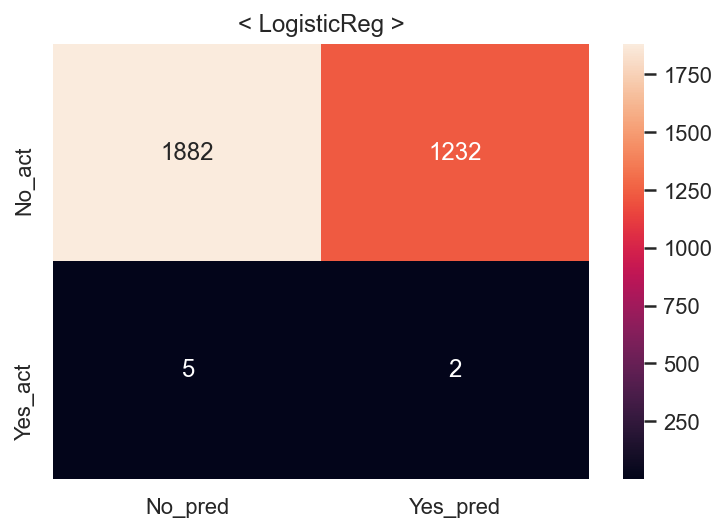

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


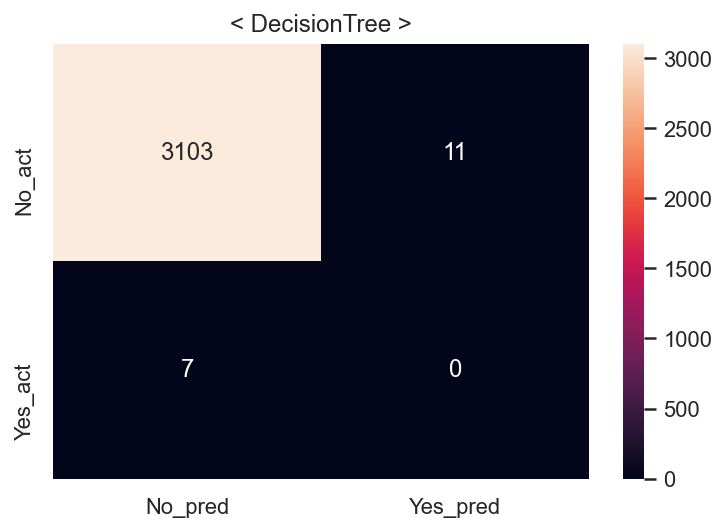

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


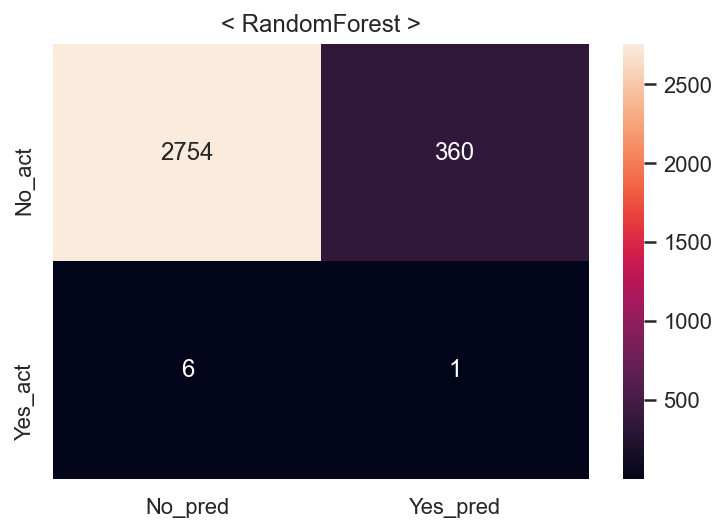

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


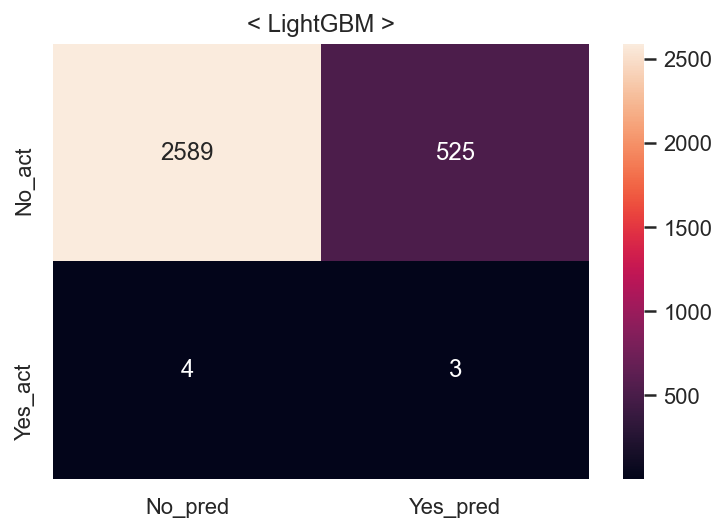

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.7s
====Done Evaluation====
====Done Evaluation====


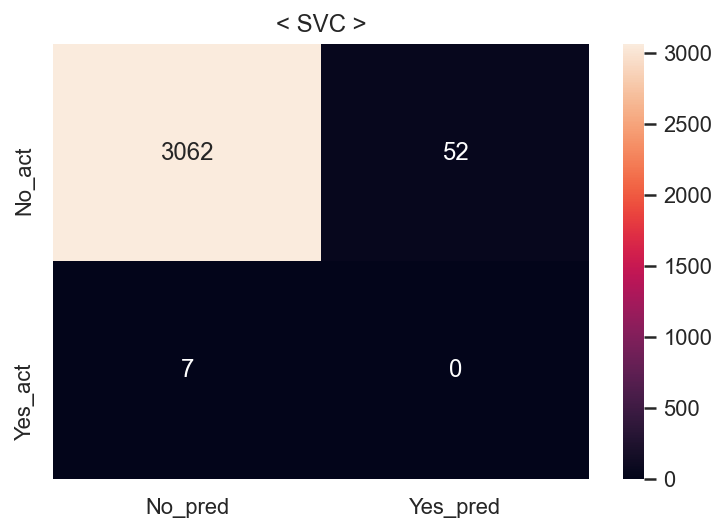

Fit time : 0.31 min


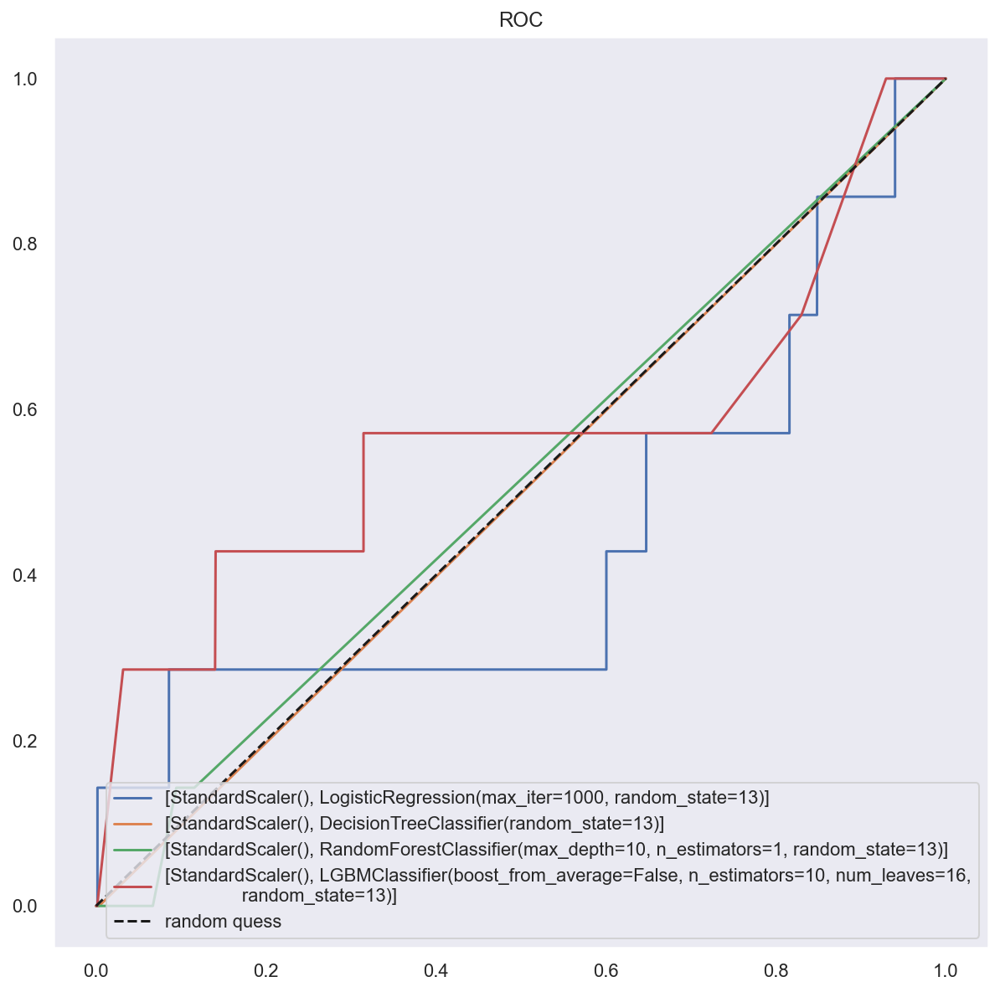

In [8]:
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list6 , result6 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [60]:
result6['null_del'], result6['encoded'], result6["scaler"], result6["sampler"] = 0, 0, 'SD', "RandomOverSampler"
result6

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.691190,0.701150,0.666432,0.683351,0.691190,0.603653,0.001621,0.285714,0.003223,0.445041,0,0,SD,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.994233,0.000000,0.000000,0.000000,0.498234,0,0,SD,RandomOverSampler
2,RandomForest,0.936778,0.887749,1.000000,0.940537,0.936778,0.882730,0.002770,0.142857,0.005435,0.513625,0,0,SD,RandomOverSampler
3,LightGBM,0.939042,0.891333,1.000000,0.942545,0.939042,0.830503,0.005682,0.428571,0.011215,0.629989,0,0,SD,RandomOverSampler
4,SVC,0.995275,0.990638,1.000000,0.995297,0.995275,0.981096,0.000000,0.000000,0.000000,0.491651,0,0,SD,RandomOverSampler


### #4
(1) null 유지, Robust, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


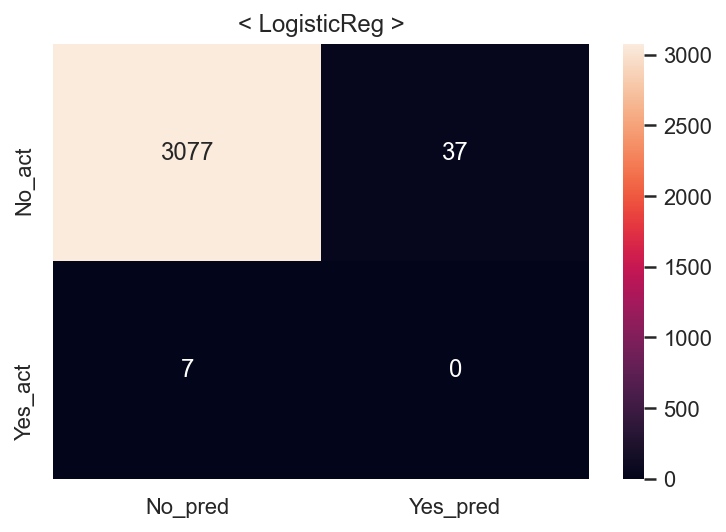

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


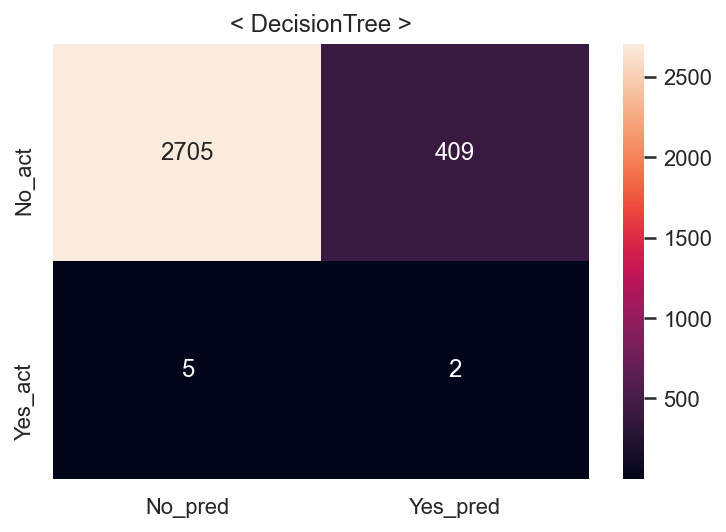

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


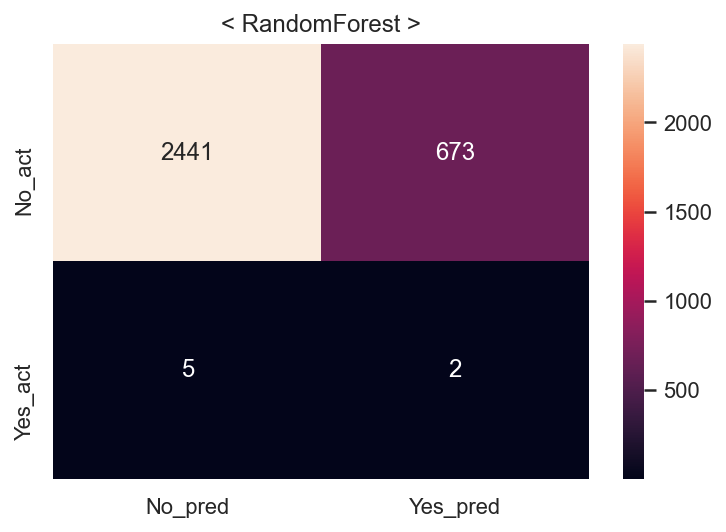

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


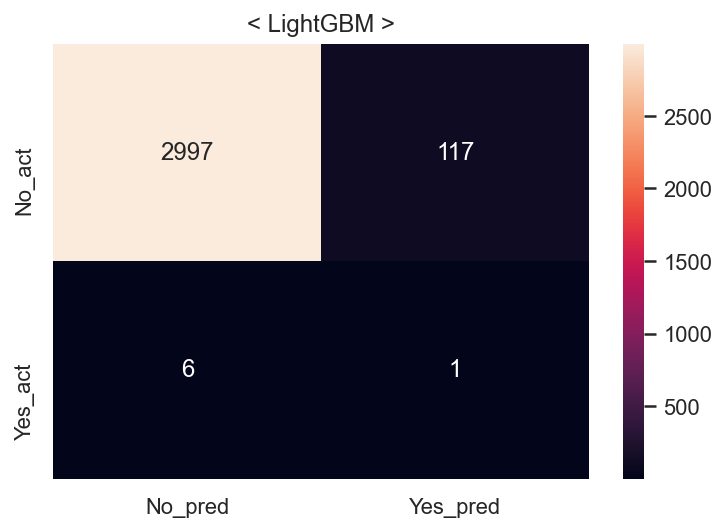

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  13.6s
====Done Evaluation====
====Done Evaluation====


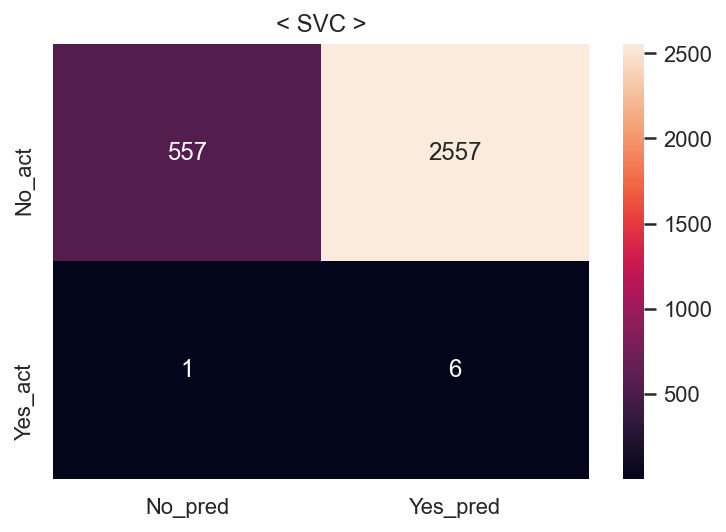

Fit time : 0.95 min


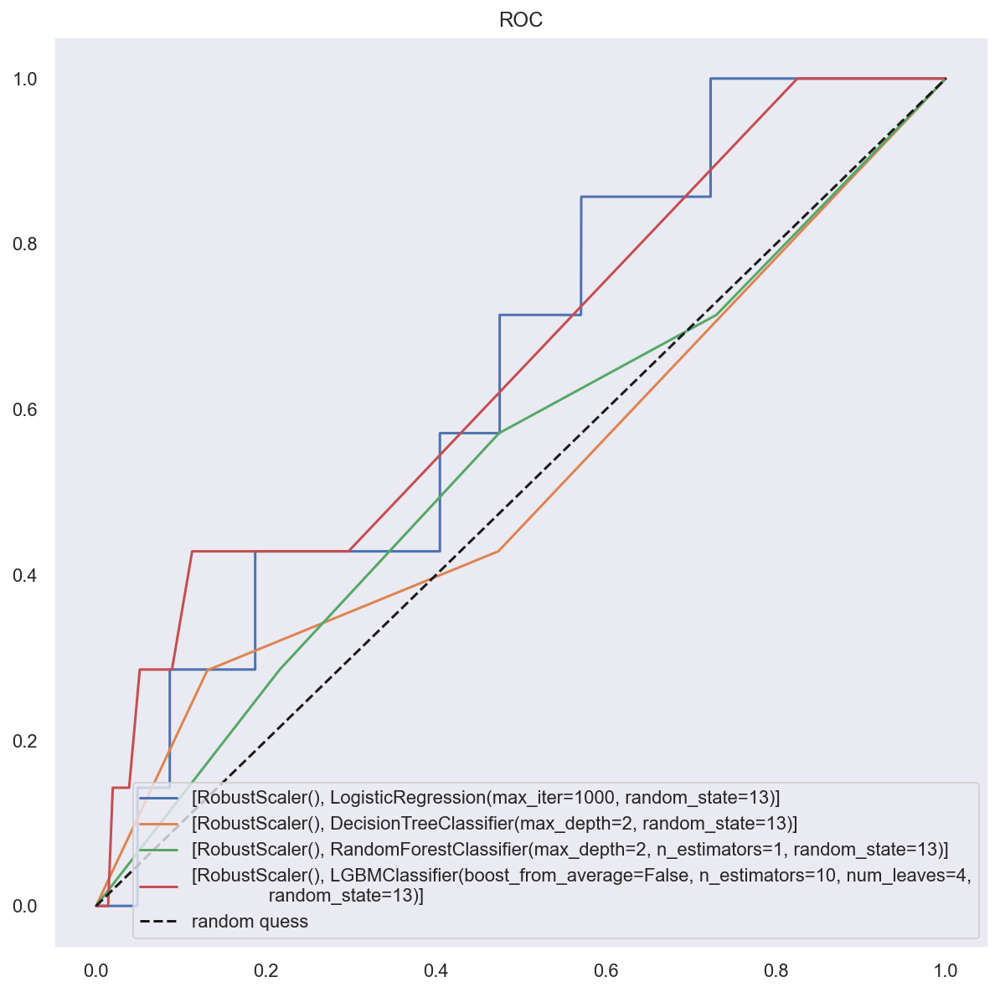

In [9]:
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list7 , result7 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [61]:
result7['null_del'], result7['encoded'], result7["scaler"], result7["sampler"] = 0, 0, 'RB', "SVMSMOTE"
result7

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.991096,0.975164,0.993321,0.984159,0.991779,0.985902,0.000000,0.000000,0.000000,0.494059,0,0,RB,SVMSMOTE
1,DecisionTree,0.936489,0.816988,0.994738,0.897143,0.954375,0.867350,0.004866,0.285714,0.009569,0.577186,0,0,RB,SVMSMOTE
2,RandomForest,0.917216,0.772956,0.994940,0.870012,0.941082,0.782762,0.002963,0.285714,0.005865,0.534797,0,0,RB,SVMSMOTE
3,LightGBM,0.980276,0.938659,0.994131,0.965599,0.984530,0.960590,0.008475,0.142857,0.016000,0.552642,0,0,RB,SVMSMOTE
4,SVC,0.401183,0.317332,0.999393,0.481709,0.584865,0.180391,0.002341,0.857143,0.004669,0.518006,0,0,RB,SVMSMOTE


(2) null 유지, Robust, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.4s
====Done Evaluation====
====Done Evaluation====


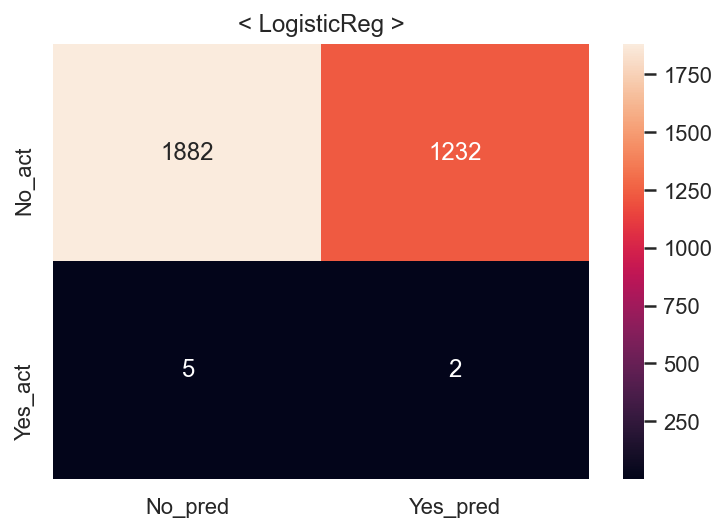

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


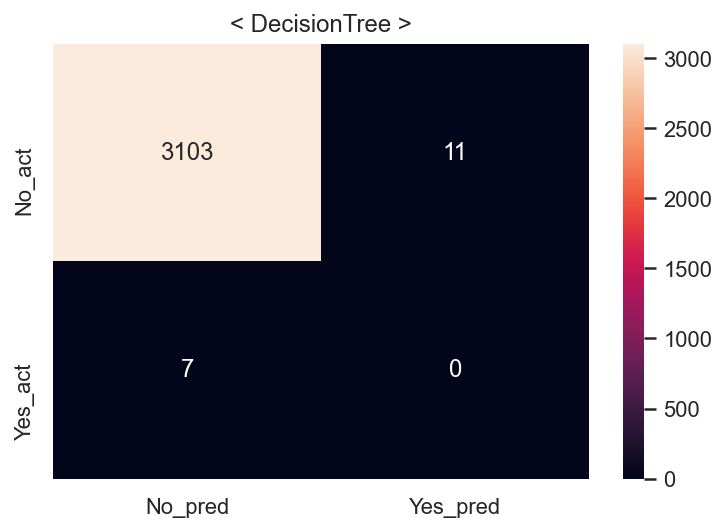

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


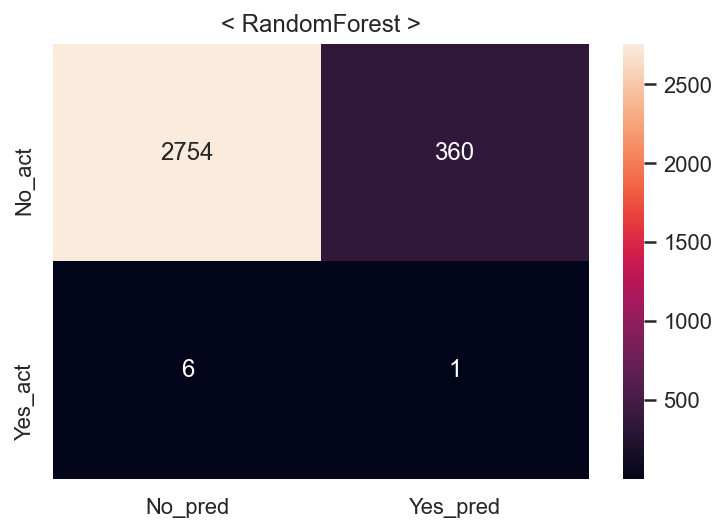

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


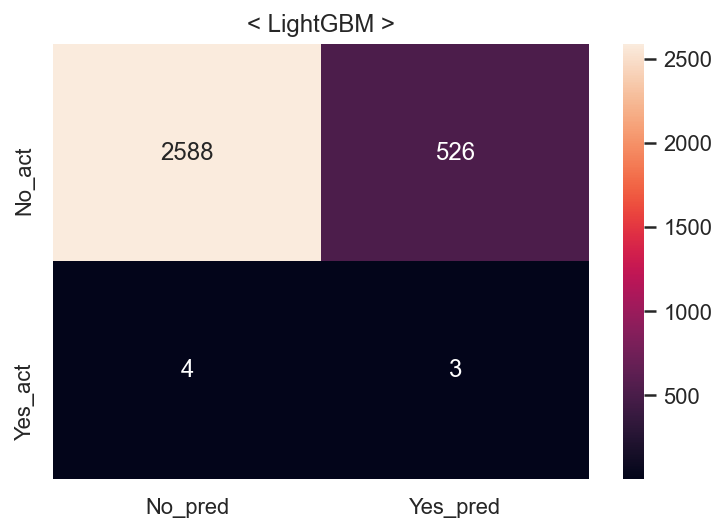

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  17.1s
====Done Evaluation====
====Done Evaluation====


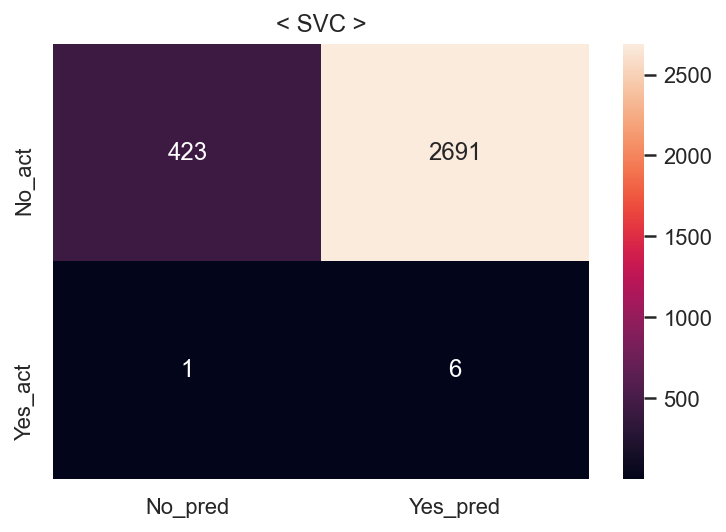

Fit time : 1.48 min


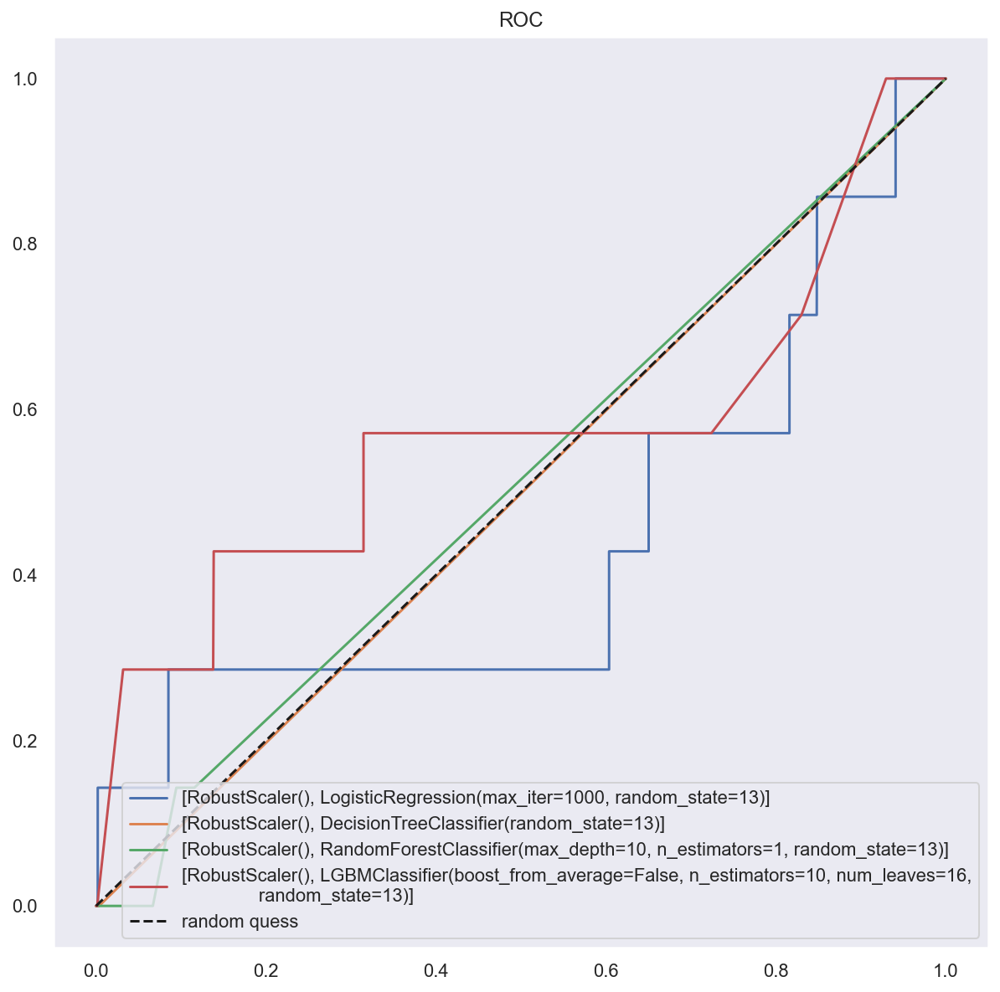

In [10]:
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list8 , result8 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [62]:
result8['null_del'], result8['encoded'], result8["scaler"], result8["sampler"] = 0, 0, 'RB', "RandomOverSampler"
result8

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.691346,0.701381,0.666432,0.683460,0.691346,0.603653,0.001621,0.285714,0.003223,0.445041,0,0,RB,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.994233,0.000000,0.000000,0.000000,0.498234,0,0,RB,RandomOverSampler
2,RandomForest,0.936778,0.887749,1.000000,0.940537,0.936778,0.882730,0.002770,0.142857,0.005435,0.513625,0,0,RB,RandomOverSampler
3,LightGBM,0.939082,0.891395,1.000000,0.942580,0.939082,0.830183,0.005671,0.428571,0.011194,0.629828,0,0,RB,RandomOverSampler
4,SVC,0.567401,0.536136,1.000000,0.698032,0.567401,0.137456,0.002225,0.857143,0.004438,0.496491,0,0,RB,RandomOverSampler


### #5
(1) null 삭제, no scaler, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


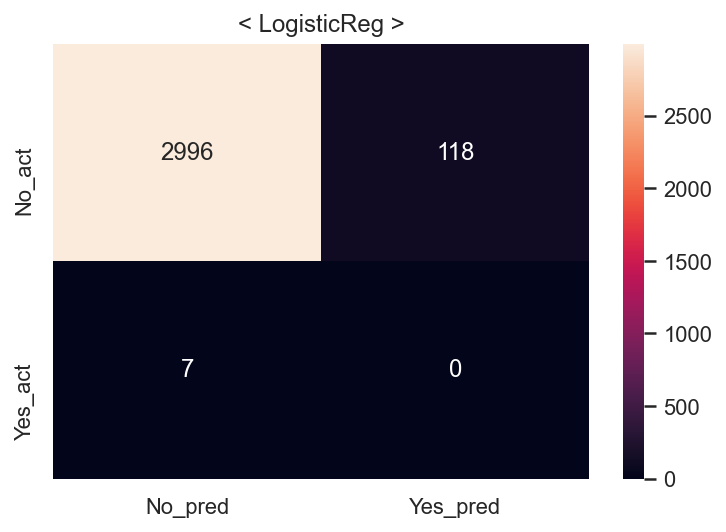

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


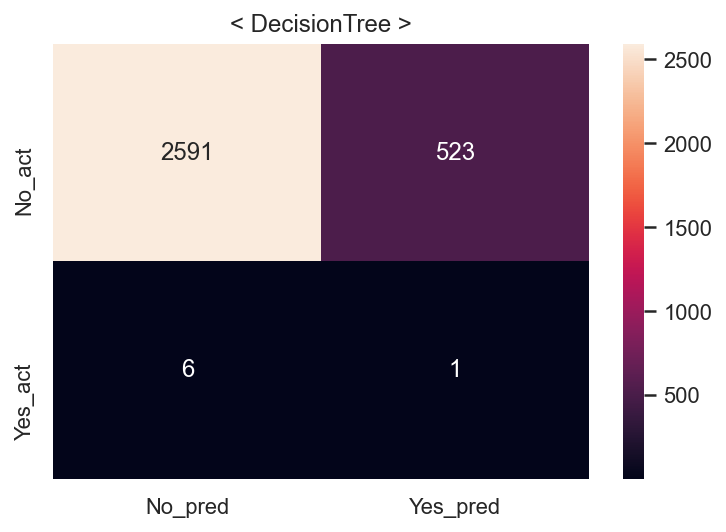

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


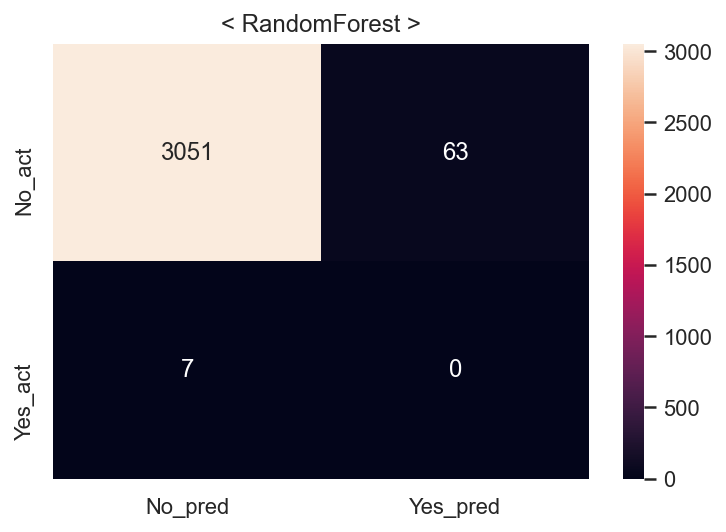

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


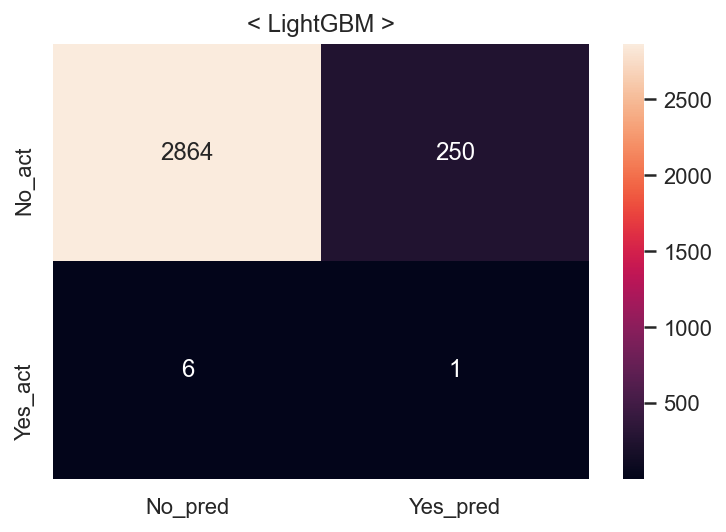

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   5.4s
====Done Evaluation====
====Done Evaluation====


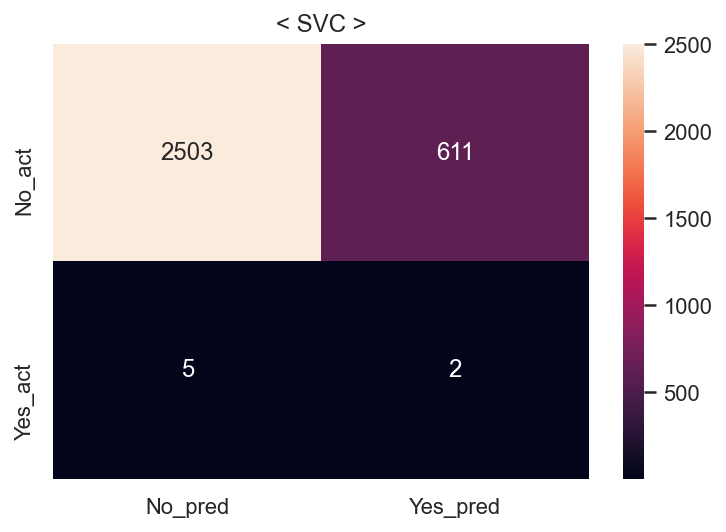

Fit time : 0.48 min


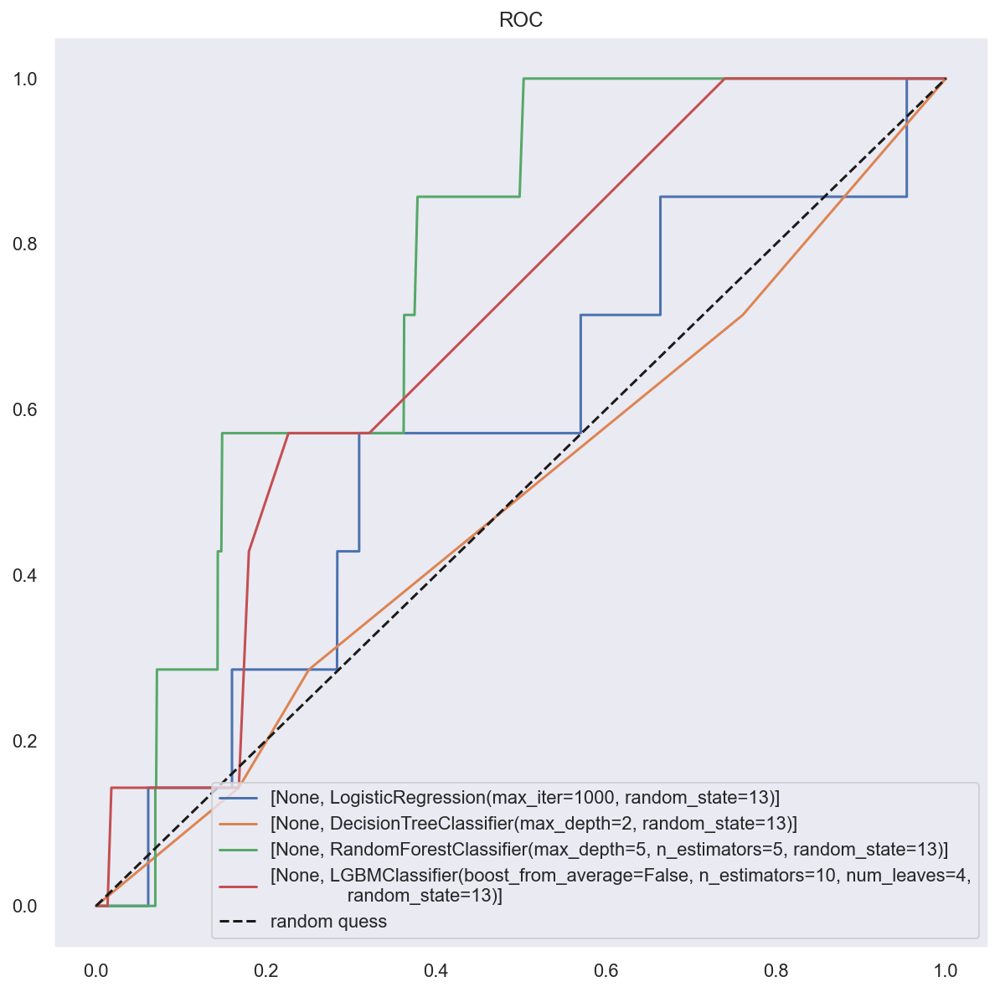

In [11]:
# null 삭제 
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list9 , result9 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [65]:
result9['null_del'], result9['encoded'], result9["scaler"], result9["sampler"] = 1, 0, 'None', "SVMSMOTE"
result9

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.938123,0.894316,0.882008,0.888119,0.920893,0.959949,0.000000,0.000000,0.000000,0.481053,1,0,None,SVMSMOTE
1,DecisionTree,0.873542,0.689157,0.994333,0.814085,0.910631,0.830503,0.001908,0.142857,0.003766,0.487453,1,0,None,SVMSMOTE
2,RandomForest,0.987658,0.963305,0.993524,0.978181,0.989459,0.977571,0.000000,0.000000,0.000000,0.489884,1,0,None,SVMSMOTE
3,LightGBM,0.948774,0.848427,0.993524,0.915261,0.962515,0.917975,0.003984,0.142857,0.007752,0.531287,1,0,None,SVMSMOTE
4,SVC,0.856241,0.660661,0.994536,0.793925,0.898705,0.802627,0.003263,0.285714,0.006452,0.544752,1,0,None,SVMSMOTE


(2) null 삭제, no scaler, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


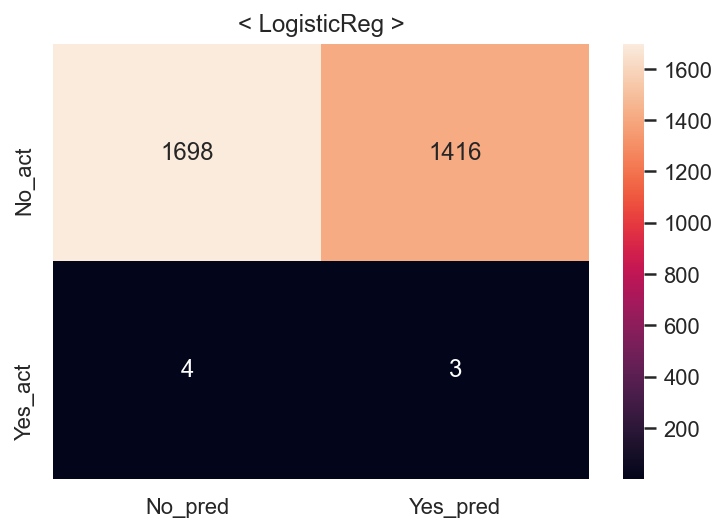

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


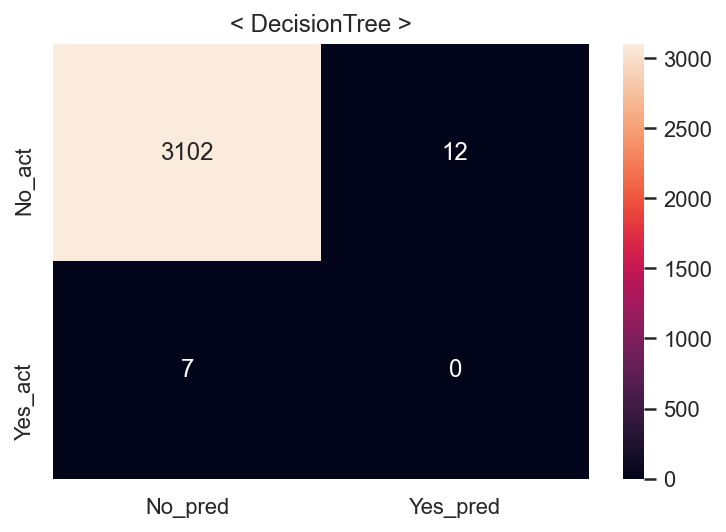

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


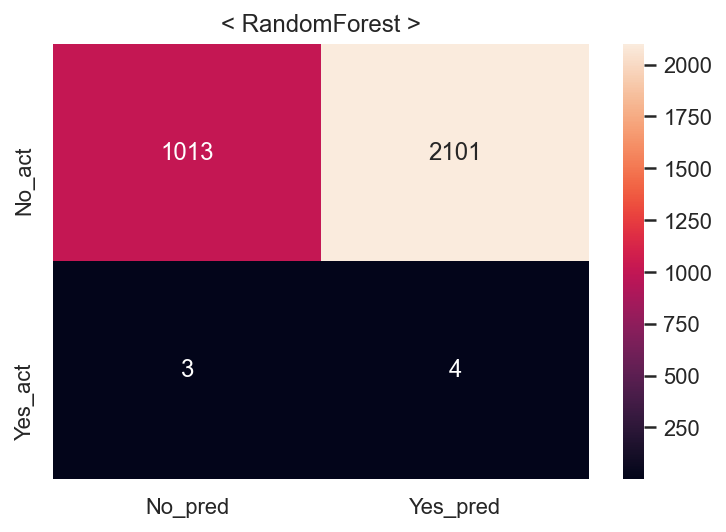

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


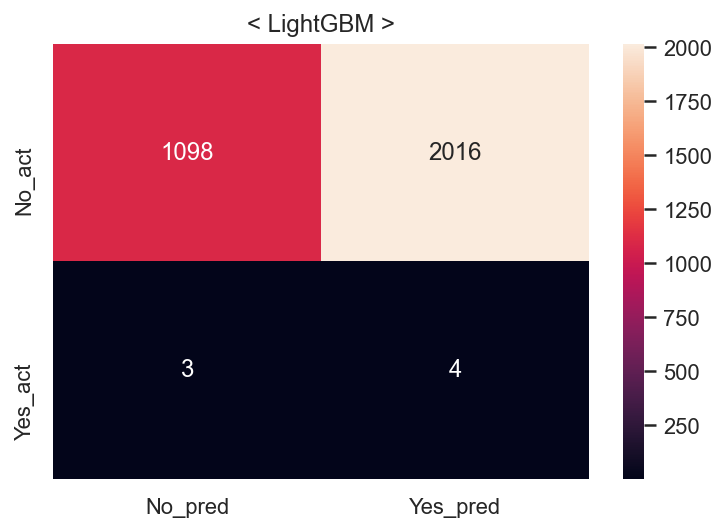

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  18.0s
====Done Evaluation====
====Done Evaluation====


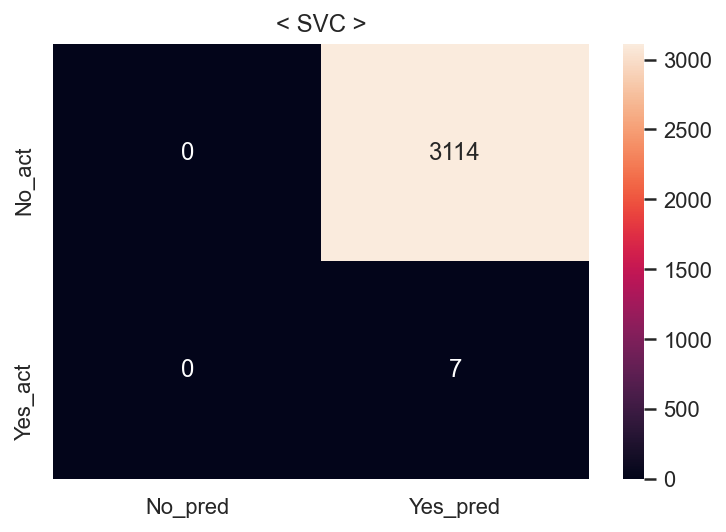

Fit time : 1.49 min


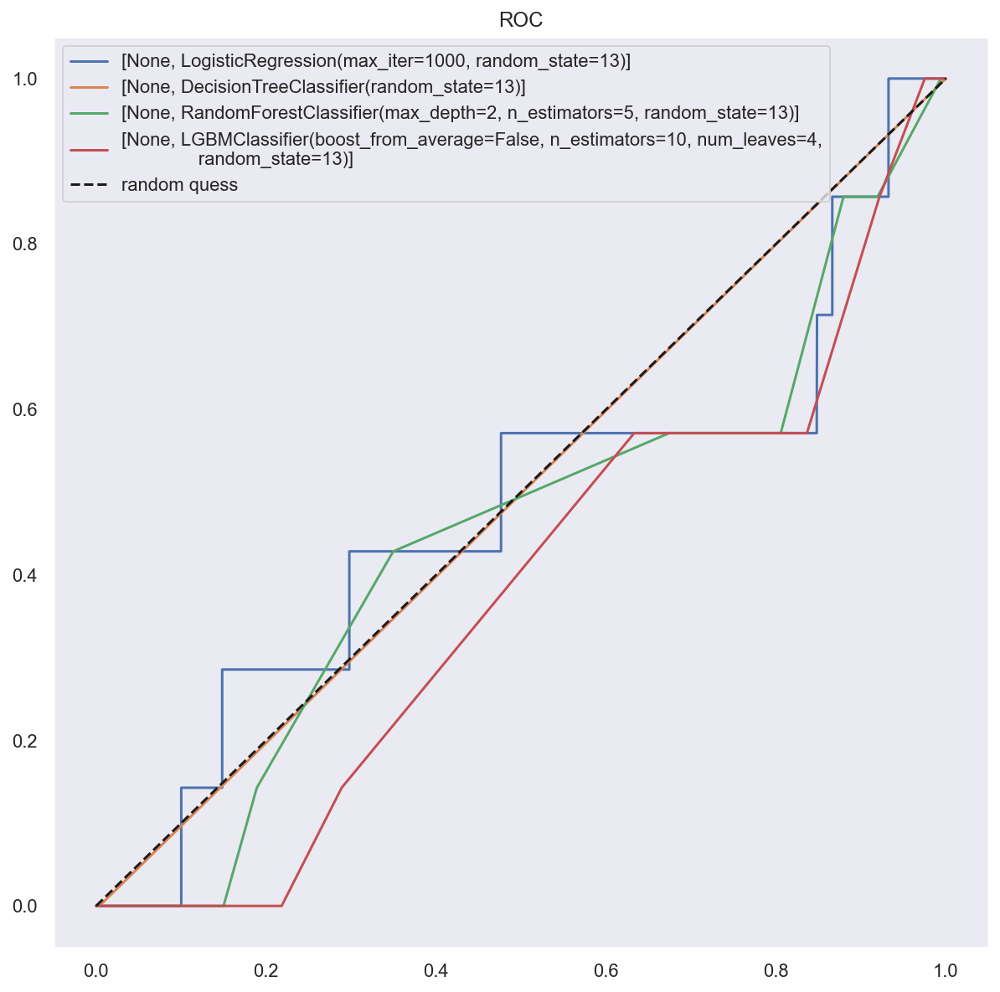

In [12]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list10 , result10 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [66]:
result10['null_del'], result10['encoded'], result10["scaler"], result10["sampler"] = 1, 0, 'None', "RandomOverSampler"
result10

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.610200,0.598754,0.668151,0.631552,0.610200,0.545018,0.002114,0.428571,0.004208,0.486925,1,0,None,RandomOverSampler
1,DecisionTree,0.999883,0.999766,1.000000,0.999883,0.999883,0.993912,0.000000,0.000000,0.000000,0.498073,1,0,None,RandomOverSampler
2,RandomForest,0.676624,0.607256,1.000000,0.755643,0.676624,0.325857,0.001900,0.571429,0.003788,0.448367,1,0,None,RandomOverSampler
3,LightGBM,0.666042,0.599550,1.000000,0.749649,0.666042,0.353092,0.001980,0.571429,0.003947,0.462015,1,0,None,RandomOverSampler
4,SVC,0.500000,0.500000,1.000000,0.666667,0.500000,0.002243,0.002243,1.000000,0.004476,0.500000,1,0,None,RandomOverSampler


### #6
(1) null 삭제, MinMax, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


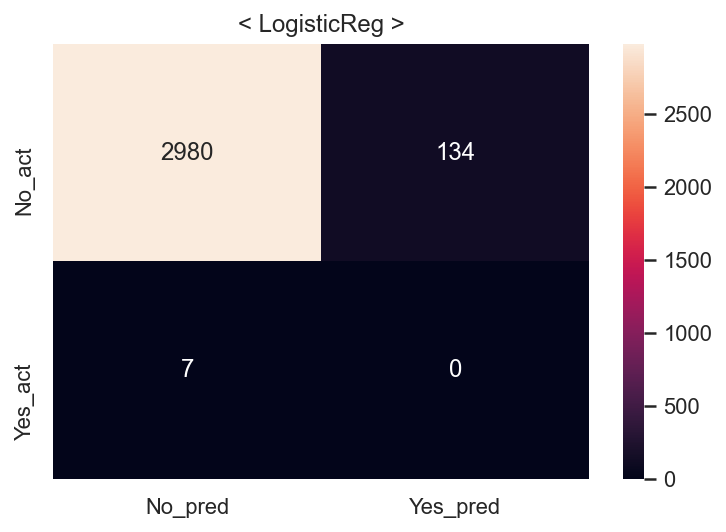

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


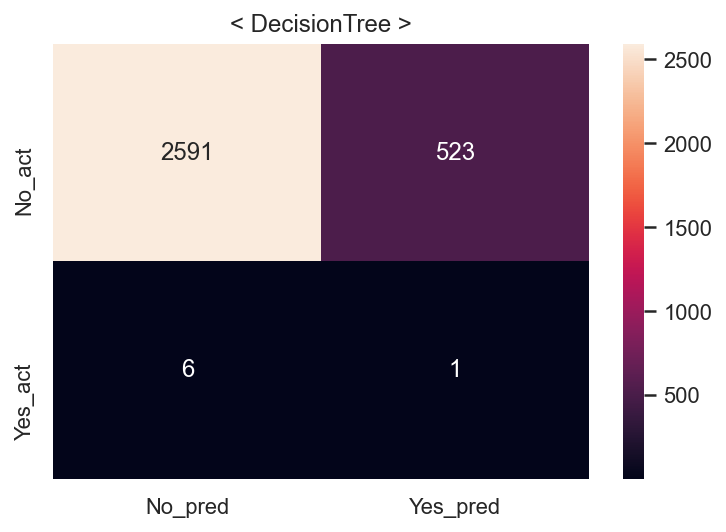

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


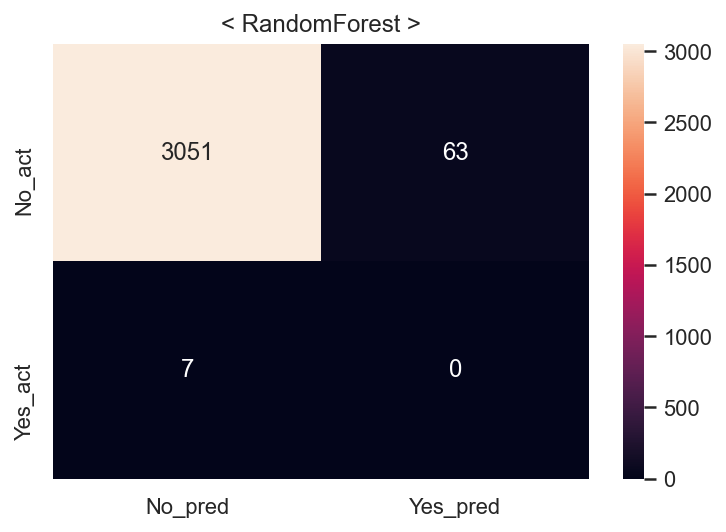

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


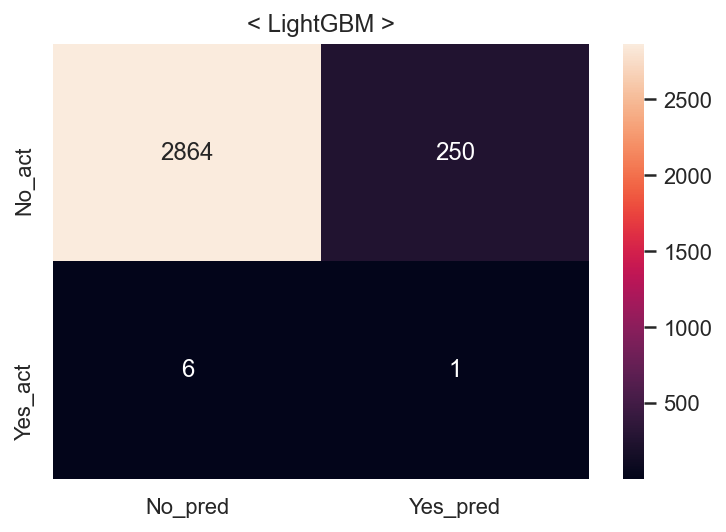

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.3s
====Done Evaluation====
====Done Evaluation====


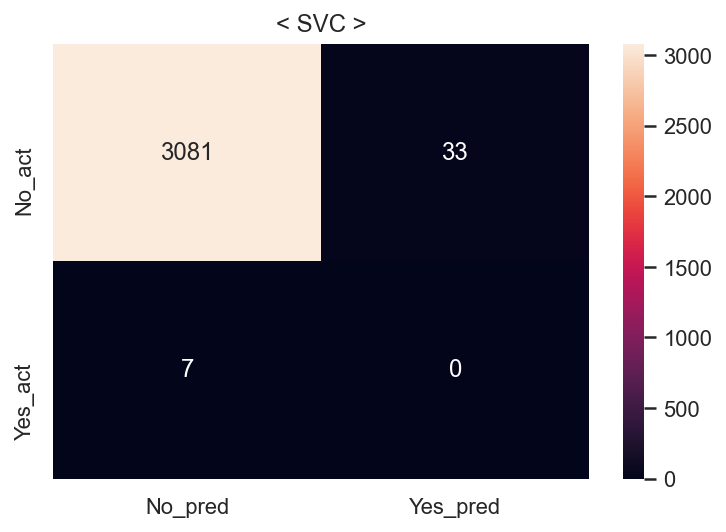

Fit time : 0.15 min


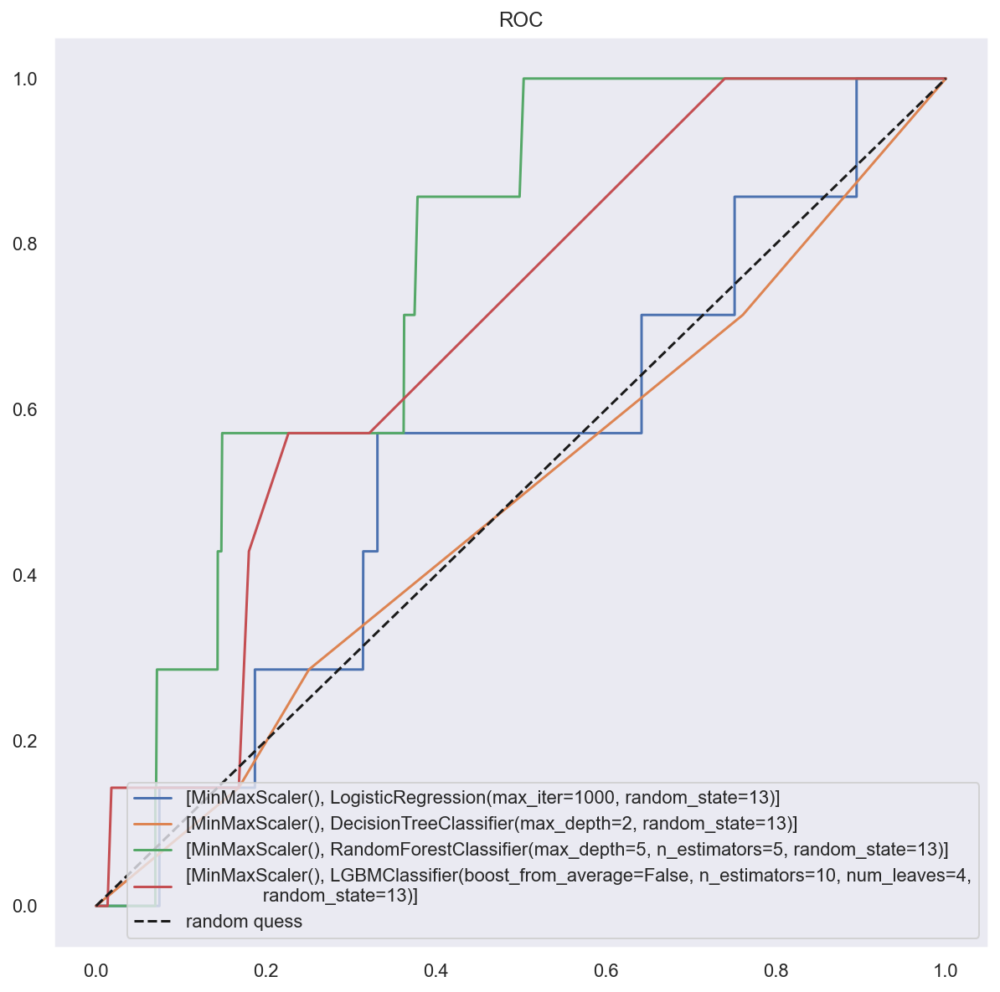

In [13]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list11 , result11 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [67]:
result11['null_del'], result11['encoded'], result11["scaler"], result11["sampler"] = 1, 0, 'MM', "SVMSMOTE"
result11

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.935869,0.887034,0.882008,0.884514,0.919331,0.954822,0.000000,0.000000,0.000000,0.478484,1,0,MM,SVMSMOTE
1,DecisionTree,0.873542,0.689157,0.994333,0.814085,0.910631,0.830503,0.001908,0.142857,0.003766,0.487453,1,0,MM,SVMSMOTE
2,RandomForest,0.987658,0.963305,0.993524,0.978181,0.989459,0.977571,0.000000,0.000000,0.000000,0.489884,1,0,MM,SVMSMOTE
3,LightGBM,0.948774,0.848427,0.993524,0.915261,0.962515,0.917975,0.003984,0.142857,0.007752,0.531287,1,0,MM,SVMSMOTE
4,SVC,0.990927,0.973455,0.994536,0.983882,0.992035,0.987184,0.000000,0.000000,0.000000,0.494701,1,0,MM,SVMSMOTE


(2) null 삭제, MinMax, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


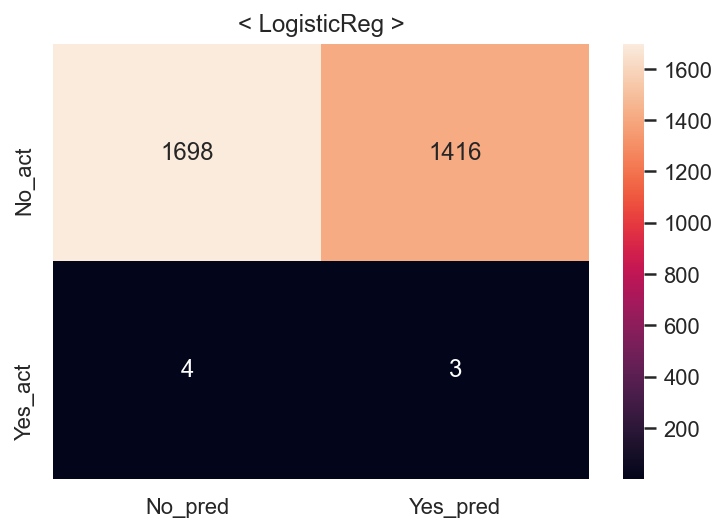

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


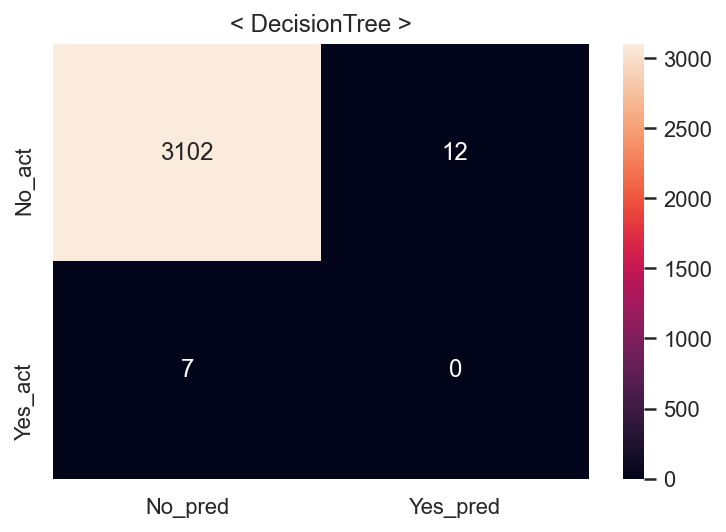

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


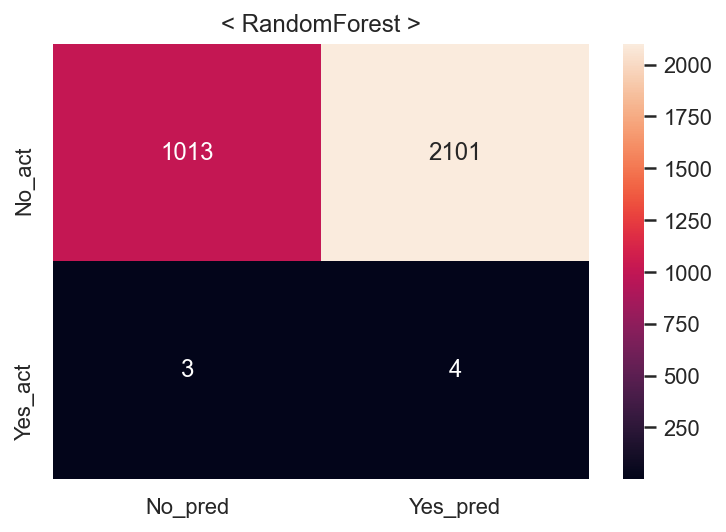

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


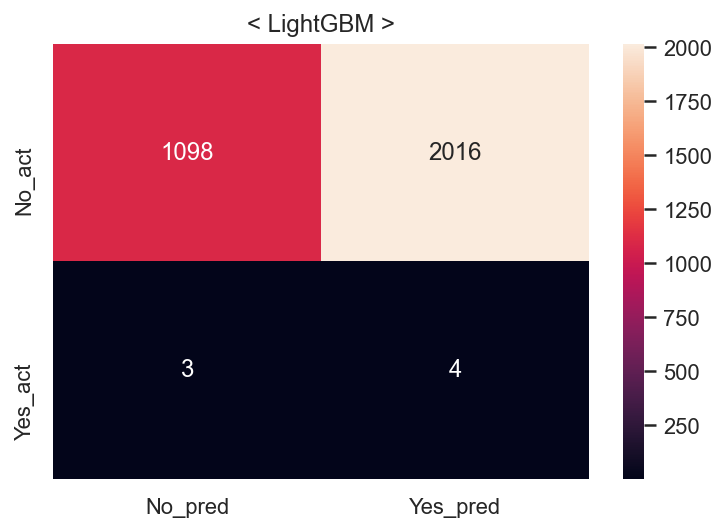

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   3.9s
====Done Evaluation====
====Done Evaluation====


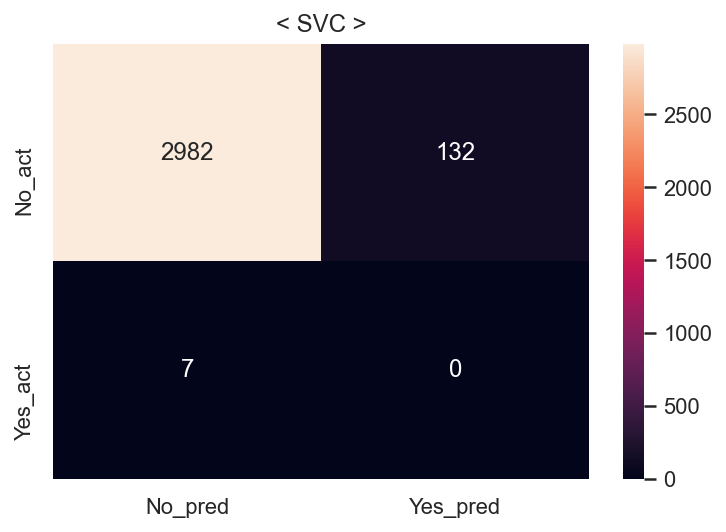

Fit time : 0.39 min


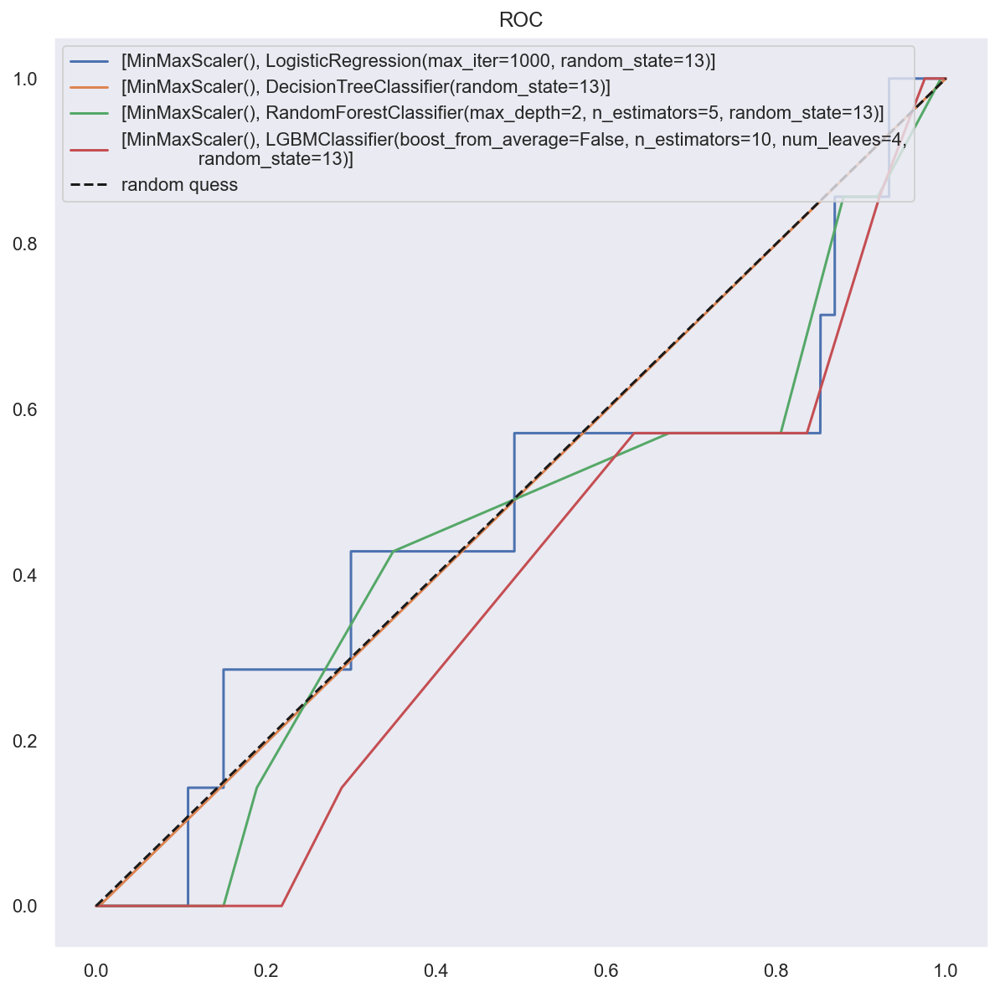

In [14]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list12 , result12 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [97]:
result12['null_del'], result12['encoded'], result12["scaler"], result12["sampler"] = 1, 0, 'MM', "RandomOverSampler"
result12

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.610005,0.598545,0.668151,0.631435,0.610005,0.545018,0.002114,0.428571,0.004208,0.486925,1,0,MM,RandomOverSampler
1,DecisionTree,0.999883,0.999766,1.000000,0.999883,0.999883,0.993912,0.000000,0.000000,0.000000,0.498073,1,0,MM,RandomOverSampler
2,RandomForest,0.676624,0.607256,1.000000,0.755643,0.676624,0.325857,0.001900,0.571429,0.003788,0.448367,1,0,MM,RandomOverSampler
3,LightGBM,0.666042,0.599550,1.000000,0.749649,0.666042,0.353092,0.001980,0.571429,0.003947,0.462015,1,0,MM,RandomOverSampler
4,SVC,0.979967,0.961478,1.000000,0.980361,0.979967,0.955463,0.000000,0.000000,0.000000,0.478805,1,0,MM,RandomOverSampler


### #7
(1) null 삭제, Standard, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


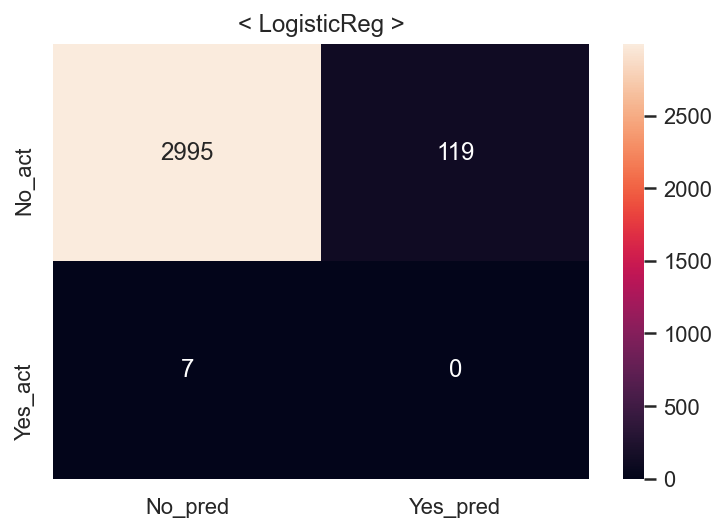

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


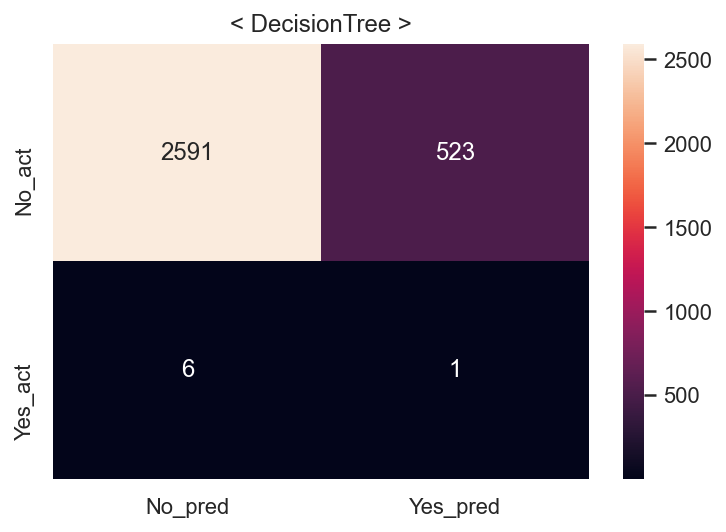

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


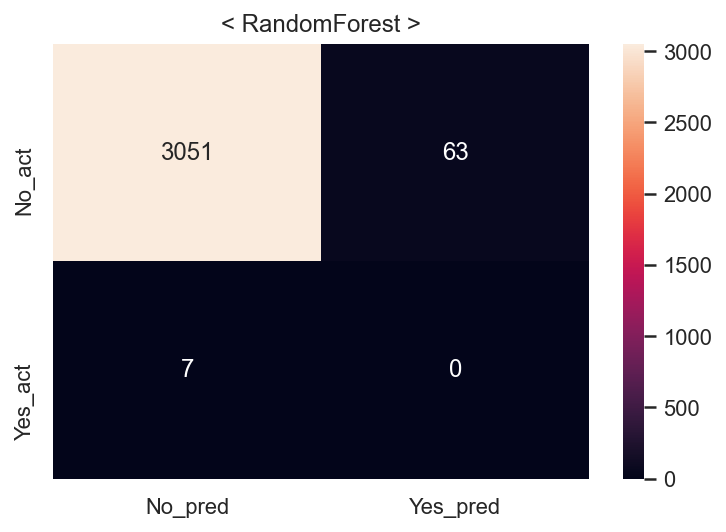

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


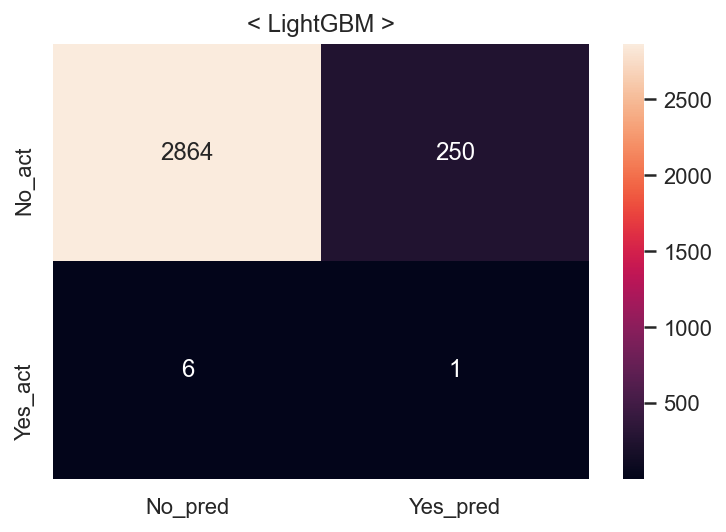

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.9s
====Done Evaluation====
====Done Evaluation====


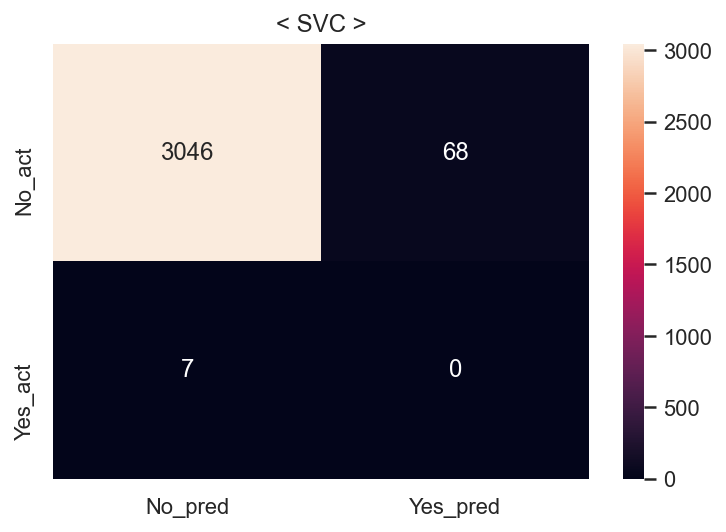

Fit time : 0.2 min


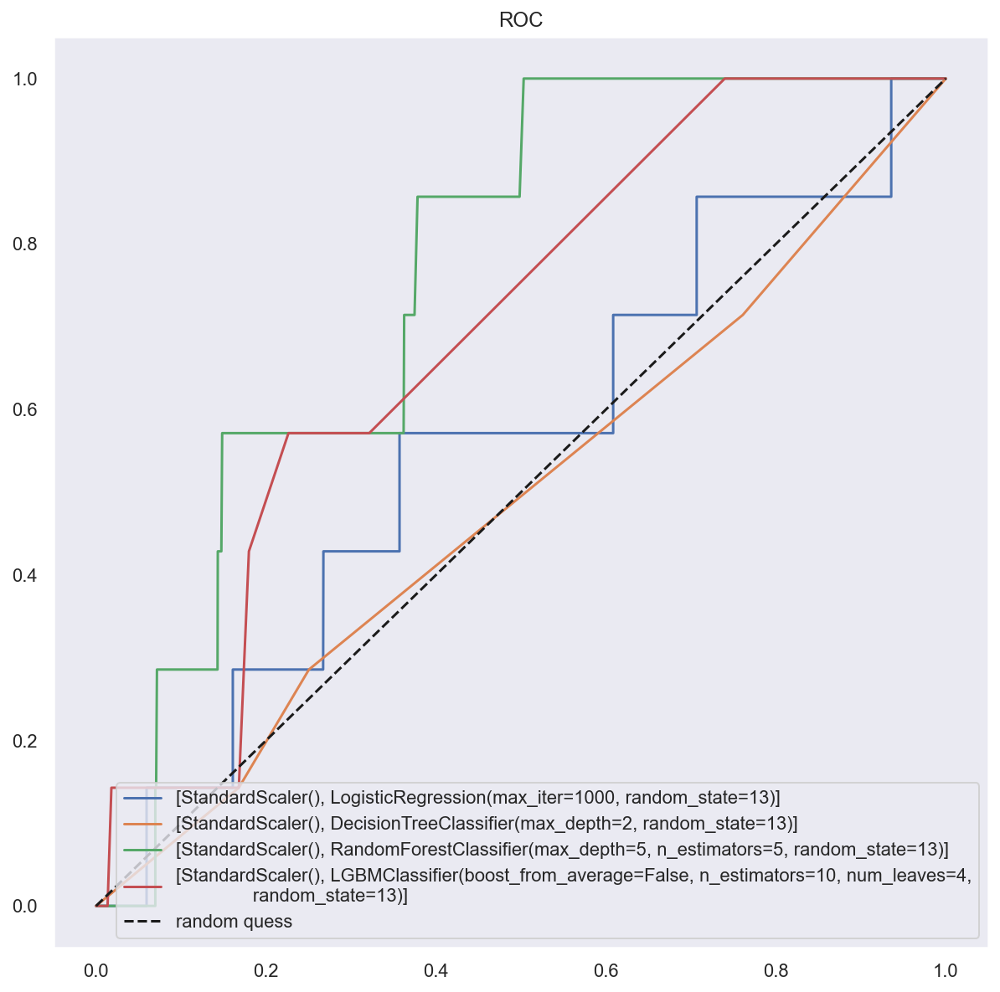

In [15]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list13 , result13 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [96]:
result13['null_del'], result13['encoded'], result13["scaler"], result13["sampler"] = 1, 0, 'SD', "SVMSMOTE"
result13

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.937785,0.893216,0.882008,0.887576,0.920659,0.959628,0.000000,0.000000,0.000000,0.480893,1,0,SD,SVMSMOTE
1,DecisionTree,0.873542,0.689157,0.994333,0.814085,0.910631,0.830503,0.001908,0.142857,0.003766,0.487453,1,0,SD,SVMSMOTE
2,RandomForest,0.987658,0.963305,0.993524,0.978181,0.989459,0.977571,0.000000,0.000000,0.000000,0.489884,1,0,SD,SVMSMOTE
3,LightGBM,0.948774,0.848427,0.993524,0.915261,0.962515,0.917975,0.003984,0.142857,0.007752,0.531287,1,0,SD,SVMSMOTE
4,SVC,0.987602,0.960585,0.996357,0.978144,0.990290,0.975969,0.000000,0.000000,0.000000,0.489082,1,0,SD,SVMSMOTE


(2) null 삭제, Standard, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


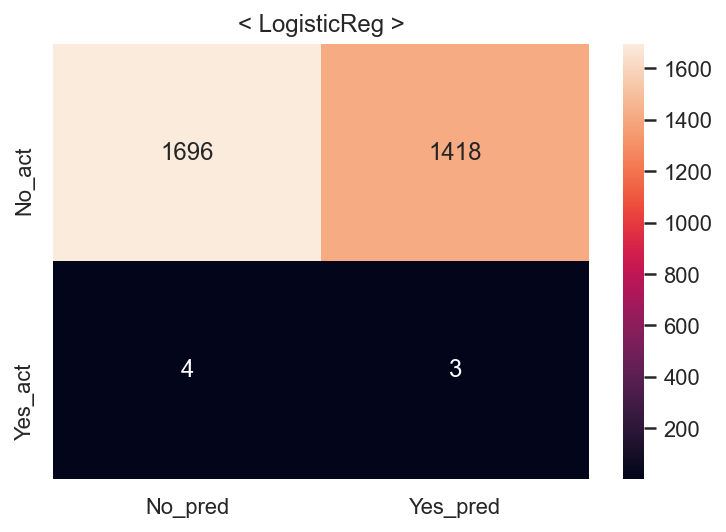

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


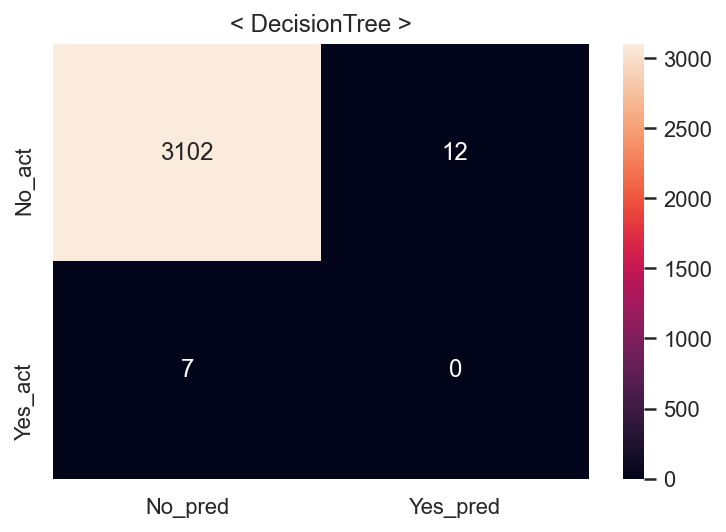

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


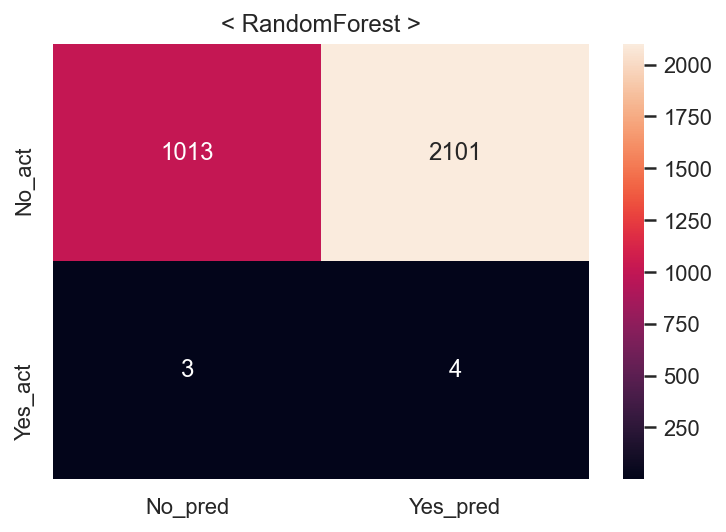

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


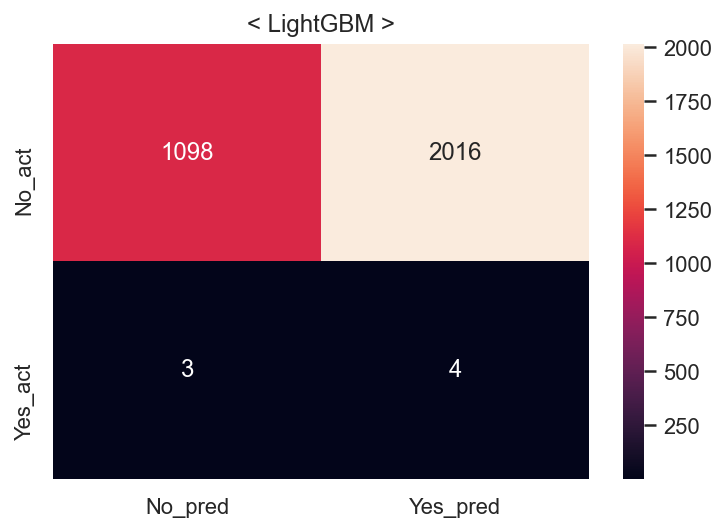

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.9s
====Done Evaluation====
====Done Evaluation====


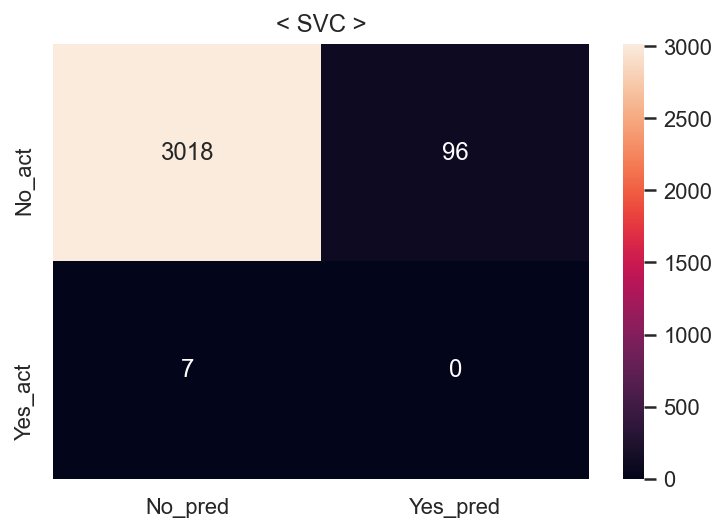

Fit time : 0.32 min


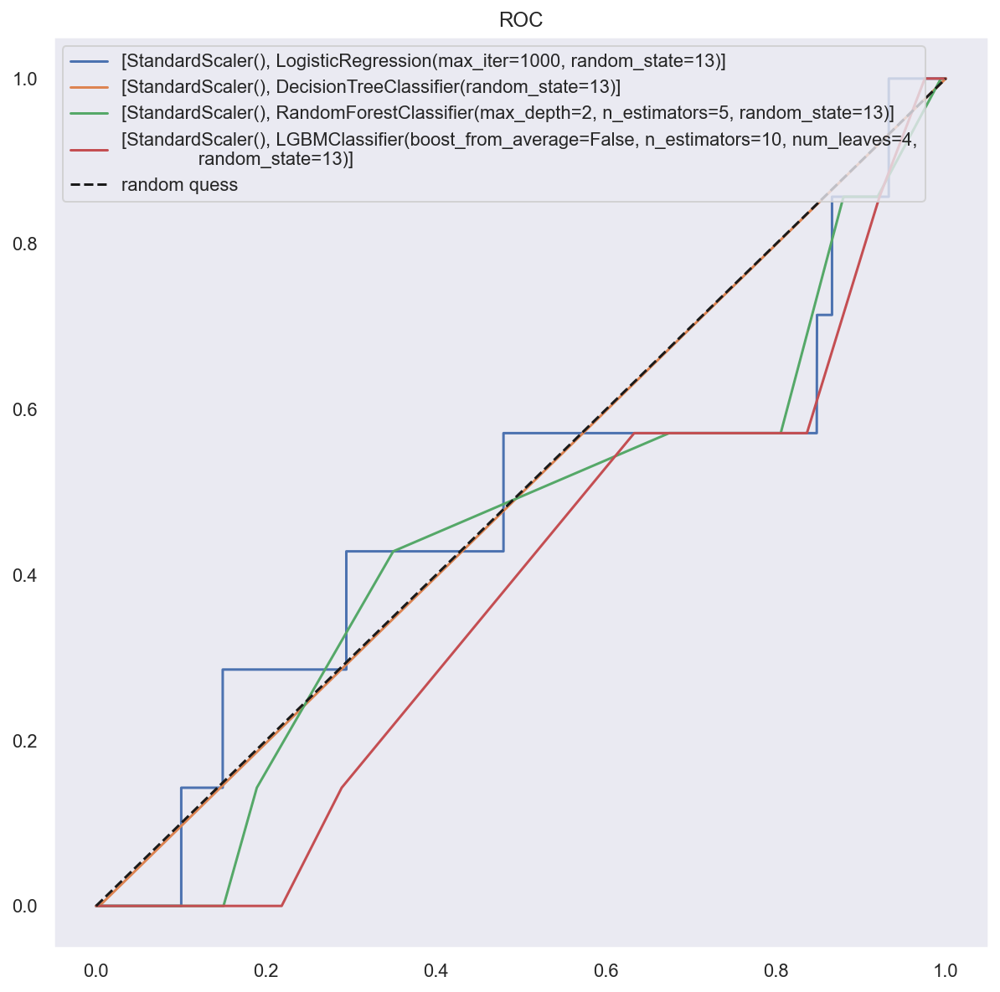

In [16]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list14 , result14 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [70]:
result14['null_del'], result14['encoded'], result14["scaler"], result14["sampler"] = 1, 0, 'SD', "RandomOverSampler"
result14

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.610005,0.598545,0.668151,0.631435,0.610005,0.544377,0.002111,0.428571,0.004202,0.486604,1,0,SD,RandomOverSampler
1,DecisionTree,0.999883,0.999766,1.000000,0.999883,0.999883,0.993912,0.000000,0.000000,0.000000,0.498073,1,0,SD,RandomOverSampler
2,RandomForest,0.676624,0.607256,1.000000,0.755643,0.676624,0.325857,0.001900,0.571429,0.003788,0.448367,1,0,SD,RandomOverSampler
3,LightGBM,0.666042,0.599550,1.000000,0.749649,0.666042,0.353092,0.001980,0.571429,0.003947,0.462015,1,0,SD,RandomOverSampler
4,SVC,0.989535,0.979498,1.000000,0.989643,0.989535,0.966998,0.000000,0.000000,0.000000,0.484586,1,0,SD,RandomOverSampler


### #8
(1) null 삭제, Robust, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


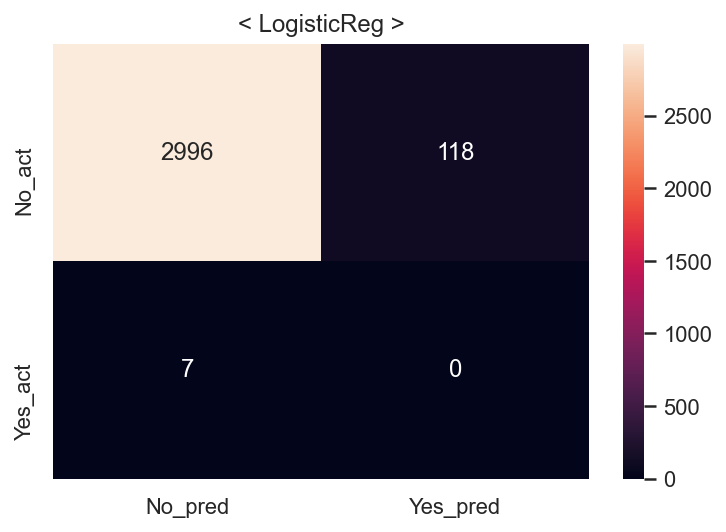

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


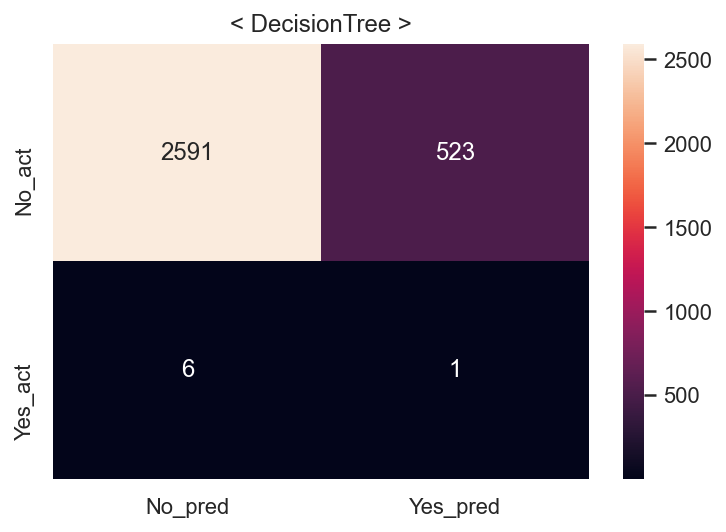

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


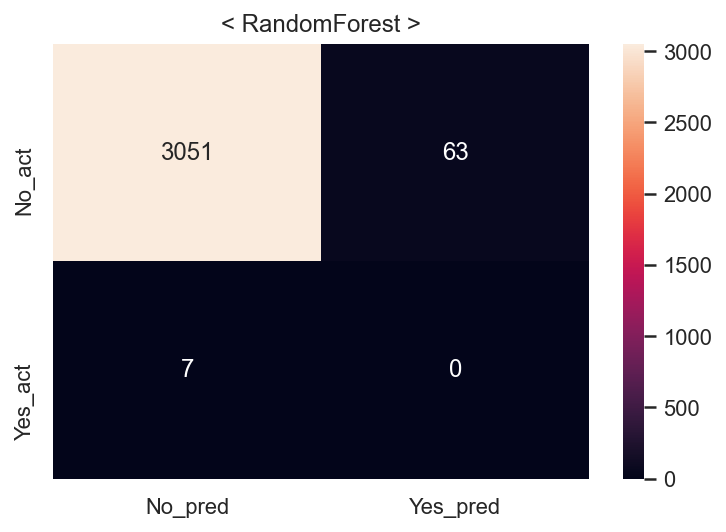

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


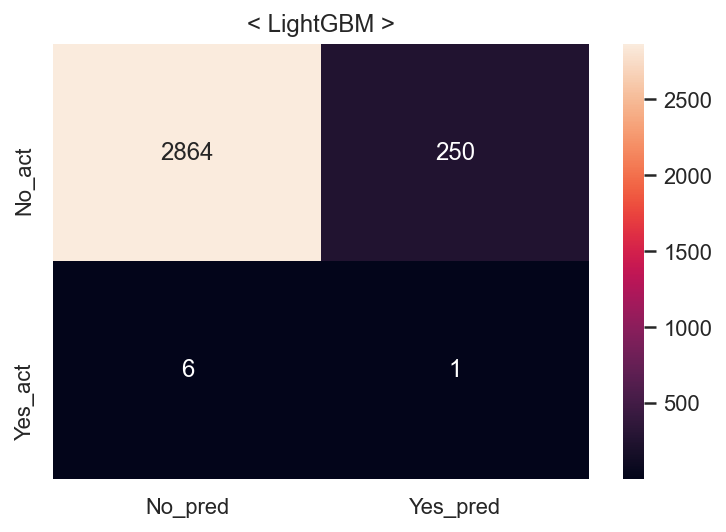

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  11.1s
====Done Evaluation====
====Done Evaluation====


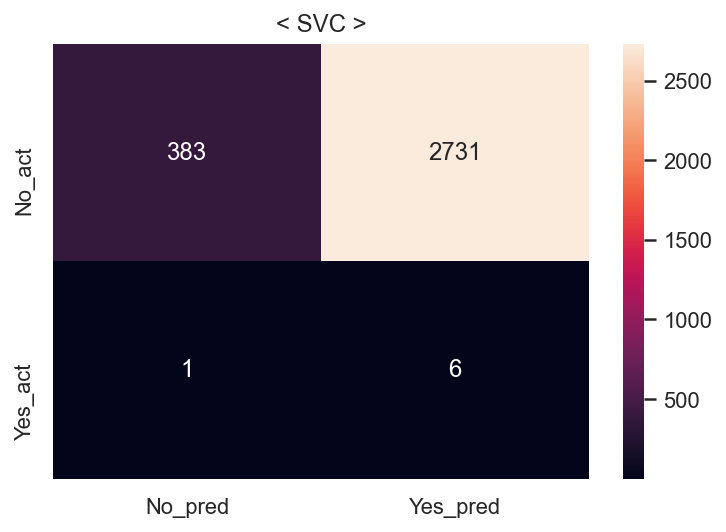

Fit time : 0.84 min


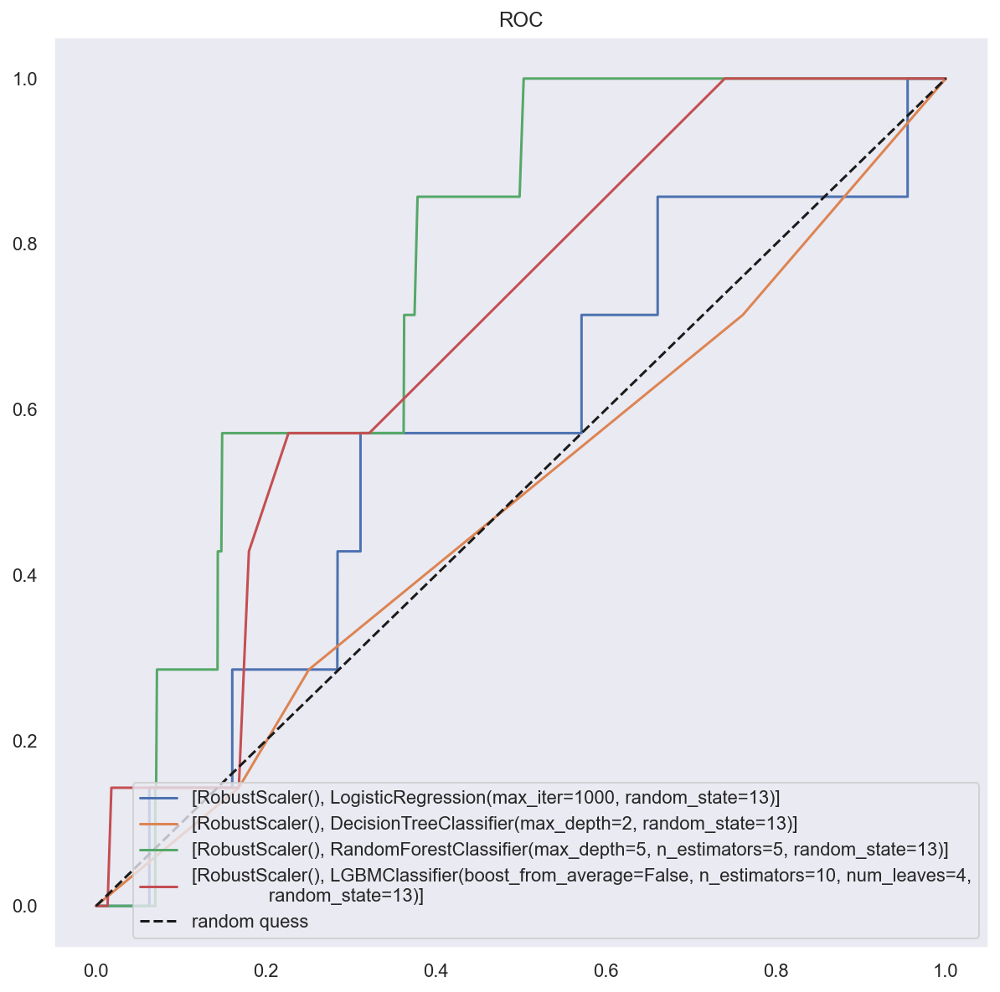

In [17]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list15 , result15 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [71]:
result15['null_del'], result15['encoded'], result15["scaler"], result15["sampler"] = 1, 0, 'RB', "SVMSMOTE"
result15

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.938011,0.893949,0.882008,0.887938,0.920815,0.959949,0.000000,0.000000,0.000000,0.481053,1,0,RB,SVMSMOTE
1,DecisionTree,0.873542,0.689157,0.994333,0.814085,0.910631,0.830503,0.001908,0.142857,0.003766,0.487453,1,0,RB,SVMSMOTE
2,RandomForest,0.987658,0.963305,0.993524,0.978181,0.989459,0.977571,0.000000,0.000000,0.000000,0.489884,1,0,RB,SVMSMOTE
3,LightGBM,0.948774,0.848427,0.993524,0.915261,0.962515,0.917975,0.003984,0.142857,0.007752,0.531287,1,0,RB,SVMSMOTE
4,SVC,0.367371,0.305599,0.999798,0.468113,0.561559,0.124640,0.002192,0.857143,0.004373,0.490068,1,0,RB,SVMSMOTE


(2) null 삭제, Robust, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.2s
====Done Evaluation====
====Done Evaluation====


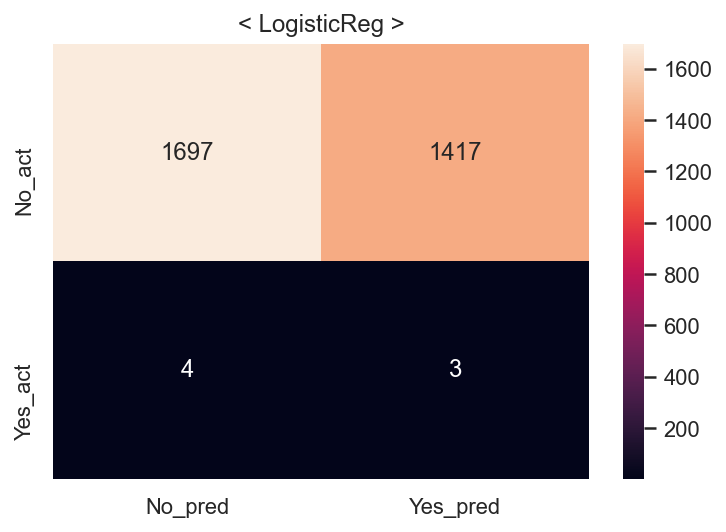

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


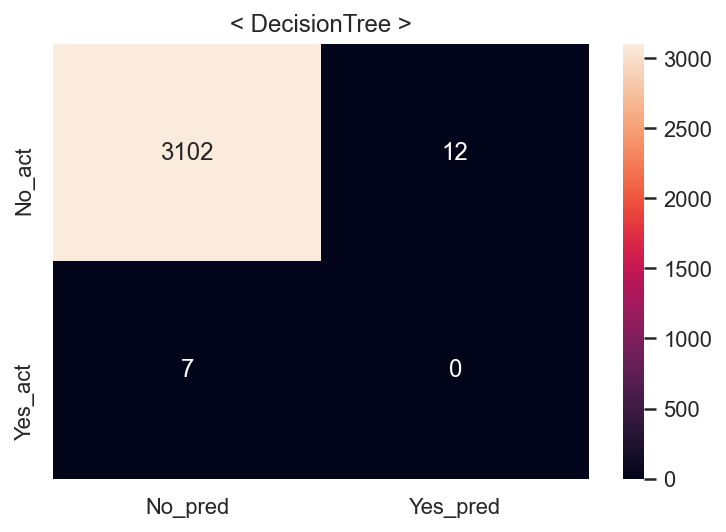

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


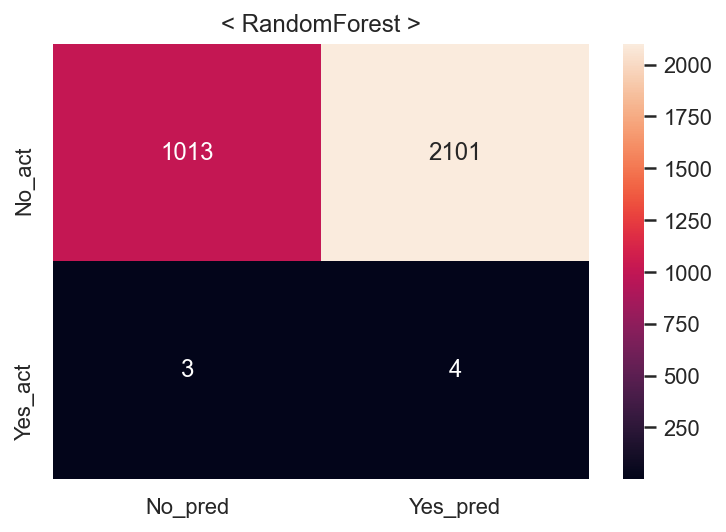

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


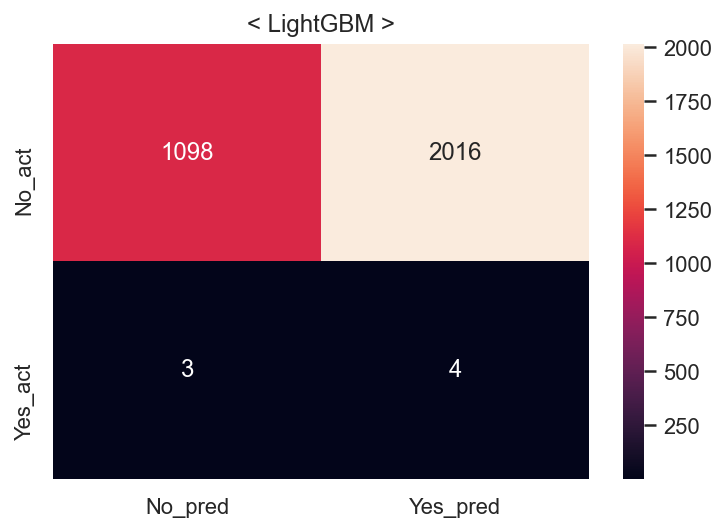

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  15.7s
====Done Evaluation====
====Done Evaluation====


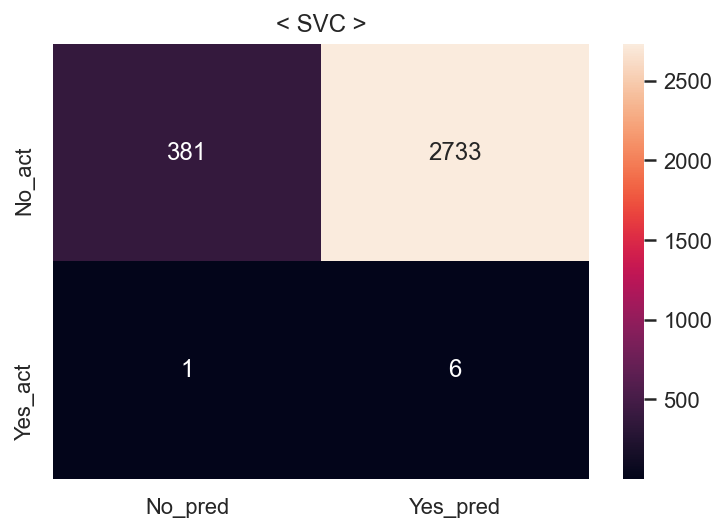

Fit time : 1.36 min


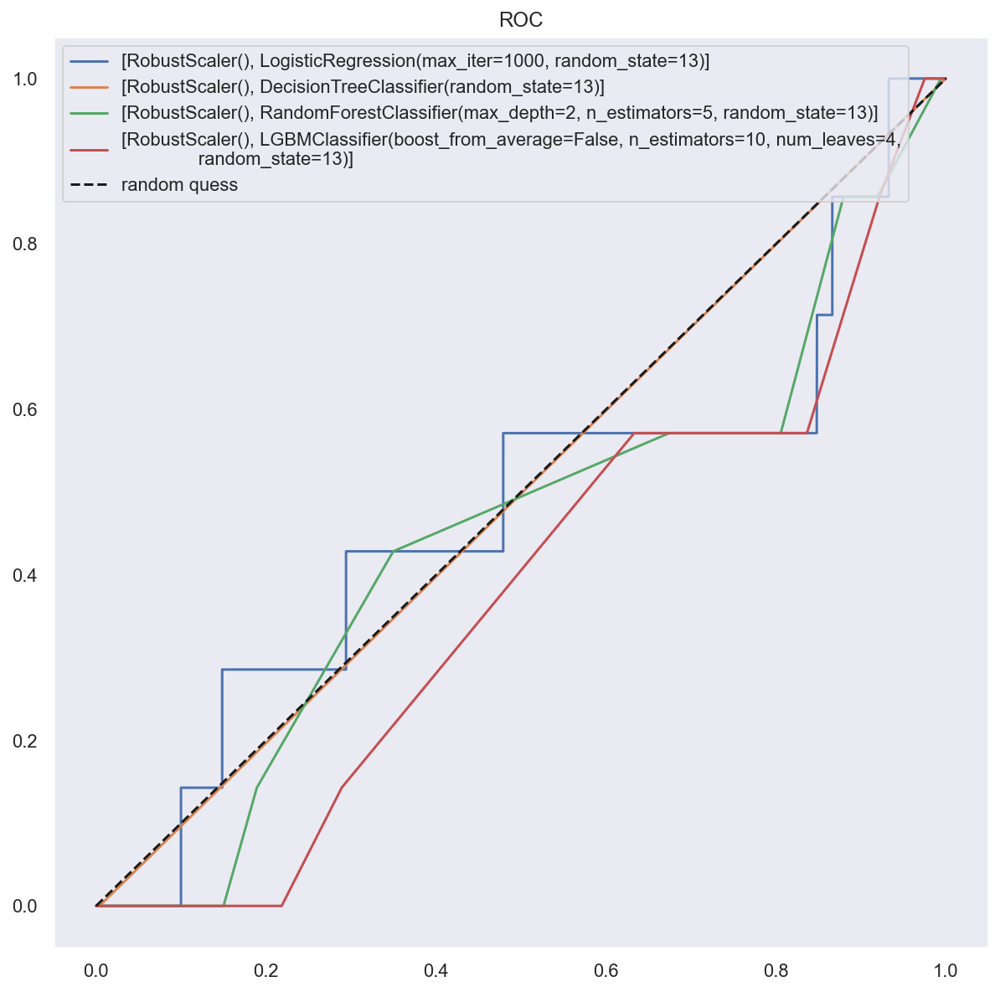

In [18]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list16 , result16 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [72]:
result16['null_del'], result16['encoded'], result16["scaler"], result16["sampler"] = 1, 0, 'RB', "RandomOverSampler"
result16

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.610122,0.598670,0.668151,0.631505,0.610122,0.544697,0.002113,0.428571,0.004205,0.486765,1,0,RB,RandomOverSampler
1,DecisionTree,0.999883,0.999766,1.000000,0.999883,0.999883,0.993912,0.000000,0.000000,0.000000,0.498073,1,0,RB,RandomOverSampler
2,RandomForest,0.676624,0.607256,1.000000,0.755643,0.676624,0.325857,0.001900,0.571429,0.003788,0.448367,1,0,RB,RandomOverSampler
3,LightGBM,0.666042,0.599550,1.000000,0.749649,0.666042,0.353092,0.001980,0.571429,0.003947,0.462015,1,0,RB,RandomOverSampler
4,SVC,0.561699,0.532878,1.000000,0.695265,0.561699,0.123999,0.002191,0.857143,0.004370,0.489747,1,0,RB,RandomOverSampler


## 2. 원핫인코딩 o

### #9
(1) null 유지, no scaler, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


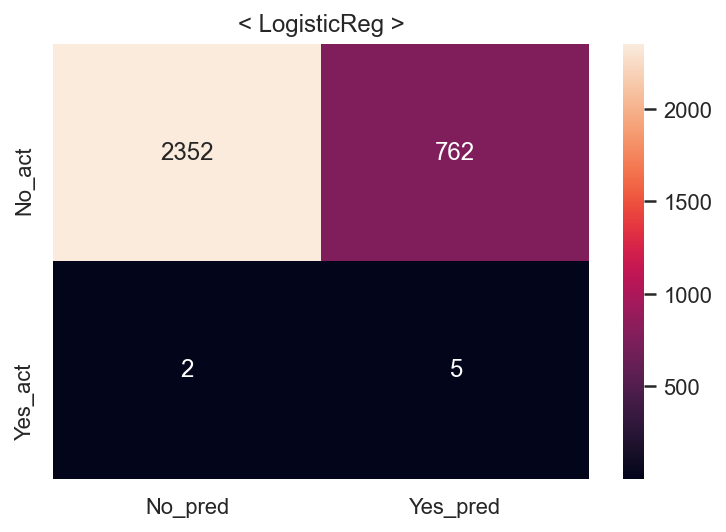

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


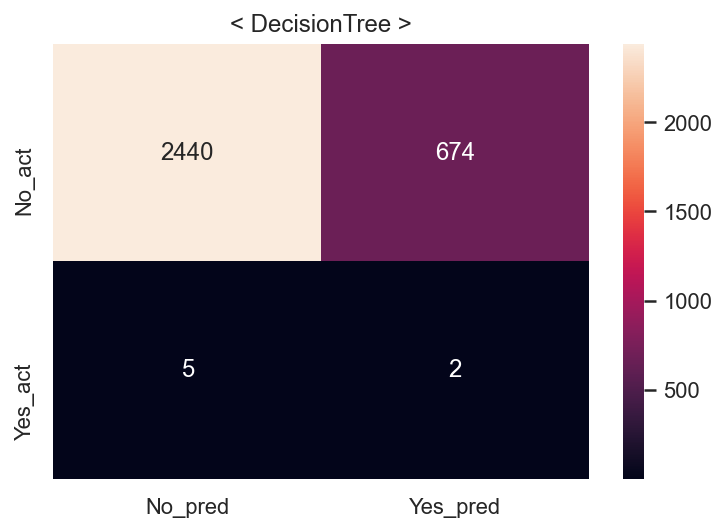

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


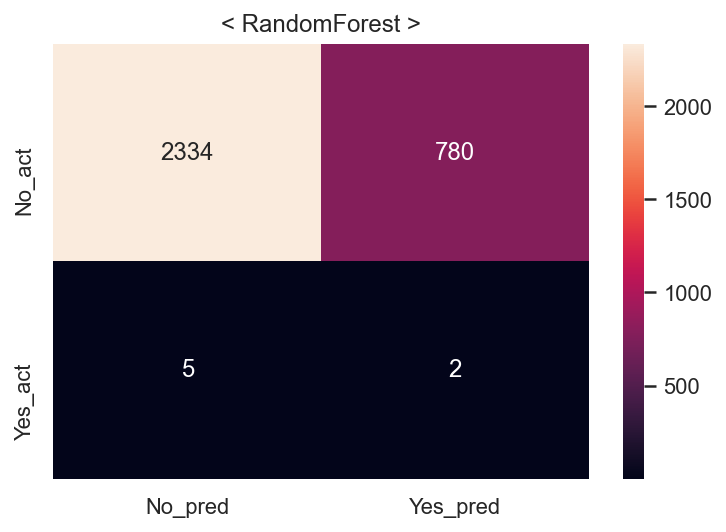

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


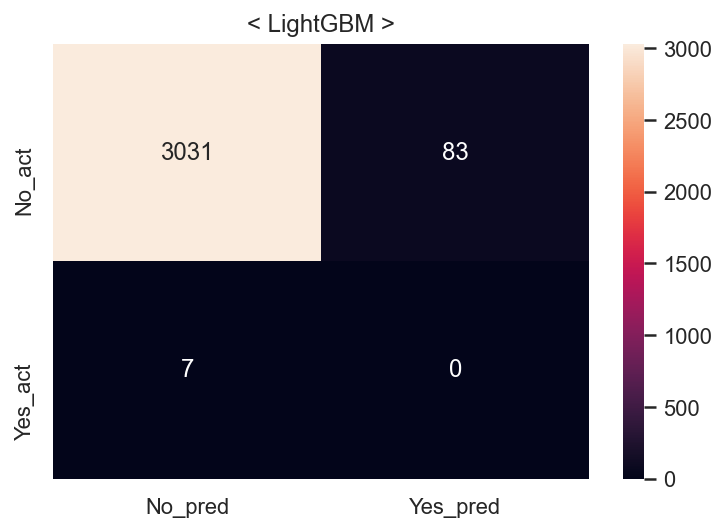

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  17.4s
====Done Evaluation====
====Done Evaluation====


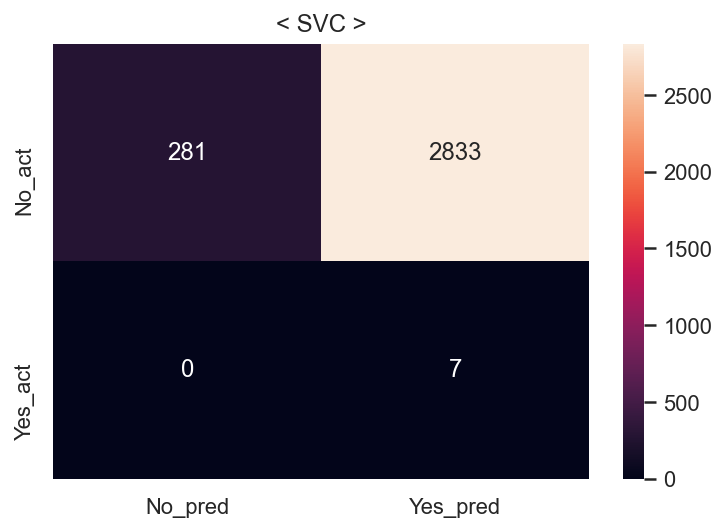

Fit time : 1.43 min


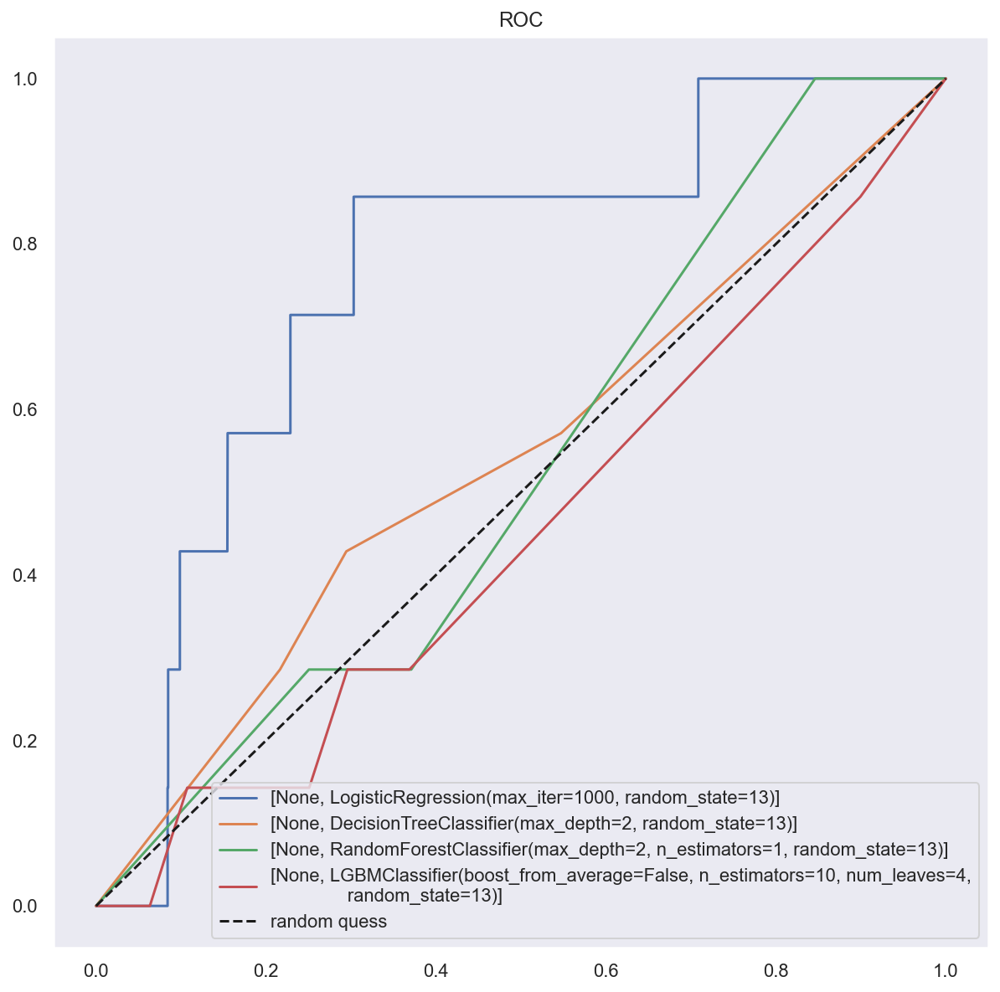

In [19]:
# 1hot
cols_1hot = df_do.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
df_do_1h = pd.get_dummies(df_do, columns=cols_1hot)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list17 , result17 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [73]:
result17['null_del'], result17['encoded'], result17["scaler"], result17["sampler"] = 0, 1, 'None', "SVMSMOTE"
result17

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.821133,0.609466,0.995547,0.756071,0.874687,0.755207,0.006519,0.714286,0.012920,0.734792,0,1,None,SVMSMOTE
1,DecisionTree,0.917385,0.773321,0.994940,0.870243,0.941199,0.782442,0.002959,0.285714,0.005857,0.534636,0,1,None,SVMSMOTE
2,RandomForest,0.811722,0.597064,0.995952,0.746568,0.868290,0.748478,0.002558,0.285714,0.005070,0.517616,0,1,None,SVMSMOTE
3,LightGBM,0.986137,0.958049,0.993726,0.975561,0.988467,0.971163,0.000000,0.000000,0.000000,0.486673,0,1,None,SVMSMOTE
4,SVC,0.335813,0.295293,0.999190,0.455863,0.539505,0.092278,0.002465,1.000000,0.004917,0.545119,0,1,None,SVMSMOTE


(2) null 유지, no scaler, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


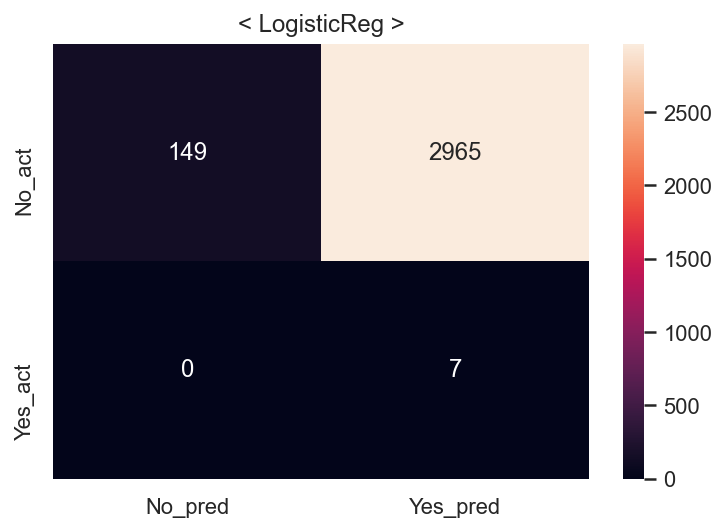

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


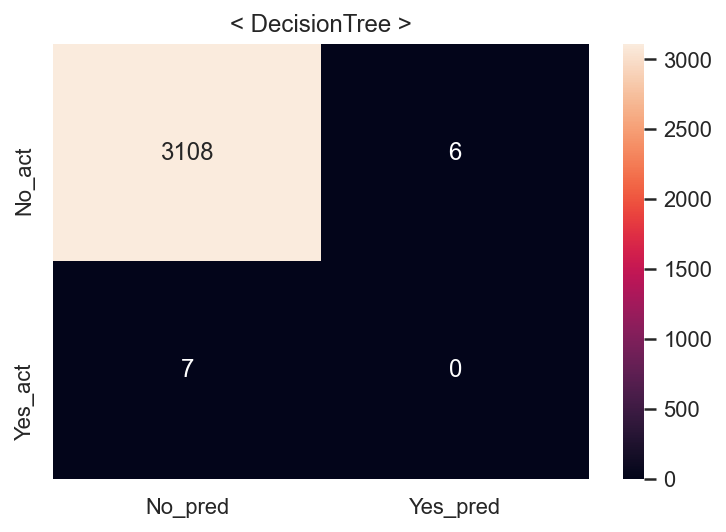

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


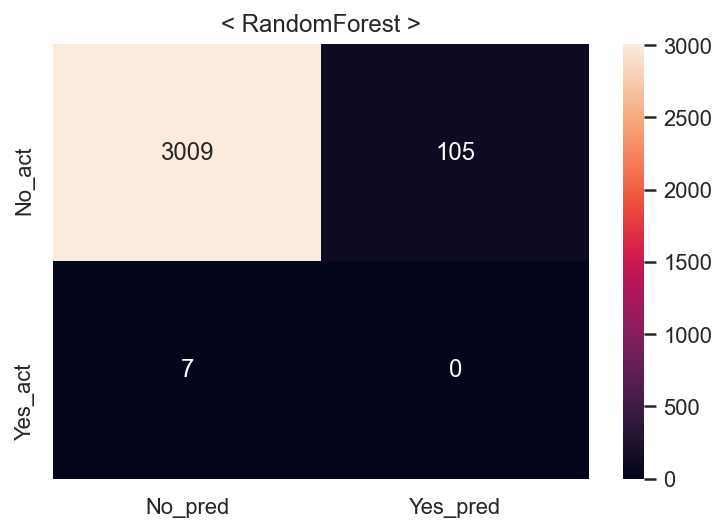

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


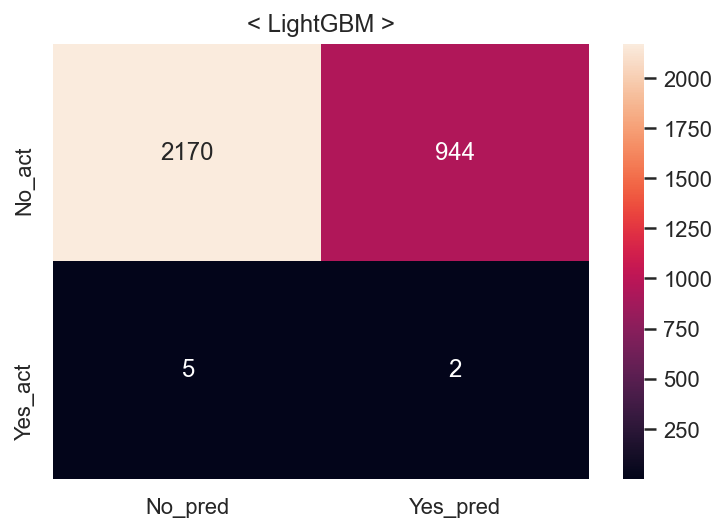

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=26.0min
====Done Evaluation====
====Done Evaluation====


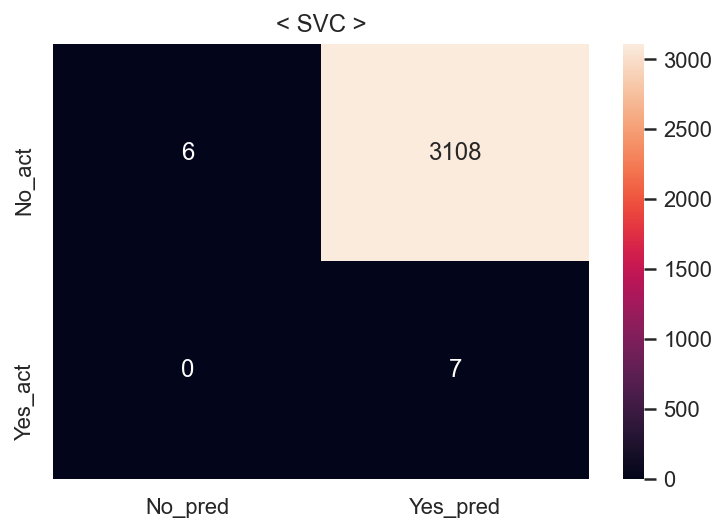

Fit time : 345.18 min


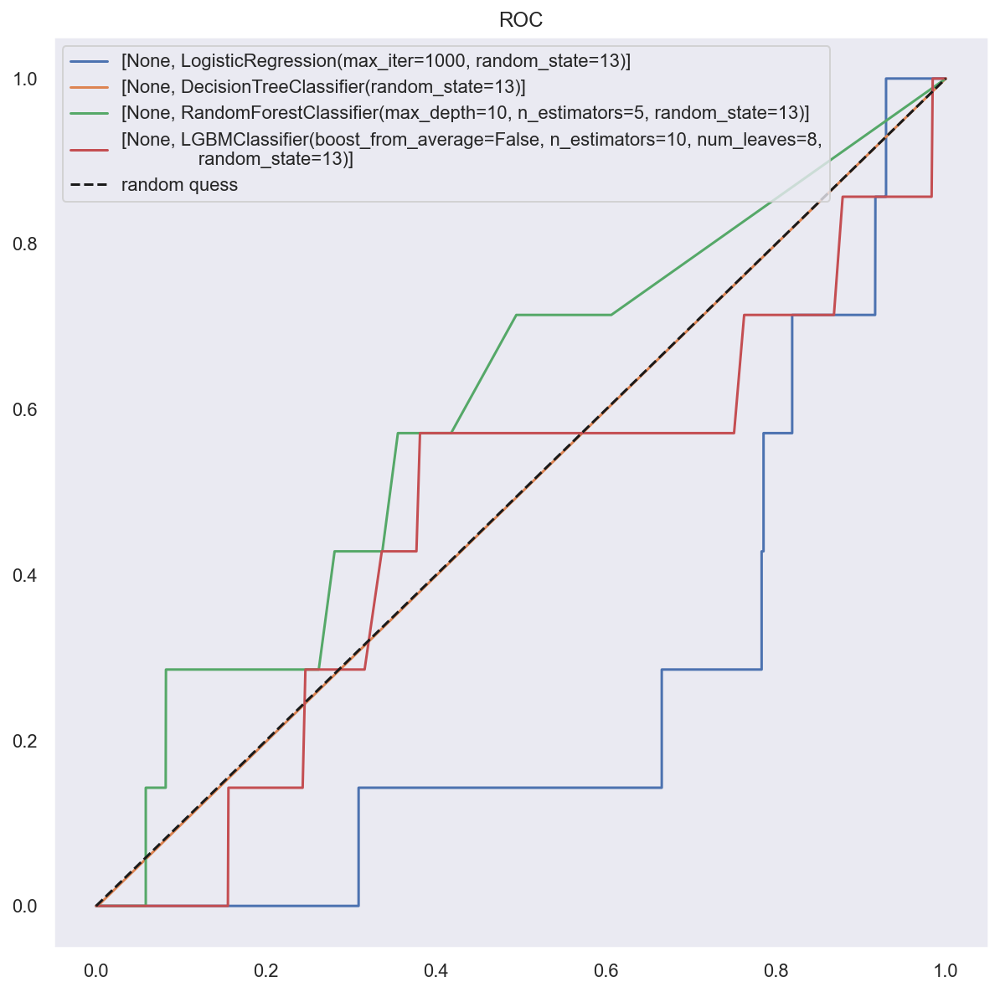

In [20]:
# 1hot
cols_1hot = df_do.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
df_do_1h = pd.get_dummies(df_do, columns=cols_1hot)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit
cv_list18 , result18 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [74]:
result18['null_del'], result18['encoded'], result18["scaler"], result18["sampler"] = 0, 1, 'None', "RandomOverSampler"
result18

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.529171,0.515024,1.0,0.679888,0.529171,0.049984,0.002355,1.000000,0.004700,0.523924,0,1,None,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.0,1.000000,1.000000,0.995835,0.000000,0.000000,0.000000,0.499037,0,1,None,RandomOverSampler
2,RandomForest,0.990667,0.981676,1.0,0.990753,0.990667,0.964114,0.000000,0.000000,0.000000,0.483141,0,1,None,RandomOverSampler
3,LightGBM,0.904483,0.839607,1.0,0.912811,0.904483,0.695931,0.002114,0.285714,0.004197,0.491284,0,1,None,RandomOverSampler
4,SVC,0.500898,0.500449,1.0,0.667066,0.500898,0.004165,0.002247,1.000000,0.004484,0.500963,0,1,None,RandomOverSampler


### #10
(1) null 유지, MinMax, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


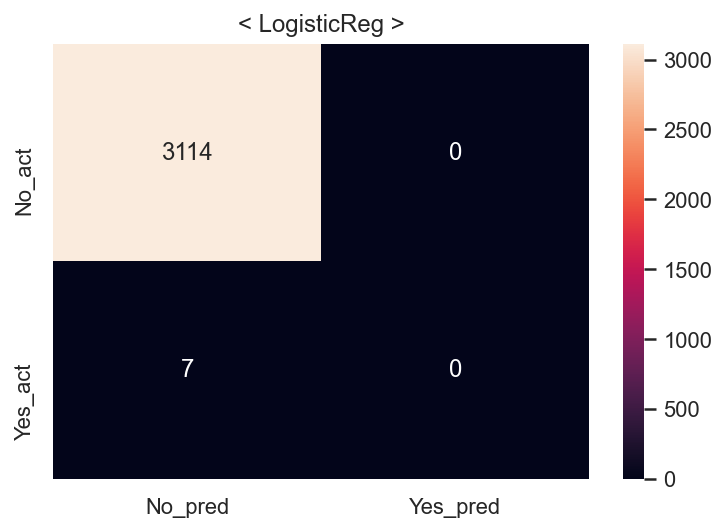

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


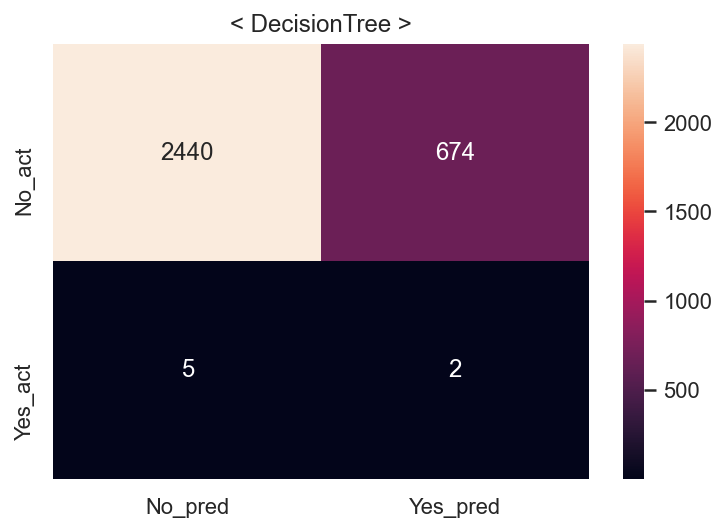

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


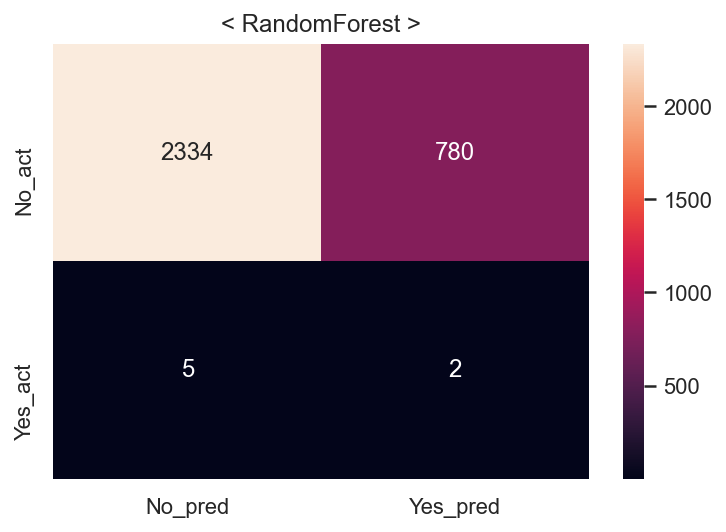

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


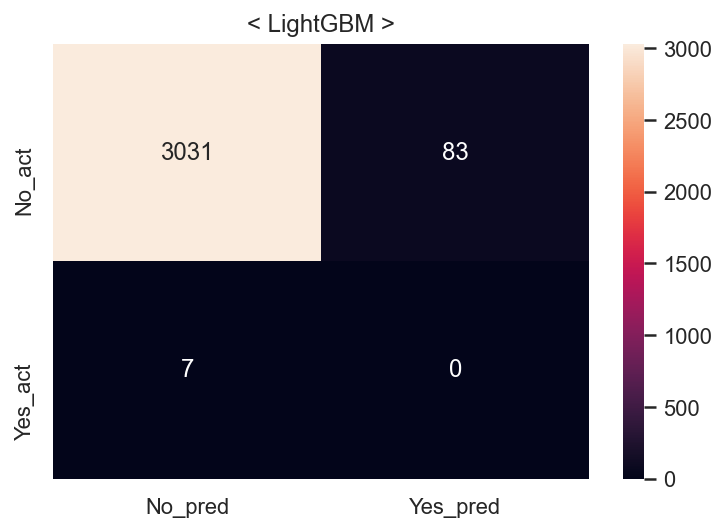

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


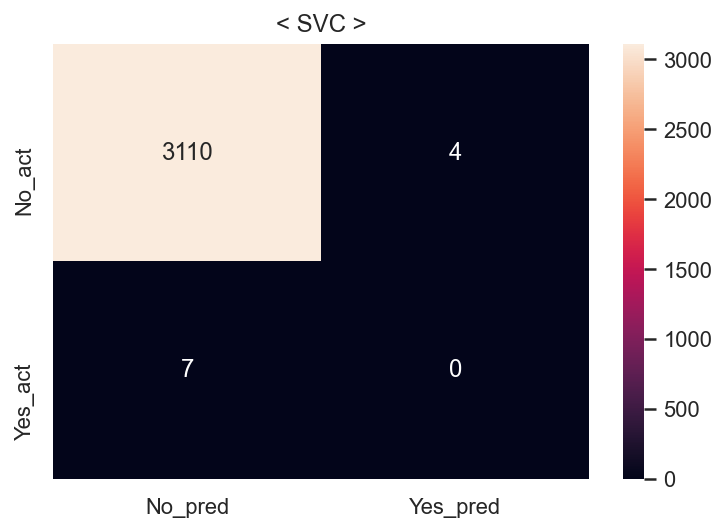

Fit time : 0.24 min


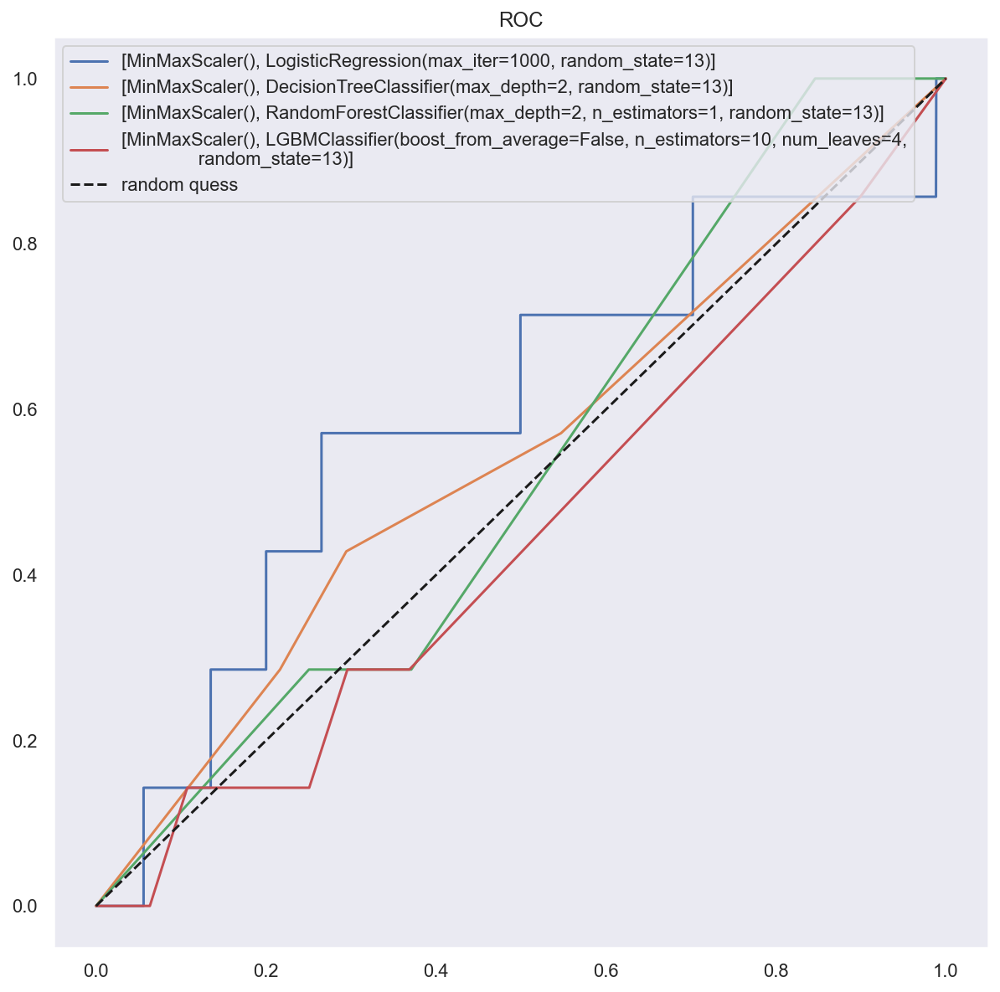

In [21]:
# 1hot
cols_1hot = df_do.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
df_do_1h = pd.get_dummies(df_do, columns=cols_1hot)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list19 , result19 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [75]:
result19['null_del'], result19['encoded'], result19["scaler"], result19["sampler"] = 0, 1, 'MM', "SVMSMOTE"
result19

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.998084,1.000000,0.993119,0.996548,0.996559,0.997757,0.000000,0.000000,0.000000,0.500000,0,1,MM,SVMSMOTE
1,DecisionTree,0.917385,0.773321,0.994940,0.870243,0.941199,0.782442,0.002959,0.285714,0.005857,0.534636,0,1,MM,SVMSMOTE
2,RandomForest,0.811722,0.597064,0.995952,0.746568,0.868290,0.748478,0.002558,0.285714,0.005070,0.517616,0,1,MM,SVMSMOTE
3,LightGBM,0.986137,0.958049,0.993726,0.975561,0.988467,0.971163,0.000000,0.000000,0.000000,0.486673,0,1,MM,SVMSMOTE
4,SVC,0.999549,0.998585,0.999798,0.999191,0.999625,0.996475,0.000000,0.000000,0.000000,0.499358,0,1,MM,SVMSMOTE


(2) null 유지, MinMax, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.6s
====Done Evaluation====
====Done Evaluation====


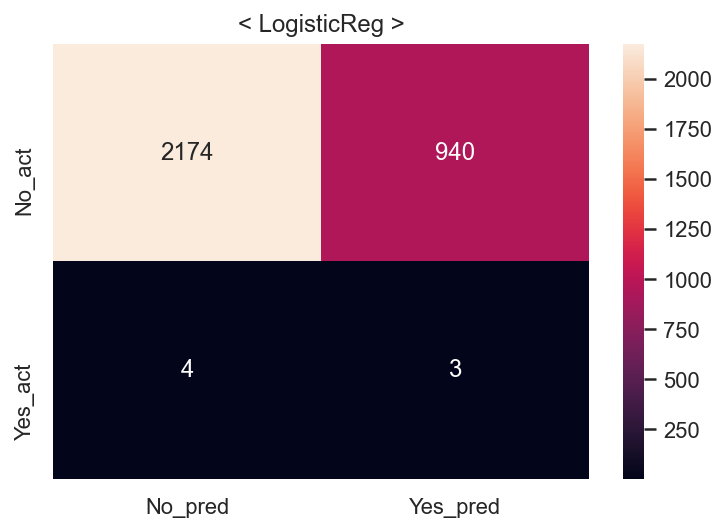

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


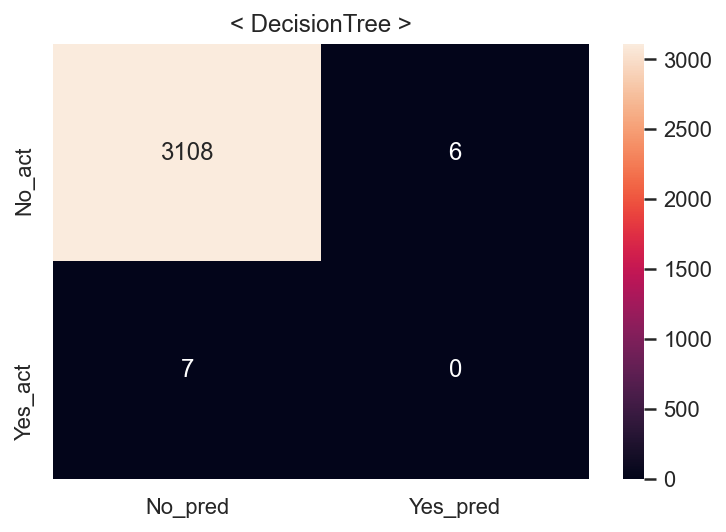

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


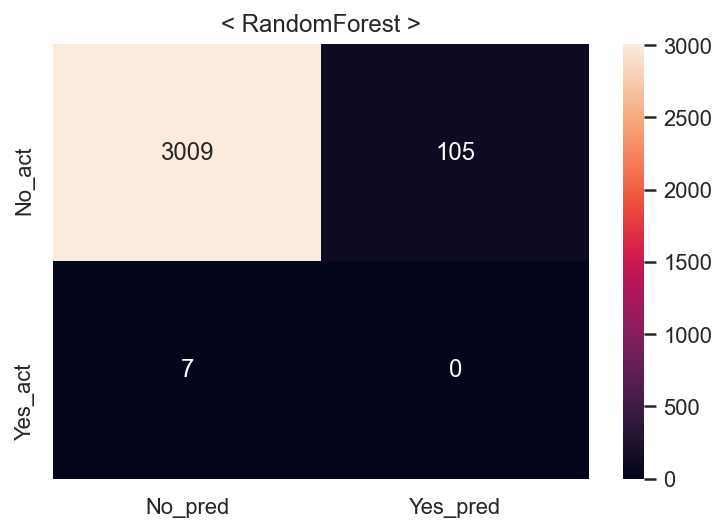

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


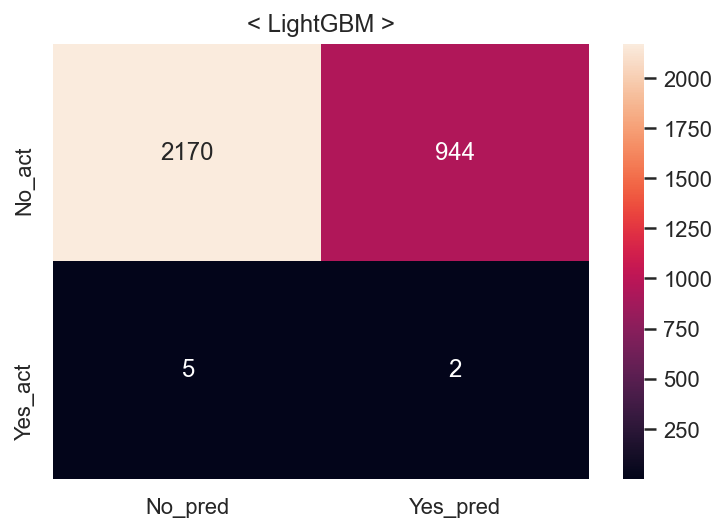

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


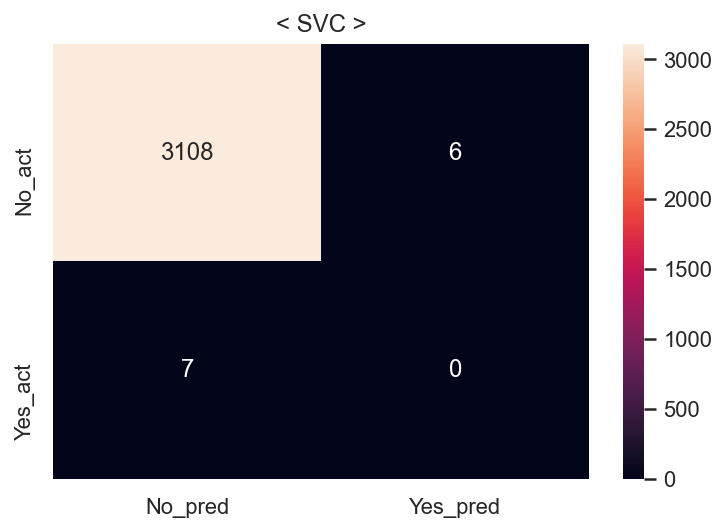

Fit time : 0.24 min


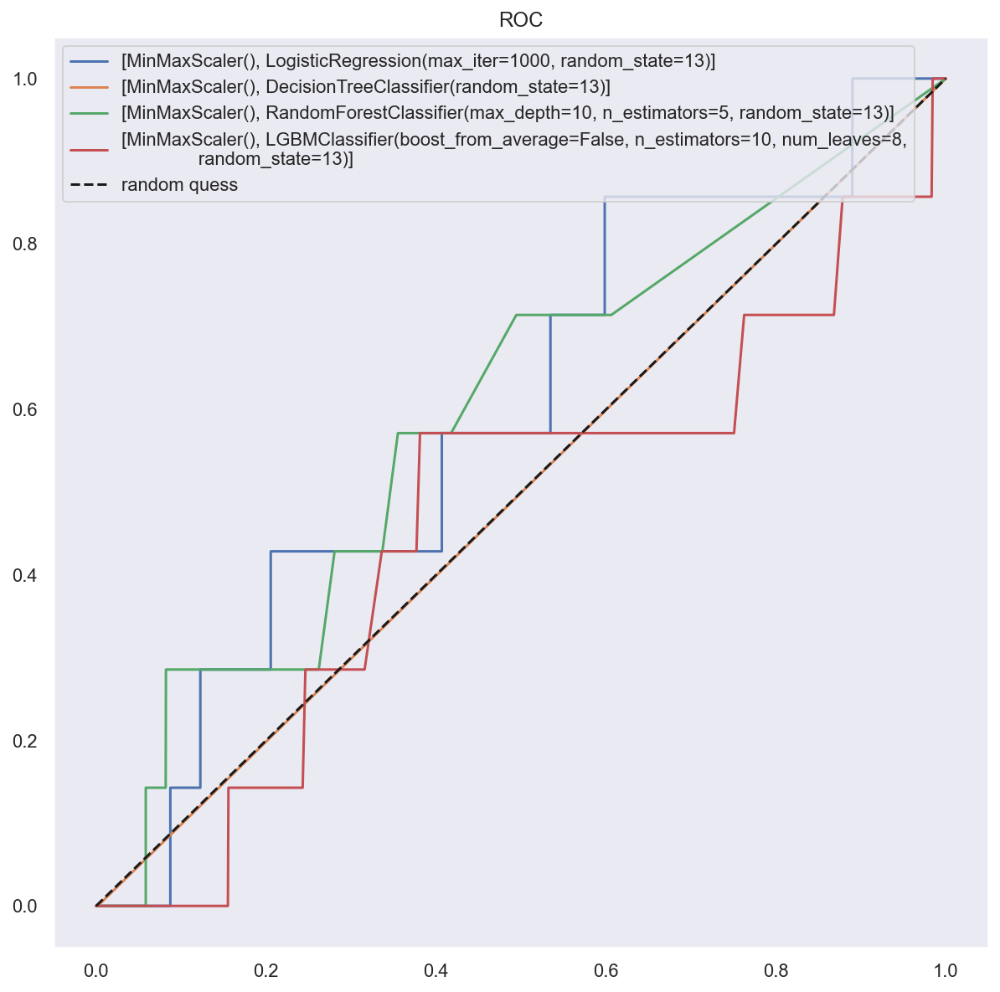

In [22]:
# 1hot
cols_1hot = df_do.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
df_do_1h = pd.get_dummies(df_do, columns=cols_1hot)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit
cv_list20 , result20 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [76]:
result20['null_del'], result20['encoded'], result20["scaler"], result20["sampler"] = 0, 1, 'MM', "RandomOverSampler"
result20

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.870900,0.826841,0.938301,0.879052,0.870900,0.697533,0.003181,0.428571,0.006316,0.563354,0,1,MM,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.995835,0.000000,0.000000,0.000000,0.499037,0,1,MM,RandomOverSampler
2,RandomForest,0.990667,0.981676,1.000000,0.990753,0.990667,0.964114,0.000000,0.000000,0.000000,0.483141,0,1,MM,RandomOverSampler
3,LightGBM,0.904483,0.839607,1.000000,0.912811,0.904483,0.695931,0.002114,0.285714,0.004197,0.491284,0,1,MM,RandomOverSampler
4,SVC,0.999570,0.999142,1.000000,0.999571,0.999570,0.995835,0.000000,0.000000,0.000000,0.499037,0,1,MM,RandomOverSampler


### #11
(1) null 유지, Standard, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


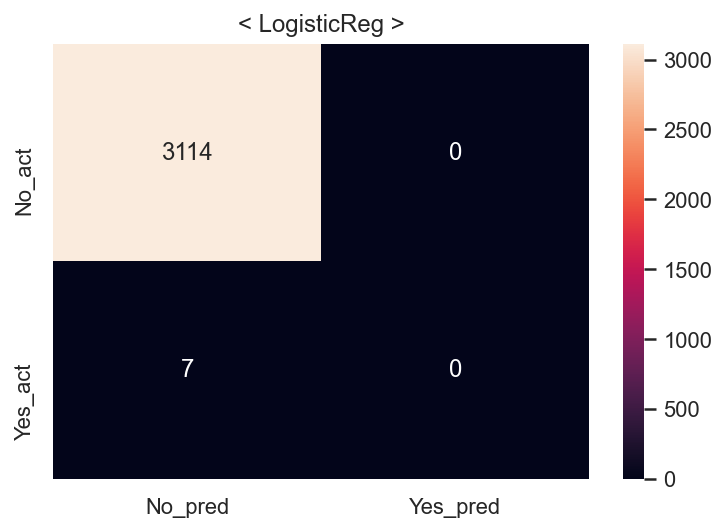

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


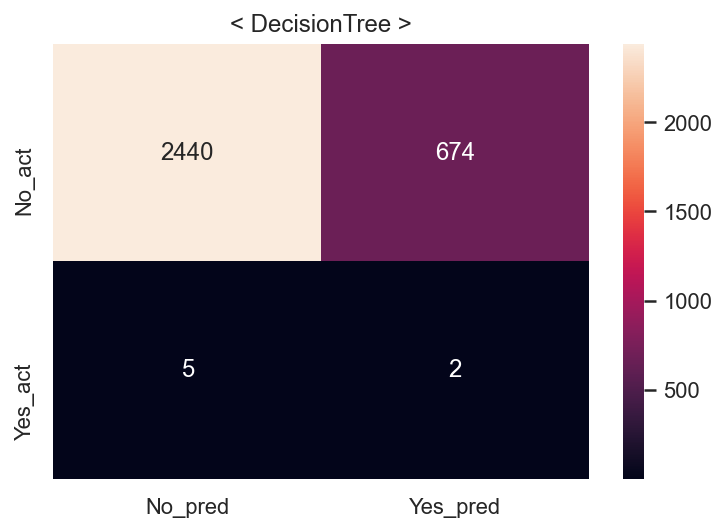

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


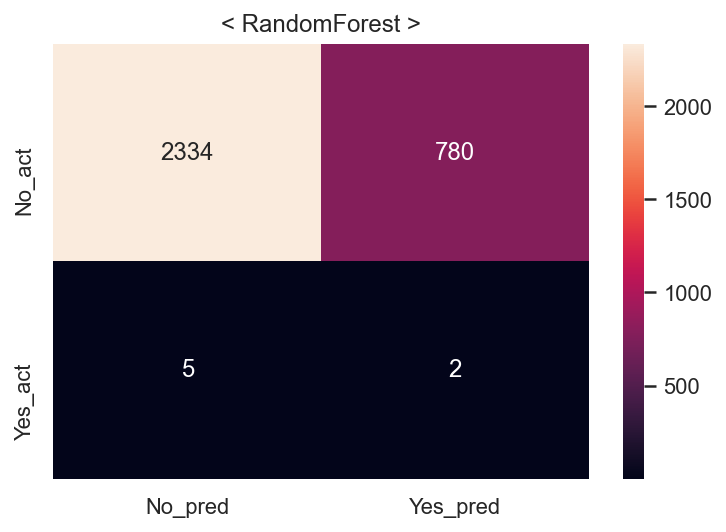

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


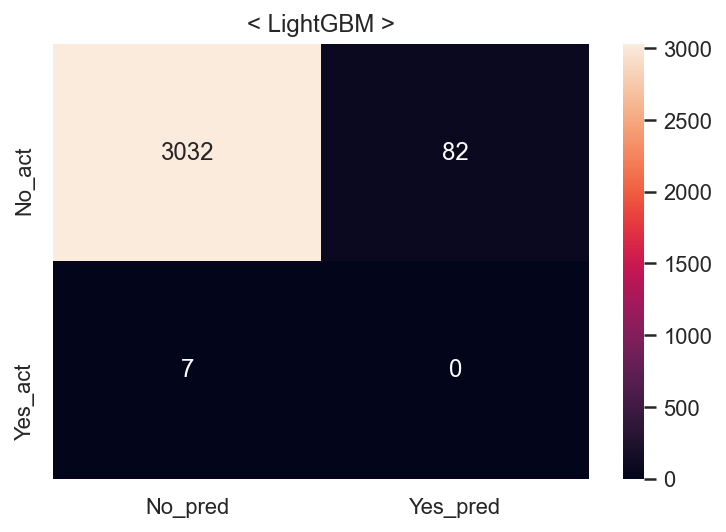

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.2s
====Done Evaluation====
====Done Evaluation====


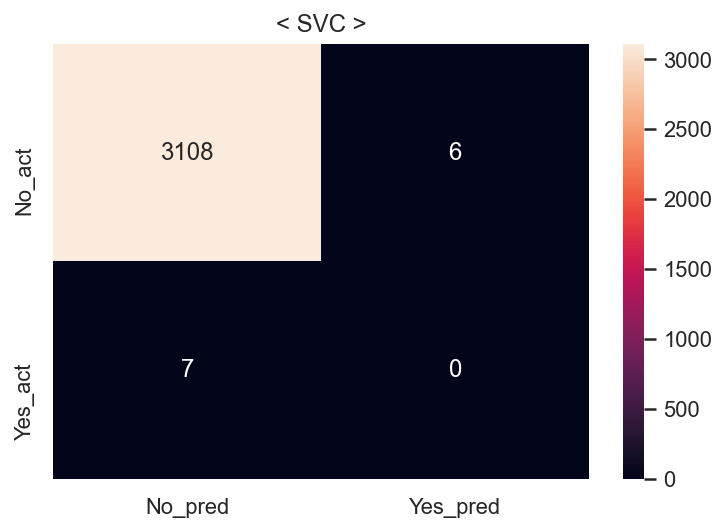

Fit time : 0.32 min


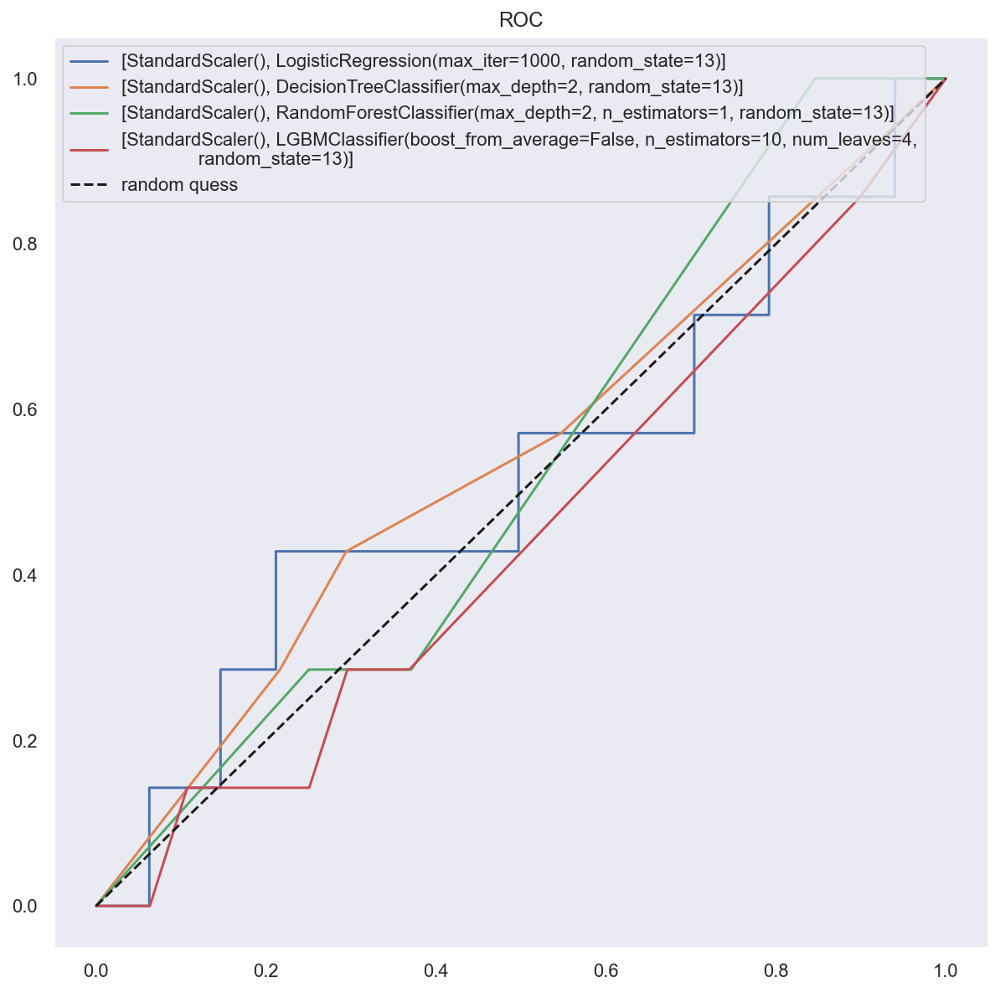

In [24]:
# 1hot
cols_1hot = df_do.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
df_do_1h = pd.get_dummies(df_do, columns=cols_1hot)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list21 , result21 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [77]:
result21['null_del'], result21['encoded'], result21["scaler"], result21["sampler"] = 0, 1, 'SD', "SVMSMOTE"
result21

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.998084,1.000000,0.993119,0.996548,0.996559,0.997757,0.000000,0.000000,0.000000,0.500000,0,1,SD,SVMSMOTE
1,DecisionTree,0.917385,0.773321,0.994940,0.870243,0.941199,0.782442,0.002959,0.285714,0.005857,0.534636,0,1,SD,SVMSMOTE
2,RandomForest,0.811722,0.597064,0.995952,0.746568,0.868290,0.748478,0.002558,0.285714,0.005070,0.517616,0,1,SD,SVMSMOTE
3,LightGBM,0.986137,0.958049,0.993726,0.975561,0.988467,0.971483,0.000000,0.000000,0.000000,0.486834,0,1,SD,SVMSMOTE
4,SVC,0.999718,0.999595,0.999393,0.999494,0.999618,0.995835,0.000000,0.000000,0.000000,0.499037,0,1,SD,SVMSMOTE


(2) null 유지, Standard, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.4s
====Done Evaluation====
====Done Evaluation====


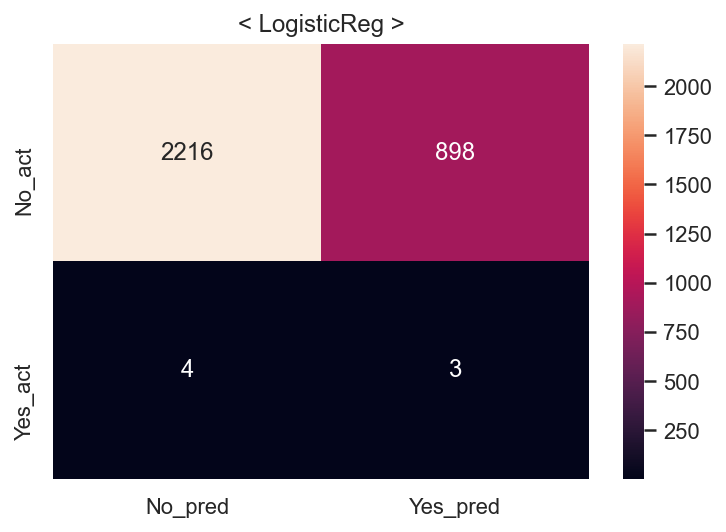

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


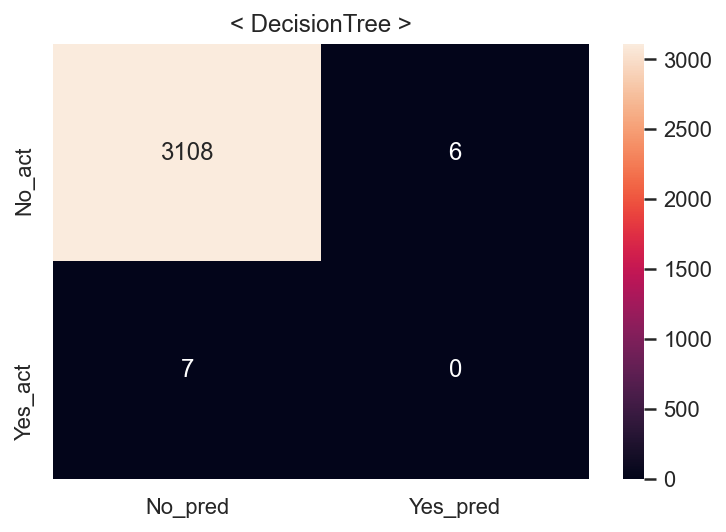

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


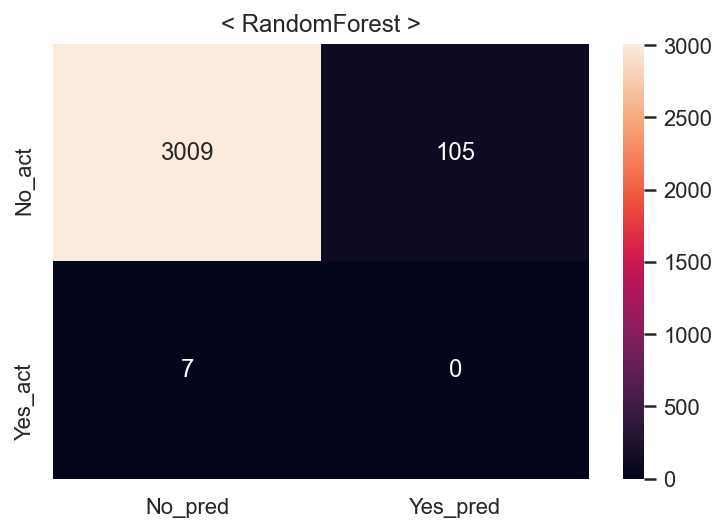

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


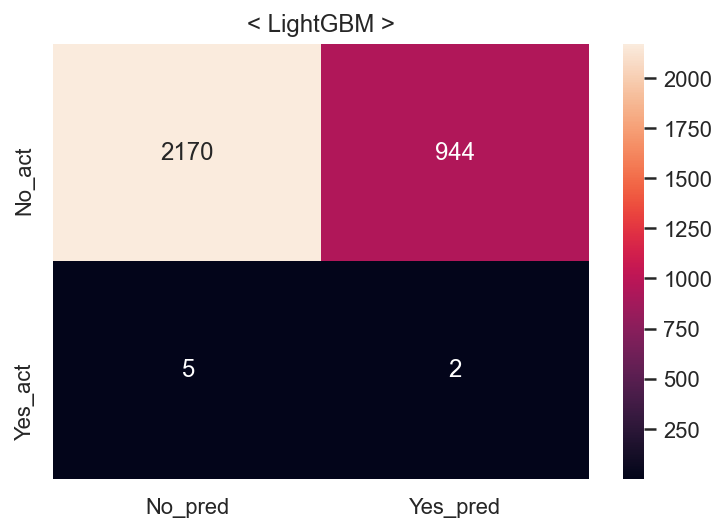

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.1s
====Done Evaluation====
====Done Evaluation====


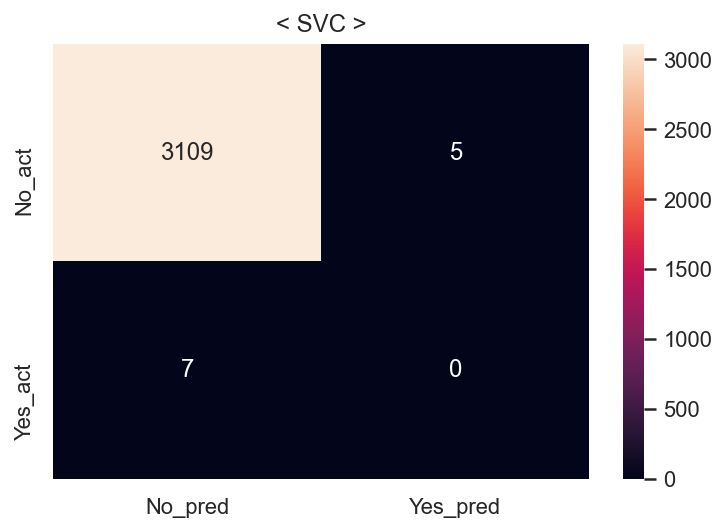

Fit time : 0.29 min


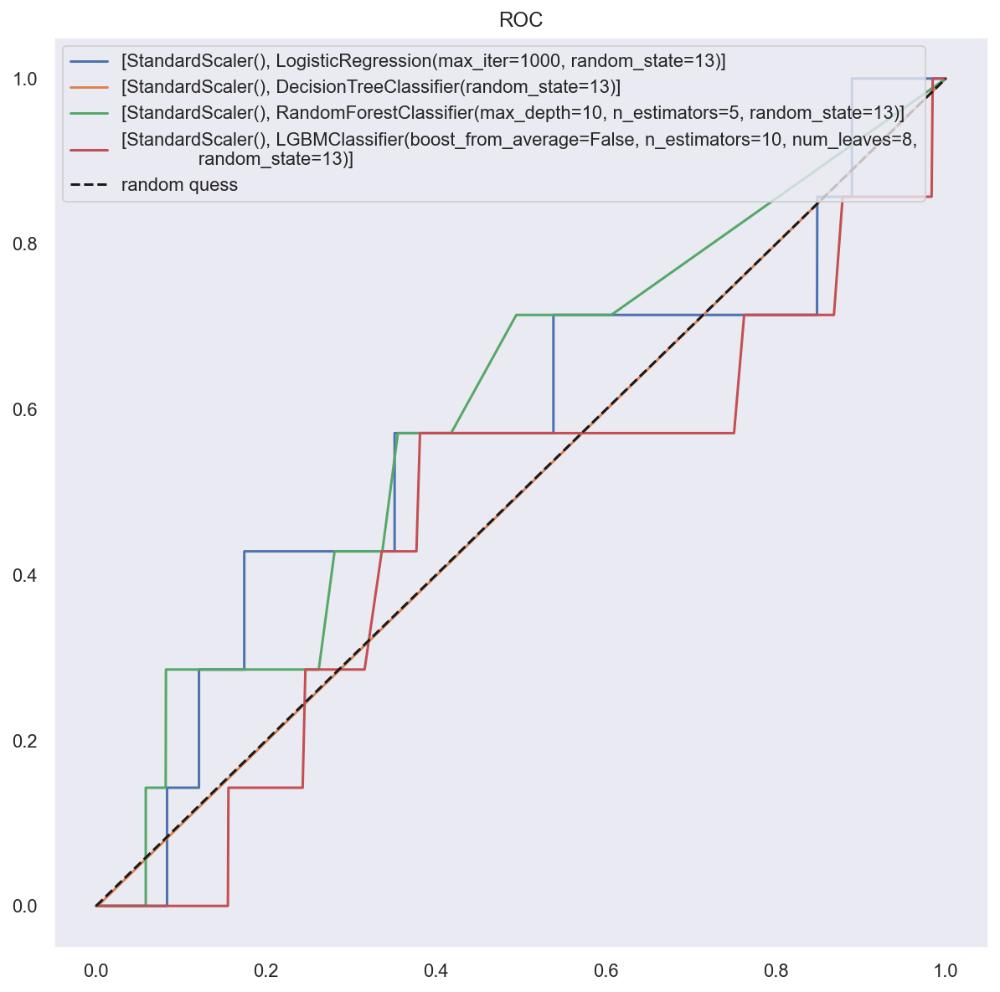

In [25]:
# 1hot
cols_1hot = df_do.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
df_do_1h = pd.get_dummies(df_do, columns=cols_1hot)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit
cv_list22 , result22 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [78]:
result22['null_del'], result22['encoded'], result22["scaler"], result22["sampler"] = 0, 1, 'SD', "RandomOverSampler"
result22

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.872969,0.829868,0.938301,0.880760,0.872969,0.710990,0.003330,0.428571,0.006608,0.570098,0,1,SD,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.995835,0.000000,0.000000,0.000000,0.499037,0,1,SD,RandomOverSampler
2,RandomForest,0.990667,0.981676,1.000000,0.990753,0.990667,0.964114,0.000000,0.000000,0.000000,0.483141,0,1,SD,RandomOverSampler
3,LightGBM,0.904483,0.839607,1.000000,0.912811,0.904483,0.695931,0.002114,0.285714,0.004197,0.491284,0,1,SD,RandomOverSampler
4,SVC,0.999805,0.999610,1.000000,0.999805,0.999805,0.996155,0.000000,0.000000,0.000000,0.499197,0,1,SD,RandomOverSampler


### #12
(1) null 유지, Robust, SVMSMOTE

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


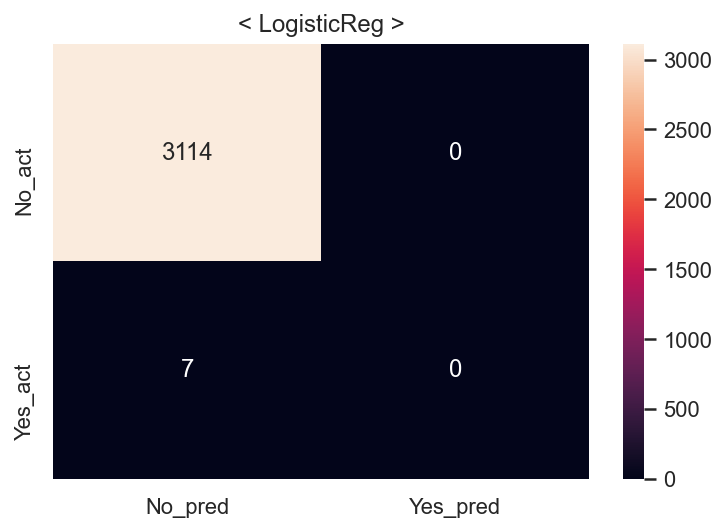

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


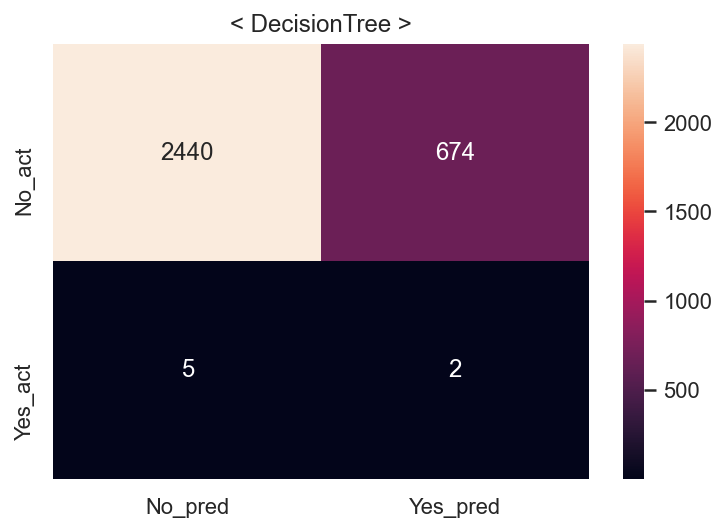

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


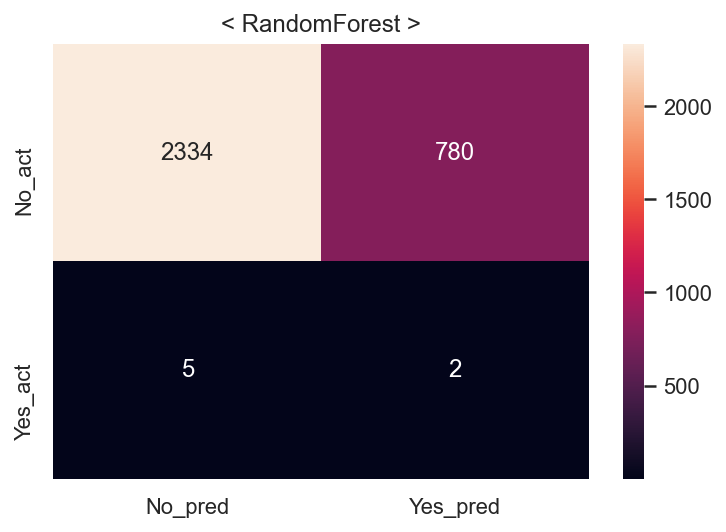

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


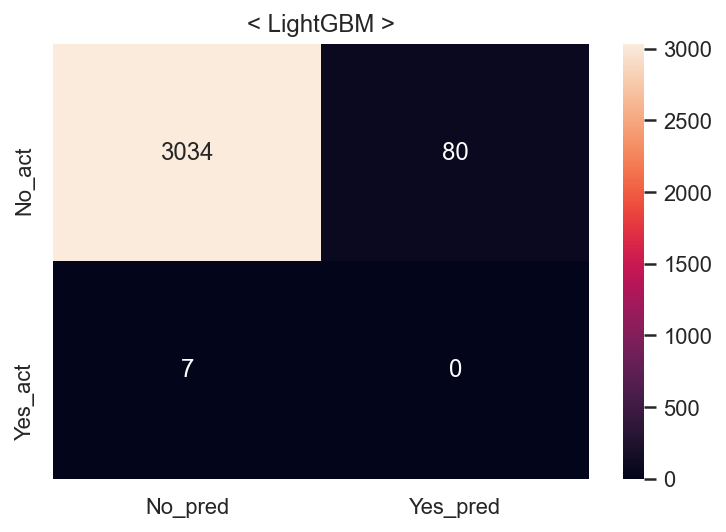

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  16.9s
====Done Evaluation====
====Done Evaluation====


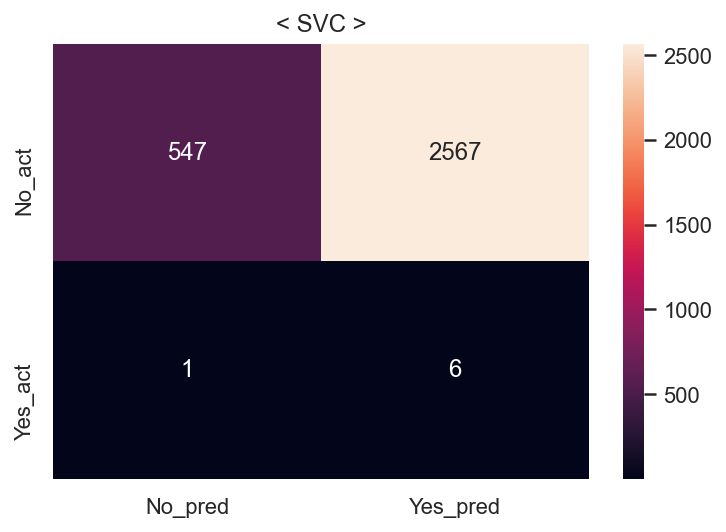

Fit time : 1.43 min


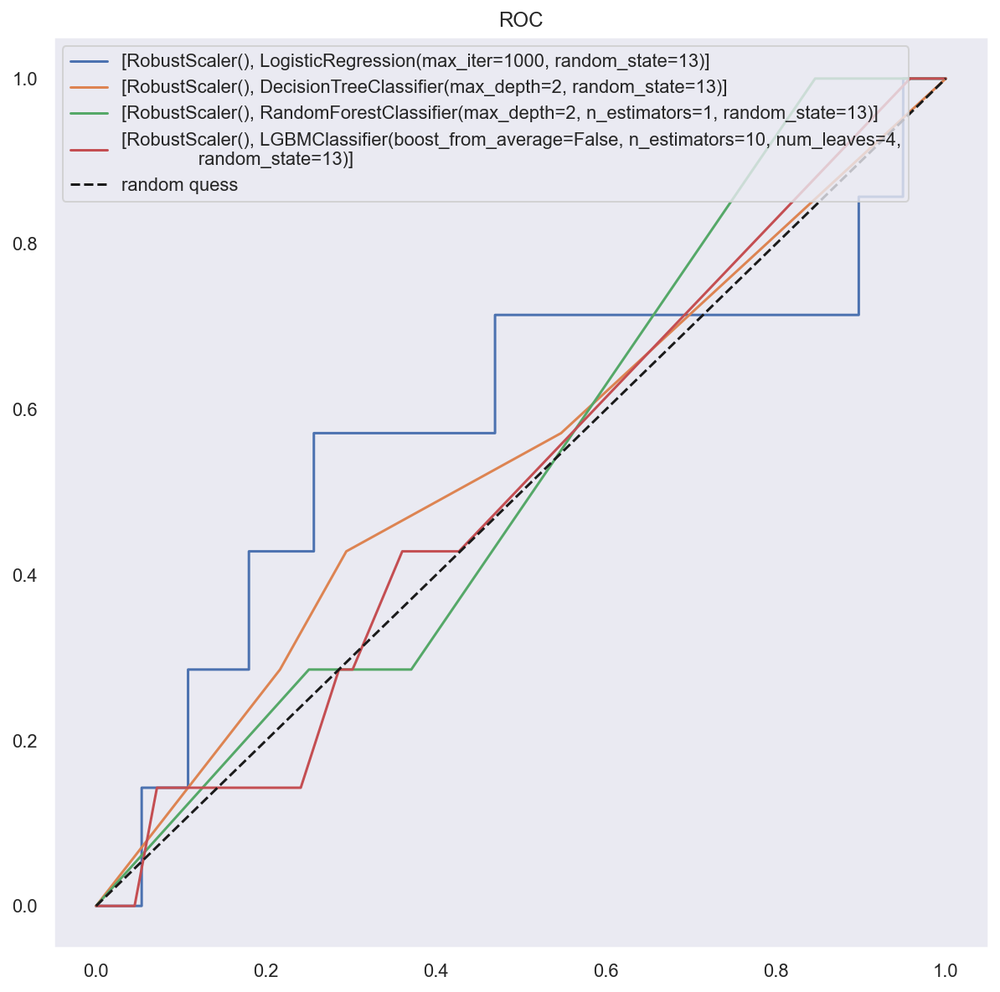

In [26]:
# 1hot
cols_1hot = df_do.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
df_do_1h = pd.get_dummies(df_do, columns=cols_1hot)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list23 , result23 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [79]:
result23['null_del'], result23['encoded'], result23["scaler"], result23["sampler"] = 0, 1, 'RB', "SVMSMOTE"
result23

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.998084,1.000000,0.993119,0.996548,0.996559,0.997757,0.000000,0.000000,0.000000,0.500000,0,1,RB,SVMSMOTE
1,DecisionTree,0.917385,0.773321,0.994940,0.870243,0.941199,0.782442,0.002959,0.285714,0.005857,0.534636,0,1,RB,SVMSMOTE
2,RandomForest,0.811722,0.597064,0.995952,0.746568,0.868290,0.748478,0.002558,0.285714,0.005070,0.517616,0,1,RB,SVMSMOTE
3,LightGBM,0.986362,0.958797,0.993726,0.975949,0.988623,0.972124,0.000000,0.000000,0.000000,0.487155,0,1,RB,SVMSMOTE
4,SVC,0.398986,0.316562,0.999595,0.480845,0.583404,0.177187,0.002332,0.857143,0.004651,0.516401,0,1,RB,SVMSMOTE


(2) null 유지, Robust, ROS

==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   2.1s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


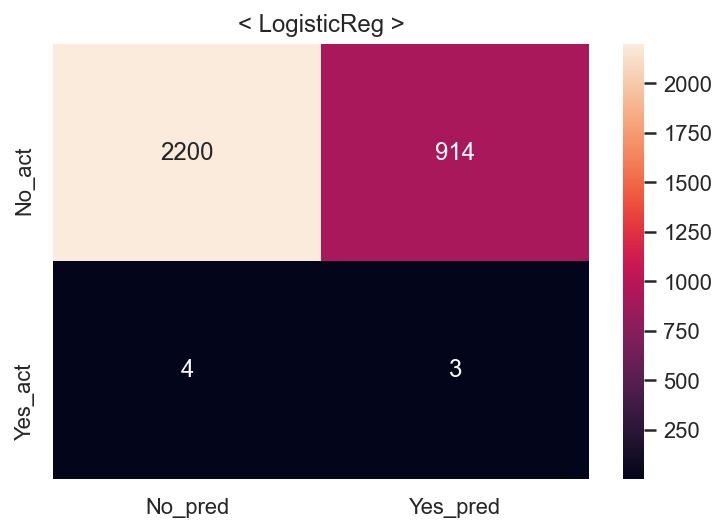

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


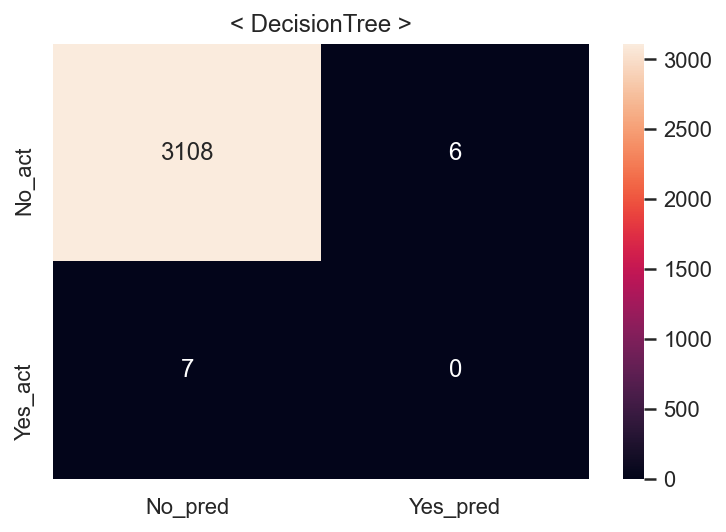

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


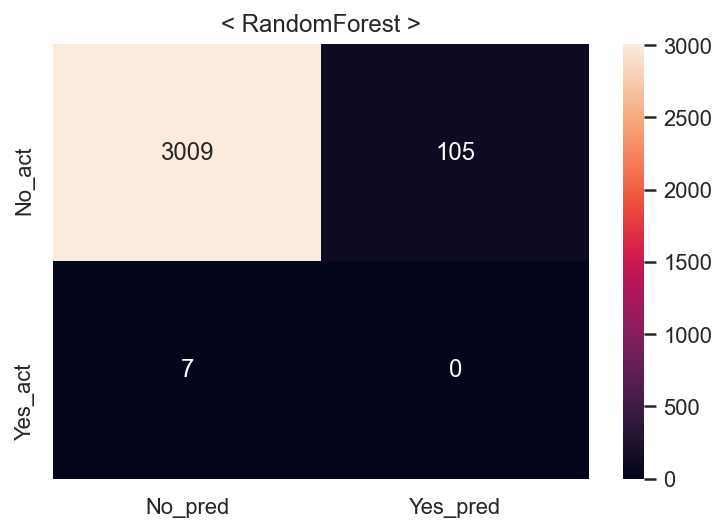

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


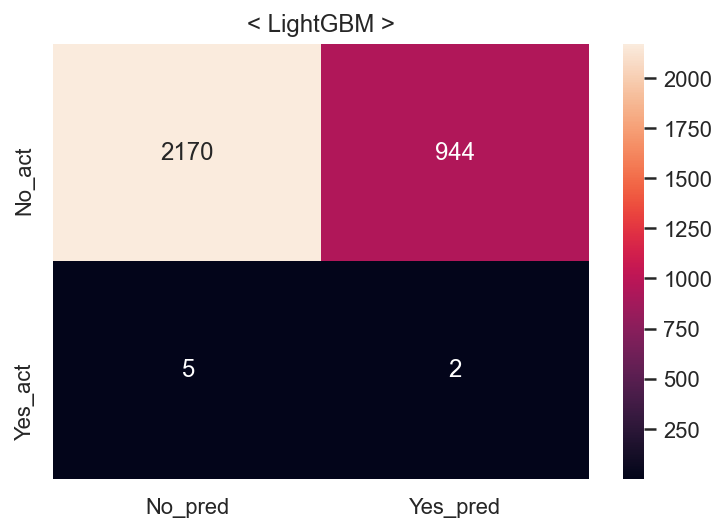

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  22.1s
====Done Evaluation====
====Done Evaluation====


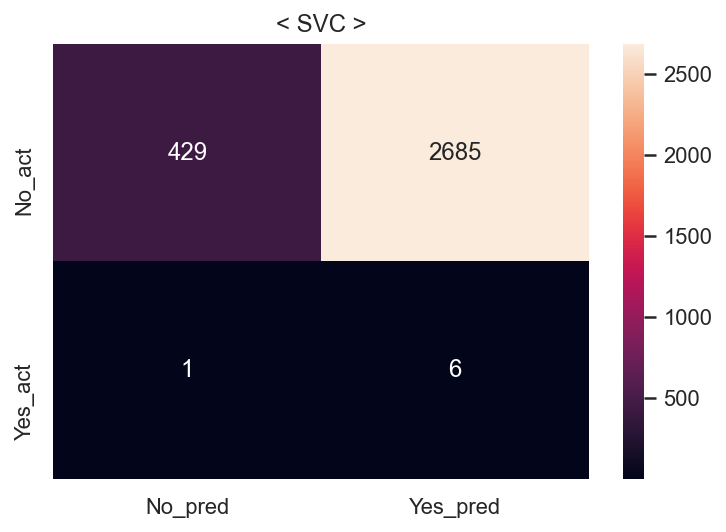

Fit time : 2.26 min


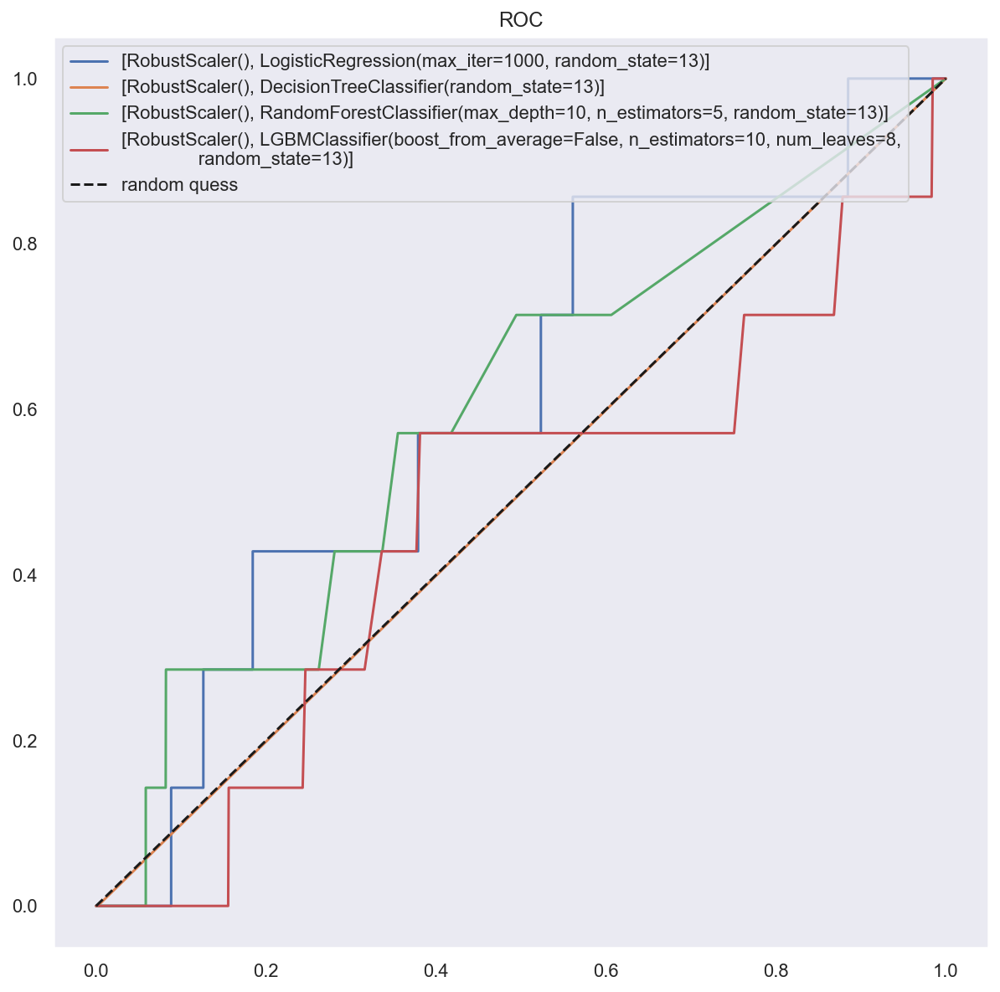

In [27]:
# 1hot
cols_1hot = df_do.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cost', 'insure_cost', 'repair_cnt', 'test_set'])
df_do_1h = pd.get_dummies(df_do, columns=cols_1hot)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit
cv_list24 , result24 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [80]:
result24['null_del'], result24['encoded'], result24["scaler"], result24["sampler"] = 0, 1, 'RB', "RandomOverSampler"
result24

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.870939,0.826898,0.938301,0.879084,0.870939,0.705864,0.003272,0.428571,0.006494,0.567529,0,1,RB,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.995835,0.000000,0.000000,0.000000,0.499037,0,1,RB,RandomOverSampler
2,RandomForest,0.990667,0.981676,1.000000,0.990753,0.990667,0.964114,0.000000,0.000000,0.000000,0.483141,0,1,RB,RandomOverSampler
3,LightGBM,0.904483,0.839607,1.000000,0.912811,0.904483,0.695931,0.002114,0.285714,0.004197,0.491284,0,1,RB,RandomOverSampler
4,SVC,0.568338,0.536675,1.000000,0.698489,0.568338,0.139378,0.002230,0.857143,0.004448,0.497454,0,1,RB,RandomOverSampler


### #13
(1) null 삭제, no scaler, SVMSMOTE

one-hot result:  (15959, 59)
==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


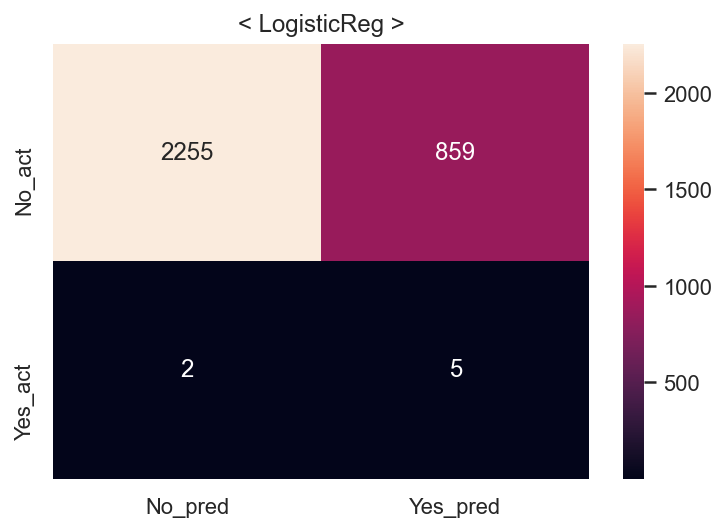

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


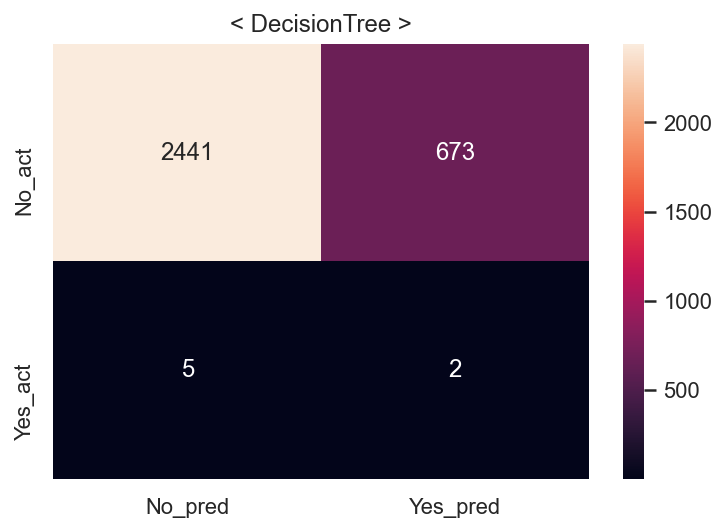

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


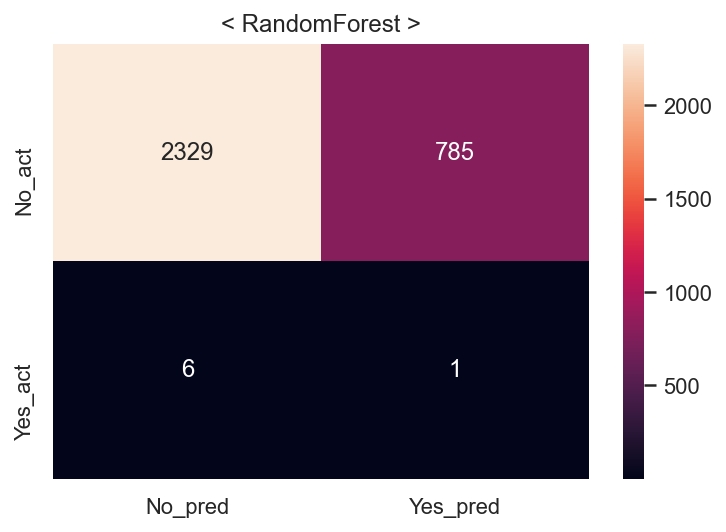

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


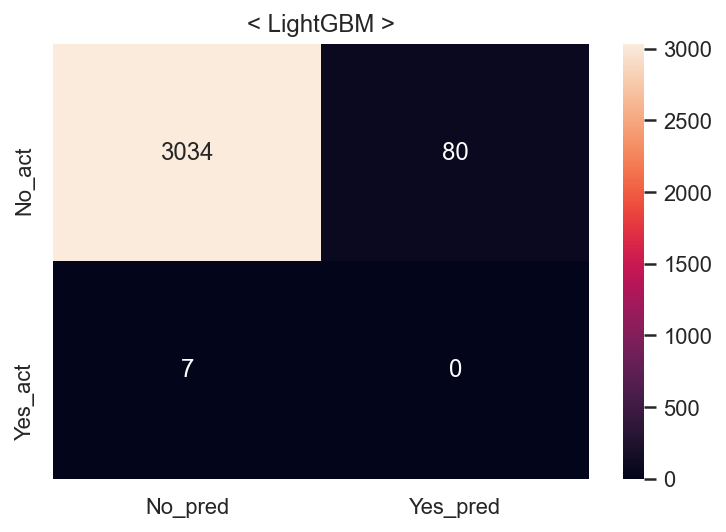

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  17.1s
====Done Evaluation====
====Done Evaluation====


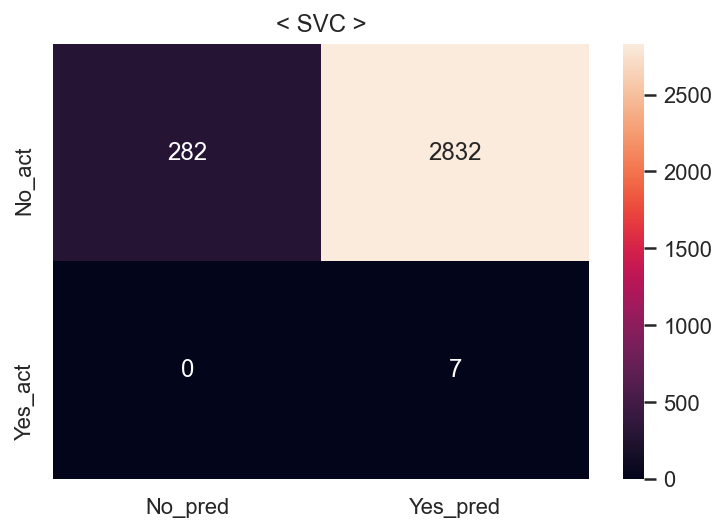

Fit time : 1.44 min


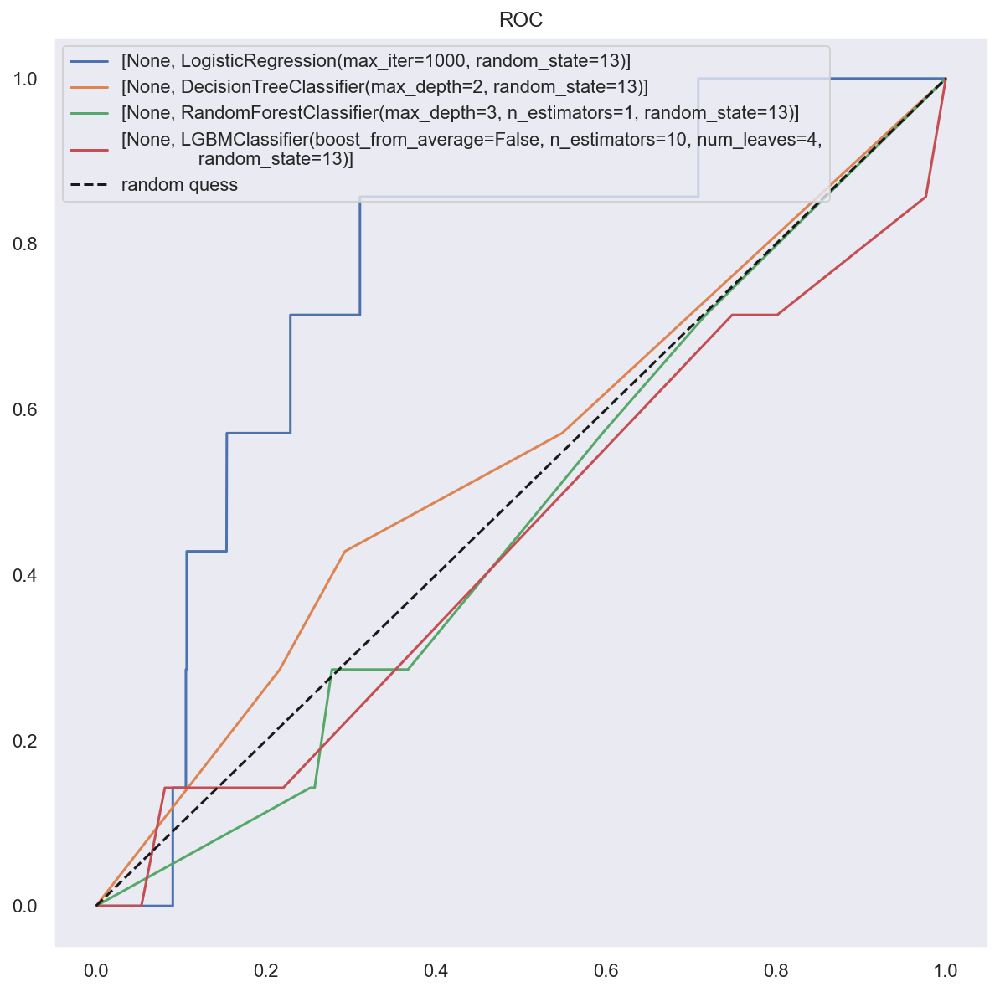

In [28]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
cols_1hot = df_do_dn.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
df_do_dn_1h = pd.get_dummies(df_do, columns=cols_1hot)
print('one-hot result: ', df_do_dn_1h.shape)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list25 , result25 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [81]:
result25['null_del'], result25['encoded'], result25["scaler"], result25["sampler"] = 1, 1, 'None', "SVMSMOTE"
result25

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.809637,0.594441,0.995547,0.744401,0.866721,0.724127,0.005787,0.714286,0.011481,0.719217,1,1,None,SVMSMOTE
1,DecisionTree,0.917272,0.773078,0.994940,0.870088,0.941121,0.782762,0.002963,0.285714,0.005865,0.534797,1,1,None,SVMSMOTE
2,RandomForest,0.804227,0.587708,0.994738,0.738876,0.862724,0.746556,0.001272,0.142857,0.002522,0.445385,1,1,None,SVMSMOTE
3,LightGBM,0.986306,0.958610,0.993726,0.975852,0.988584,0.972124,0.000000,0.000000,0.000000,0.487155,1,1,None,SVMSMOTE
4,SVC,0.335982,0.295346,0.999190,0.455926,0.539622,0.092599,0.002466,1.000000,0.004919,0.545279,1,1,None,SVMSMOTE


(2) null 삭제, no scaler, ROS

one-hot result:  (15959, 59)
==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


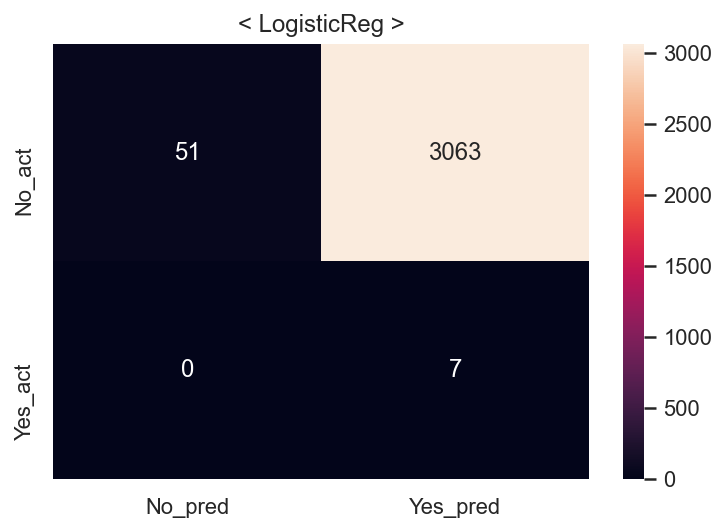

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


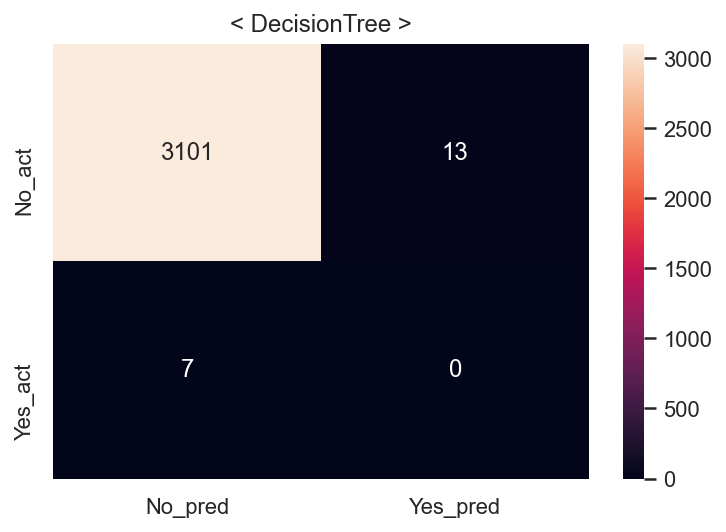

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


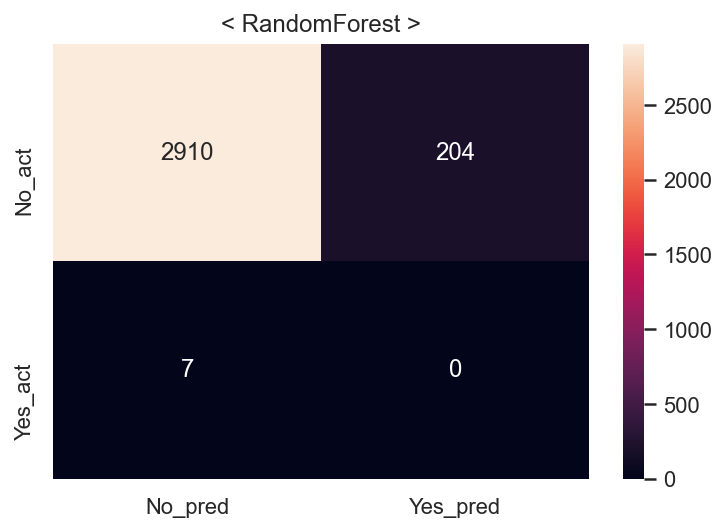

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


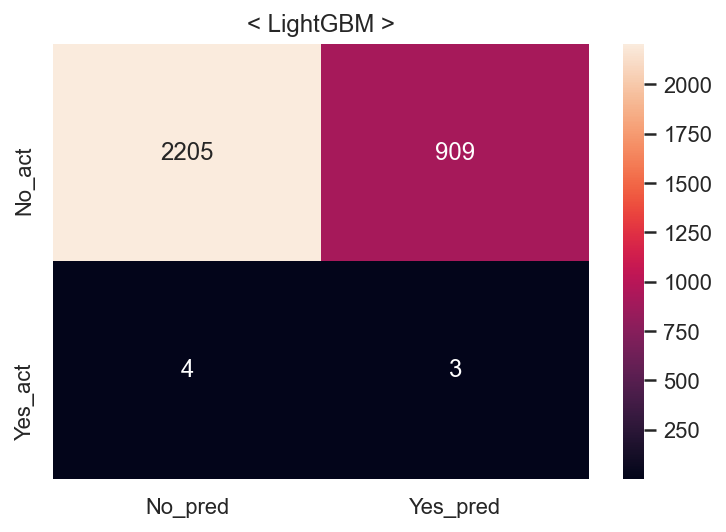

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=99.6min
====Done Evaluation====
====Done Evaluation====


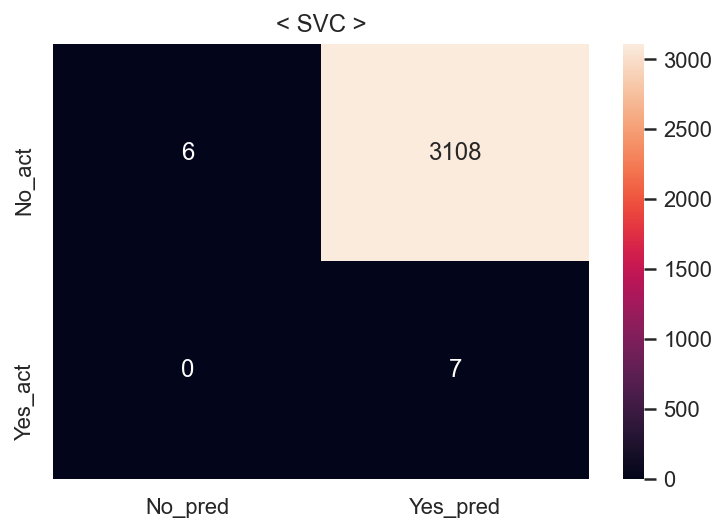

Fit time : 229.25 min


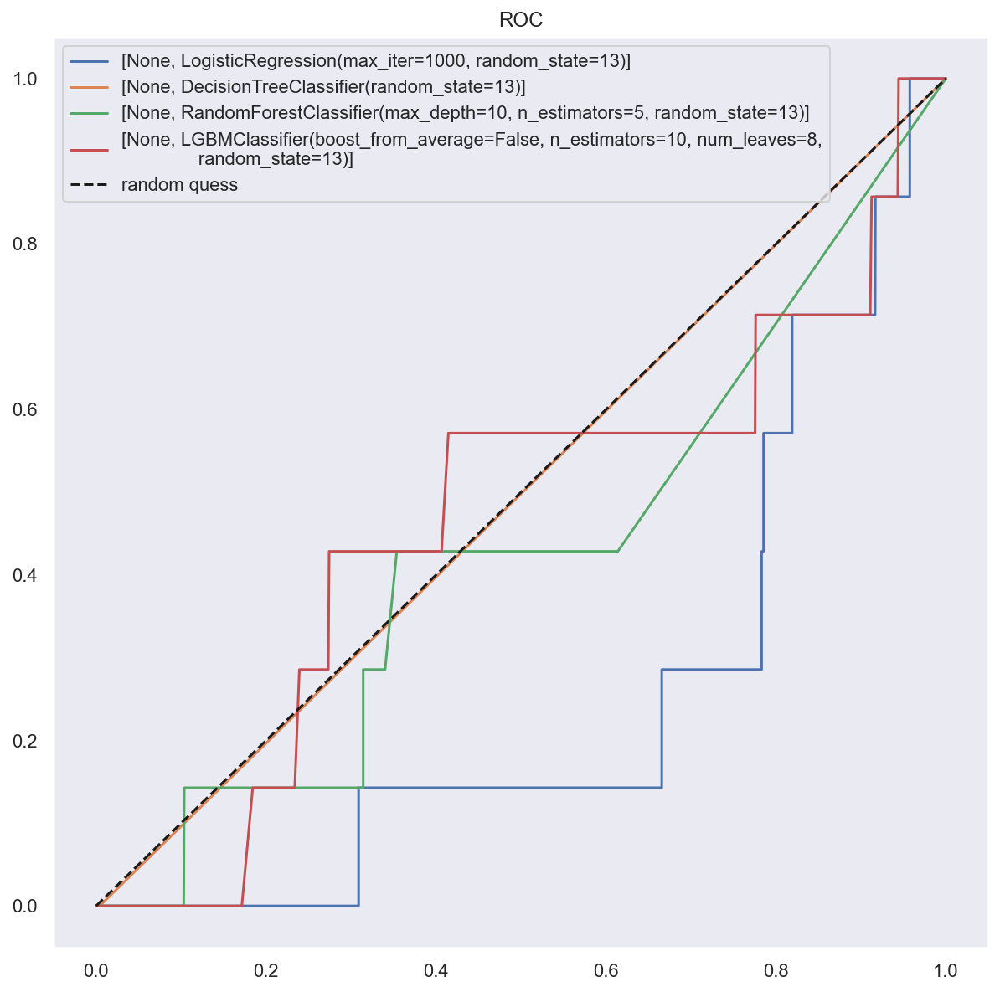

In [30]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
cols_1hot = df_do_dn.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
df_do_dn_1h = pd.get_dummies(df_do, columns=cols_1hot)
print('one-hot result: ', df_do_dn_1h.shape)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list26 , result26 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='No')

In [82]:
result26['null_del'], result26['encoded'], result26["scaler"], result26["sampler"] = 1, 1, 'None', "RandomOverSampler"
result26

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.521321,0.510893,1.0,0.676280,0.521321,0.018584,0.002280,1.000000,0.004550,0.508189,1,1,None,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.0,1.000000,1.000000,0.993592,0.000000,0.000000,0.000000,0.497913,1,1,None,RandomOverSampler
2,RandomForest,0.981334,0.964011,1.0,0.981676,0.981334,0.932393,0.000000,0.000000,0.000000,0.467245,1,1,None,RandomOverSampler
3,LightGBM,0.910106,0.847610,1.0,0.917521,0.910106,0.707466,0.003289,0.428571,0.006529,0.568332,1,1,None,RandomOverSampler
4,SVC,0.500781,0.500391,1.0,0.667014,0.500781,0.004165,0.002247,1.000000,0.004484,0.500963,1,1,None,RandomOverSampler


### #14
(1) null 삭제, MinMax, SVMSMOTE

one-hot result:  (15959, 59)
==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


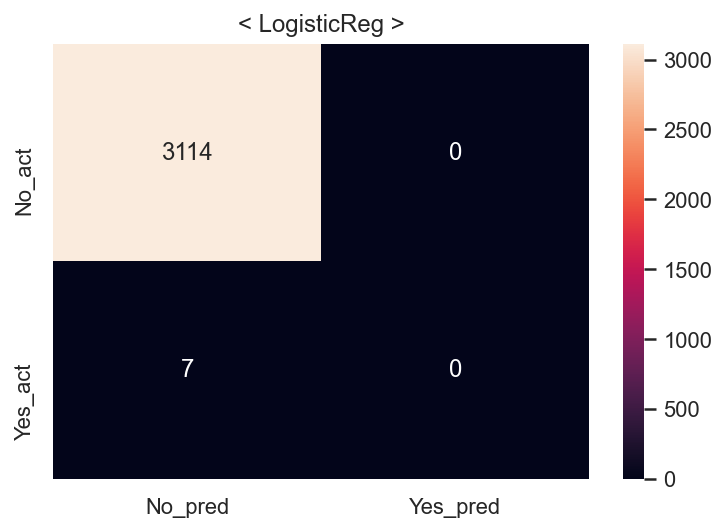

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


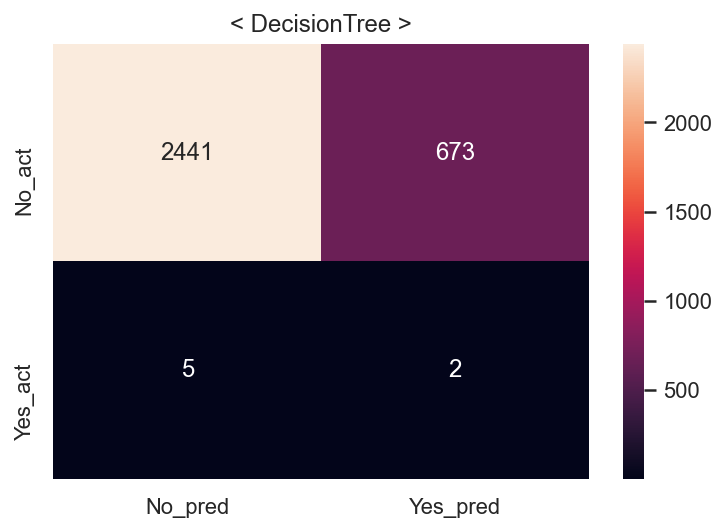

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


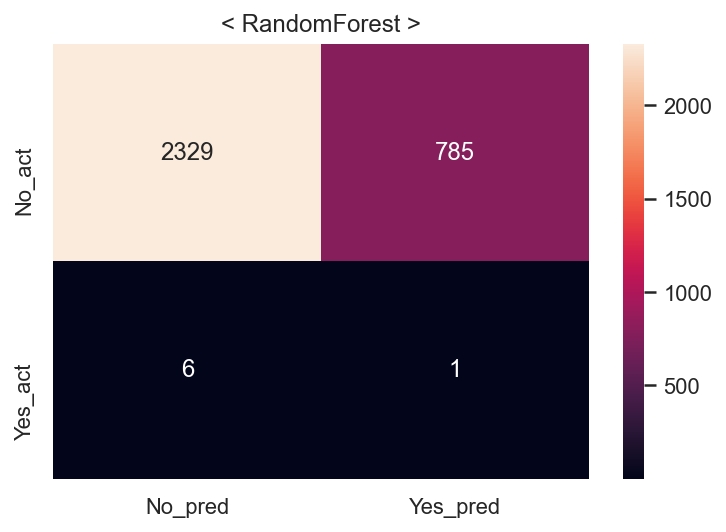

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


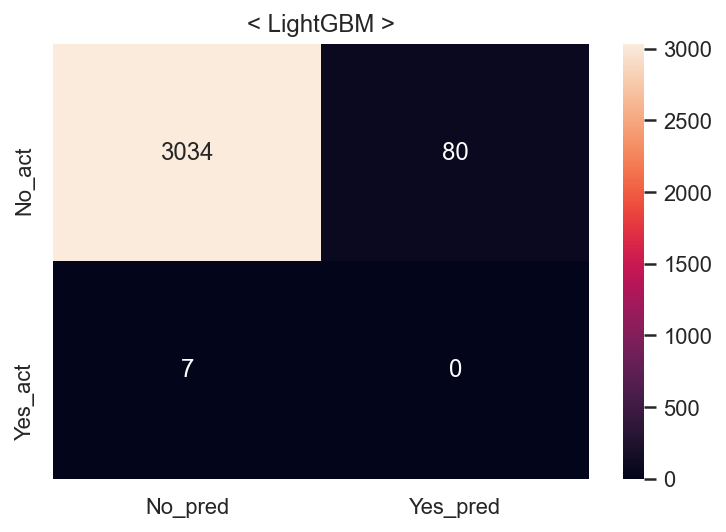

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.8s
====Done Evaluation====
====Done Evaluation====


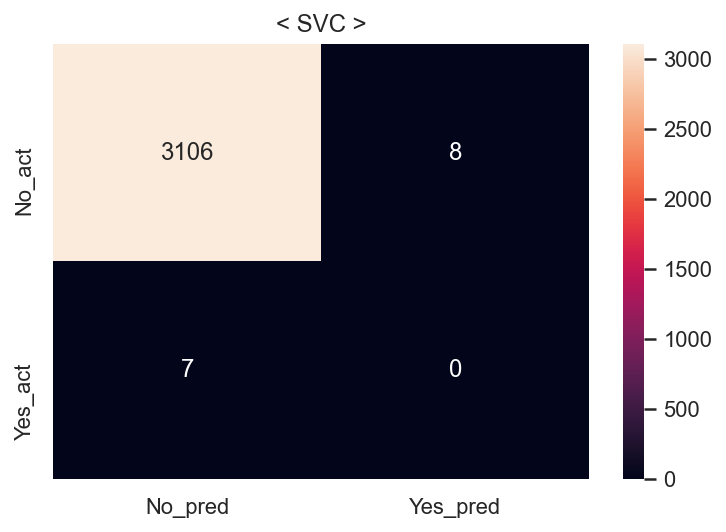

Fit time : 0.22 min


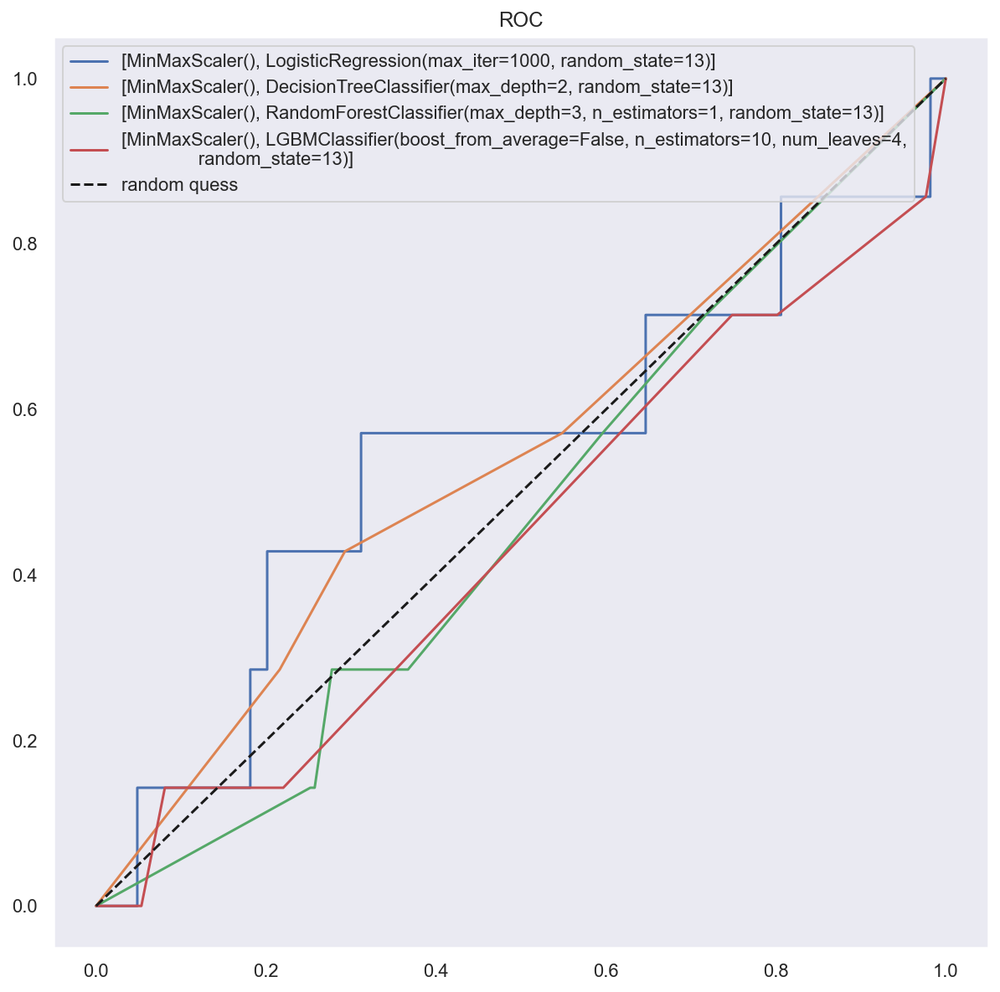

In [31]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
cols_1hot = df_do_dn.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
df_do_dn_1h = pd.get_dummies(df_do, columns=cols_1hot)
print('one-hot result: ', df_do_dn_1h.shape)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list27 , result27 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [83]:
result27['null_del'], result27['encoded'], result27["scaler"], result27["sampler"] = 1, 1, 'MM', "SVMSMOTE"
result27

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.998084,1.000000,0.993119,0.996548,0.996559,0.997757,0.000000,0.000000,0.000000,0.500000,1,1,MM,SVMSMOTE
1,DecisionTree,0.917272,0.773078,0.994940,0.870088,0.941121,0.782762,0.002963,0.285714,0.005865,0.534797,1,1,MM,SVMSMOTE
2,RandomForest,0.804227,0.587708,0.994738,0.738876,0.862724,0.746556,0.001272,0.142857,0.002522,0.445385,1,1,MM,SVMSMOTE
3,LightGBM,0.986306,0.958610,0.993726,0.975852,0.988584,0.972124,0.000000,0.000000,0.000000,0.487155,1,1,MM,SVMSMOTE
4,SVC,0.999662,0.998787,1.000000,0.999393,0.999766,0.995194,0.000000,0.000000,0.000000,0.498715,1,1,MM,SVMSMOTE


(2) null 삭제, MinMax, ROS

one-hot result:  (15959, 59)
==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.5s
====Done Evaluation====
====Done Evaluation====


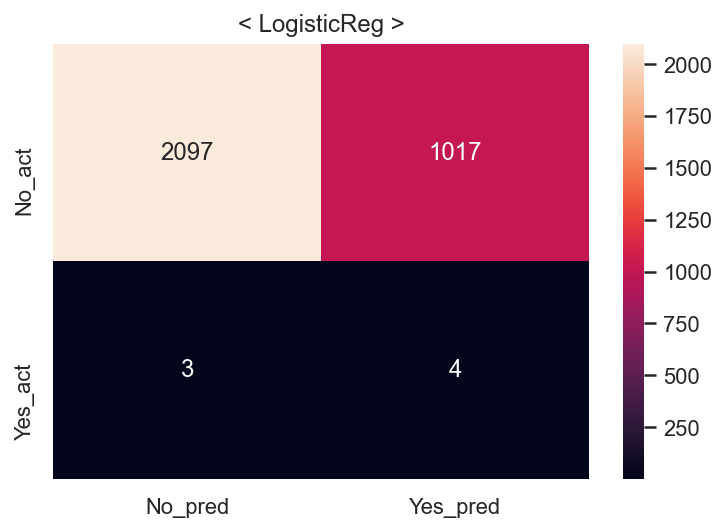

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


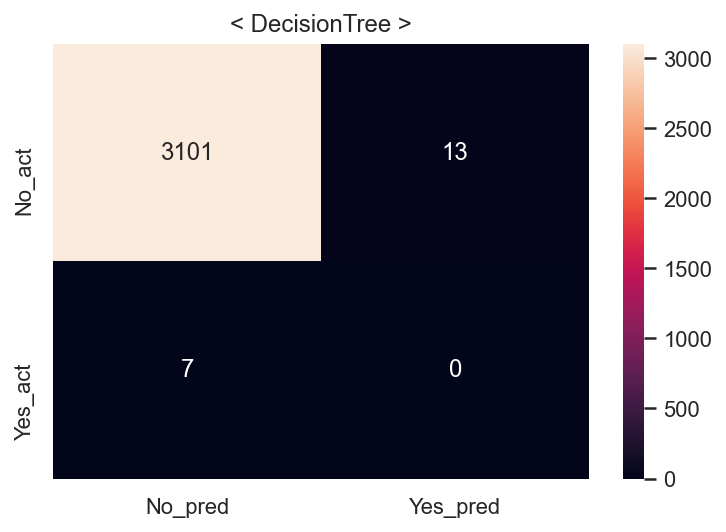

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


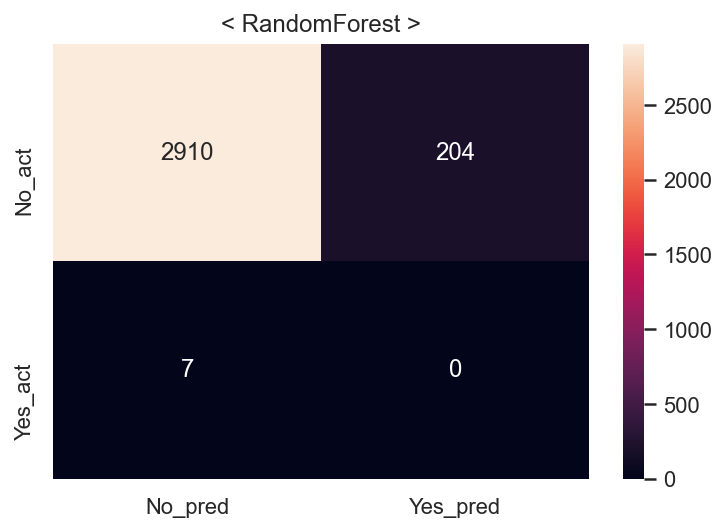

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


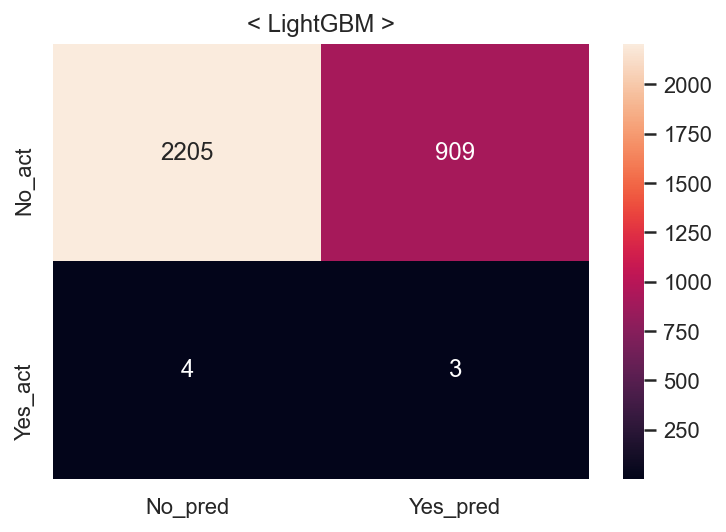

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.9s
====Done Evaluation====
====Done Evaluation====


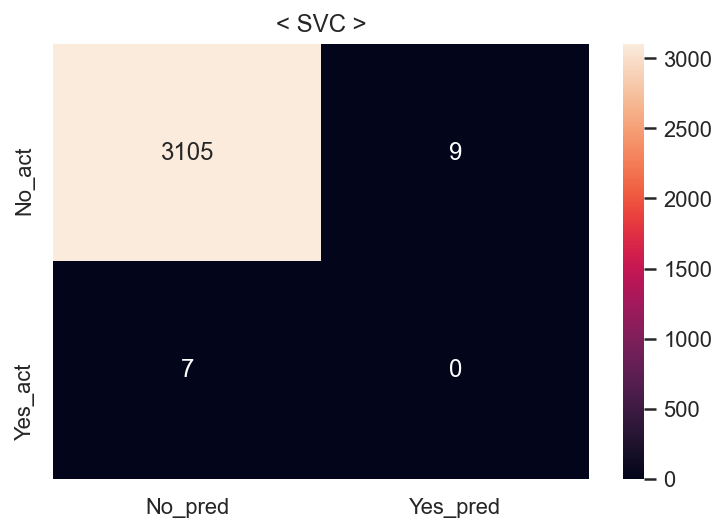

Fit time : 0.23 min


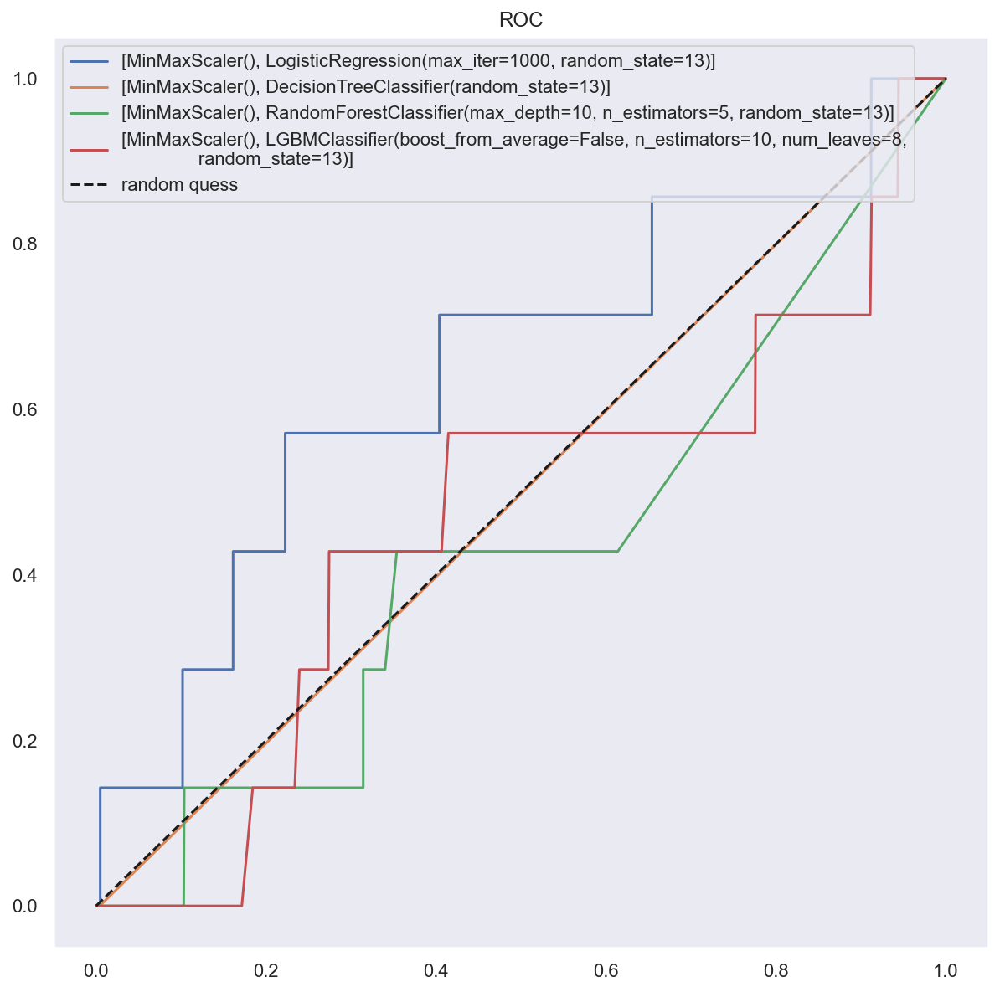

In [32]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
cols_1hot = df_do_dn.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
df_do_dn_1h = pd.get_dummies(df_do, columns=cols_1hot)
print('one-hot result: ', df_do_dn_1h.shape)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list28 , result28 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='MM')

In [86]:
result28['null_del'], result28['encoded'], result28["scaler"], result28["sampler"] = 1, 1, 'MM', "RandomOverSampler"
result28

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.862270,0.814453,0.938301,0.872001,0.862270,0.673182,0.003918,0.571429,0.007782,0.622419,1,1,MM,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.993592,0.000000,0.000000,0.000000,0.497913,1,1,MM,RandomOverSampler
2,RandomForest,0.981334,0.964011,1.000000,0.981676,0.981334,0.932393,0.000000,0.000000,0.000000,0.467245,1,1,MM,RandomOverSampler
3,LightGBM,0.910106,0.847610,1.000000,0.917521,0.910106,0.707466,0.003289,0.428571,0.006529,0.568332,1,1,MM,RandomOverSampler
4,SVC,0.999492,0.998986,1.000000,0.999493,0.999492,0.994873,0.000000,0.000000,0.000000,0.498555,1,1,MM,RandomOverSampler


### #15
(1) null 삭제, Standard, SVMSMOTE

one-hot result:  (15959, 59)
==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


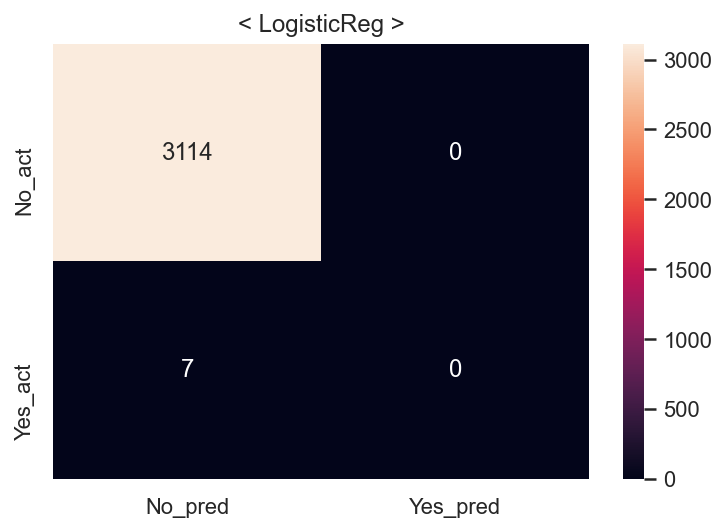

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


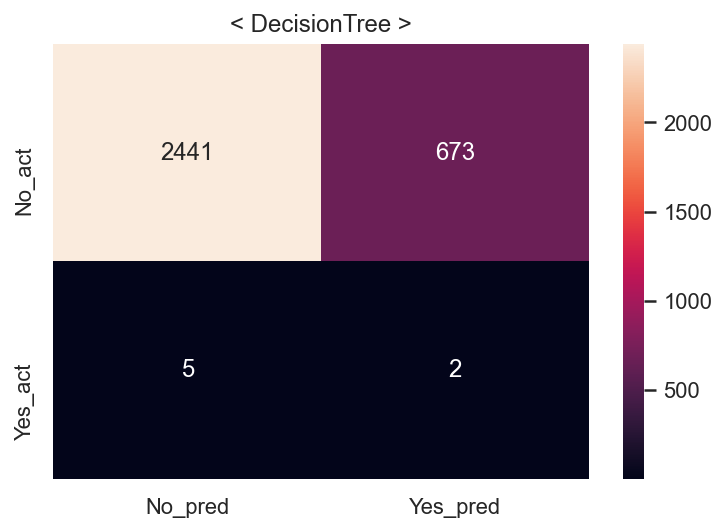

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


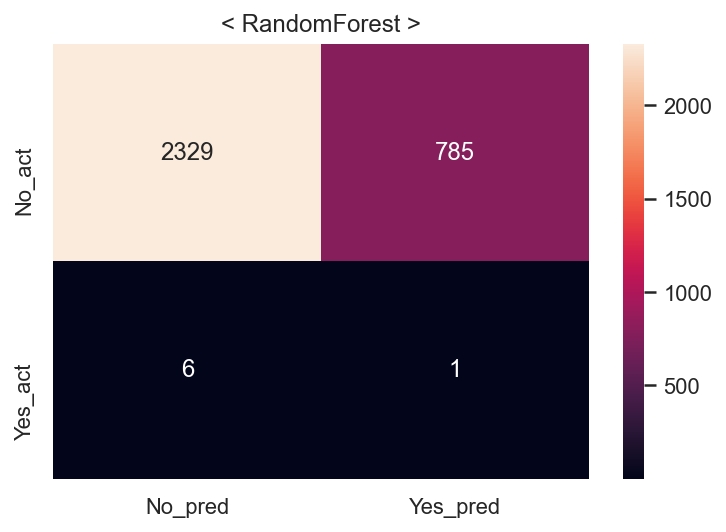

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


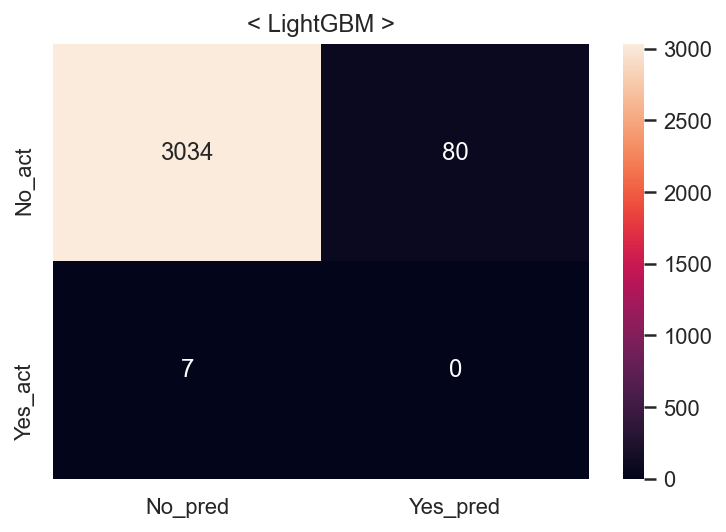

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.5s
====Done Evaluation====
====Done Evaluation====


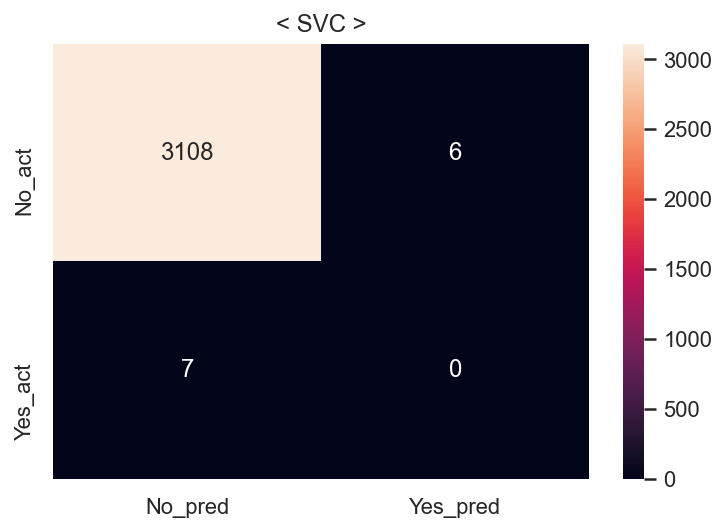

Fit time : 0.29 min


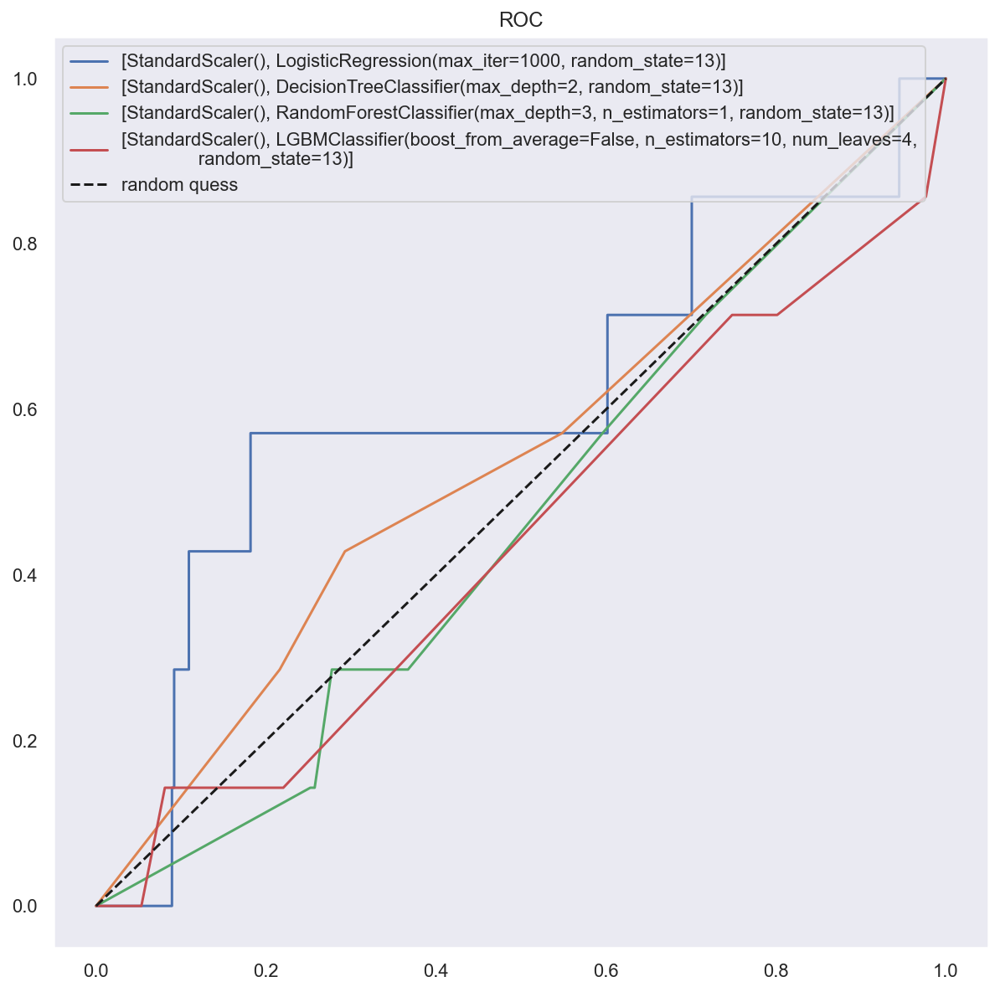

In [33]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
cols_1hot = df_do_dn.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
df_do_dn_1h = pd.get_dummies(df_do, columns=cols_1hot)
print('one-hot result: ', df_do_dn_1h.shape)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list29 , result29 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [84]:
result29['null_del'], result29['encoded'], result29["scaler"], result29["sampler"] = 1, 1, 'SD', "SVMSMOTE"
result29

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.998084,1.000000,0.993119,0.996548,0.996559,0.997757,0.000000,0.000000,0.000000,0.500000,1,1,SD,SVMSMOTE
1,DecisionTree,0.917272,0.773078,0.994940,0.870088,0.941121,0.782762,0.002963,0.285714,0.005865,0.534797,1,1,SD,SVMSMOTE
2,RandomForest,0.804227,0.587708,0.994738,0.738876,0.862724,0.746556,0.001272,0.142857,0.002522,0.445385,1,1,SD,SVMSMOTE
3,LightGBM,0.986250,0.958423,0.993726,0.975755,0.988545,0.972124,0.000000,0.000000,0.000000,0.487155,1,1,SD,SVMSMOTE
4,SVC,0.999718,0.999191,0.999798,0.999494,0.999743,0.995835,0.000000,0.000000,0.000000,0.499037,1,1,SD,SVMSMOTE


(2) null 삭제, Standard, ROS

one-hot result:  (15959, 59)
==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


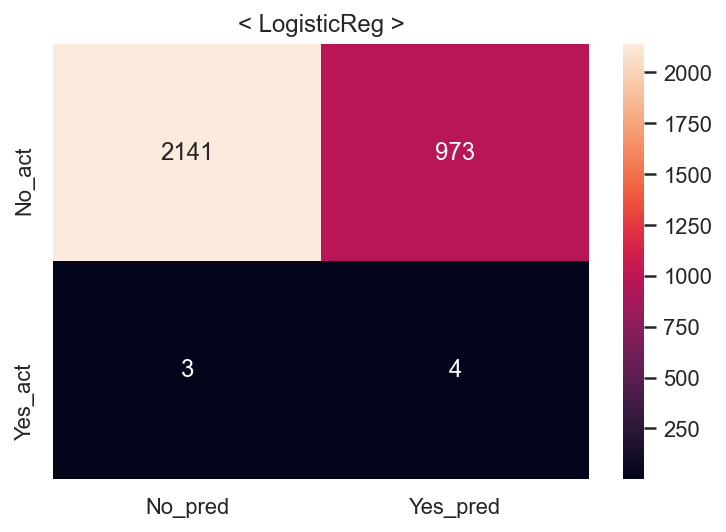

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


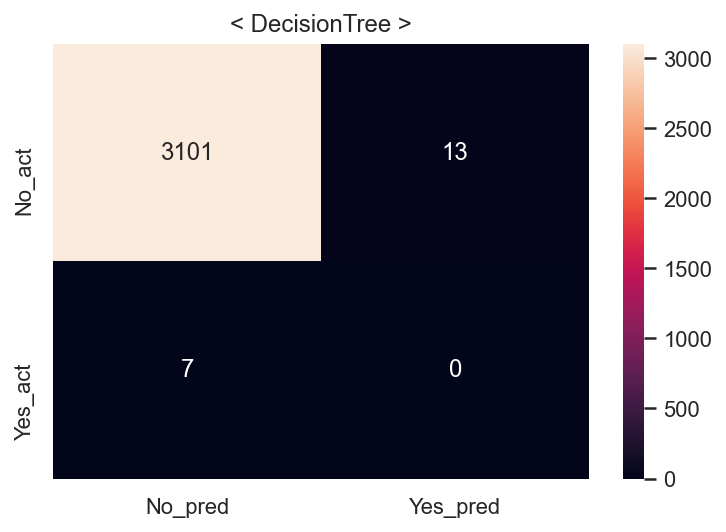

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


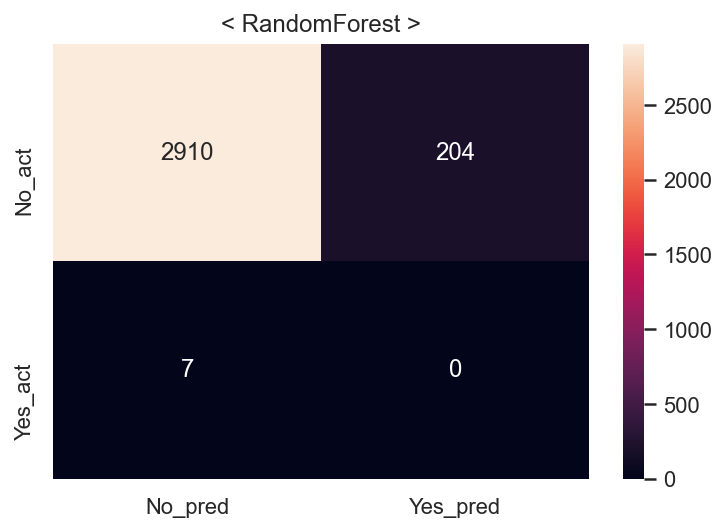

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


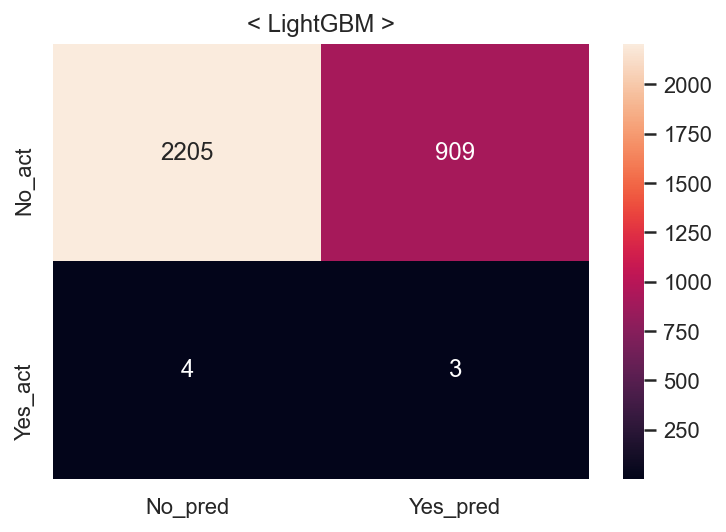

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.1s
====Done Evaluation====
====Done Evaluation====


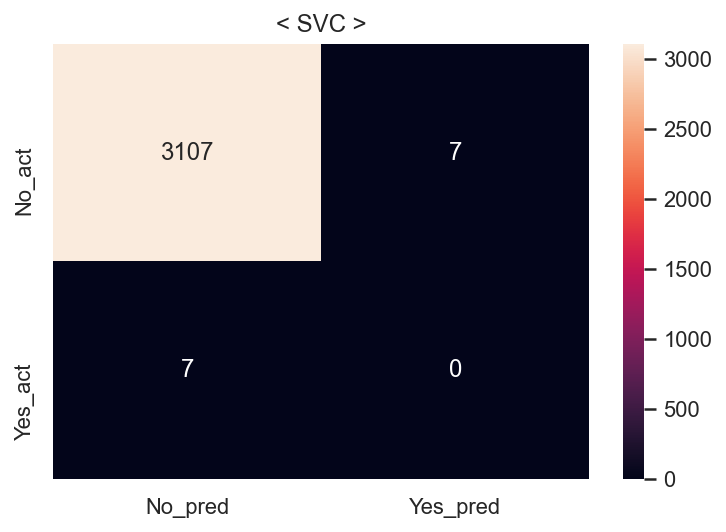

Fit time : 0.28 min


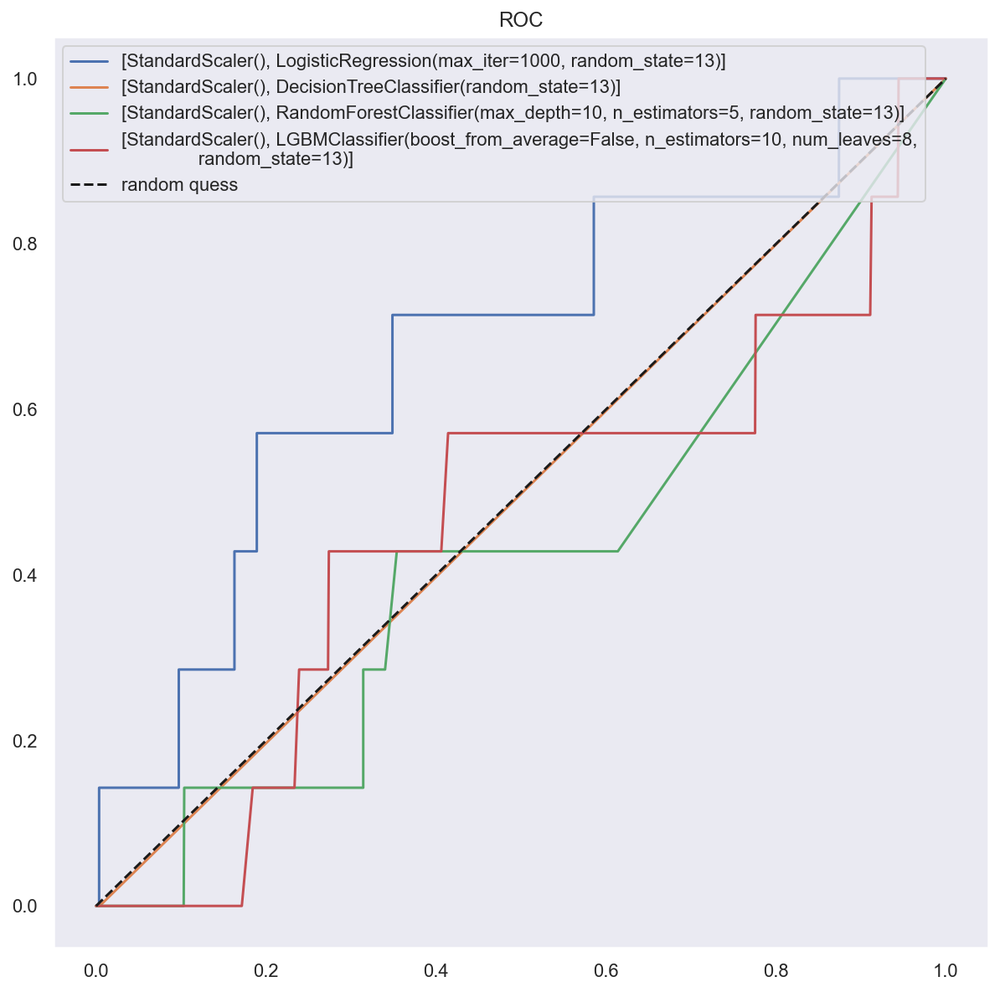

In [34]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
cols_1hot = df_do_dn.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
df_do_dn_1h = pd.get_dummies(df_do, columns=cols_1hot)
print('one-hot result: ', df_do_dn_1h.shape)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list30 , result30 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='SD')

In [87]:
result30['null_del'], result30['encoded'], result30["scaler"], result30["sampler"] = 1, 1, 'SD', "RandomOverSampler"
result30

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.850203,0.813260,0.909169,0.858544,0.850203,0.687280,0.004094,0.571429,0.008130,0.629484,1,1,SD,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.993592,0.000000,0.000000,0.000000,0.497913,1,1,SD,RandomOverSampler
2,RandomForest,0.981334,0.964011,1.000000,0.981676,0.981334,0.932393,0.000000,0.000000,0.000000,0.467245,1,1,SD,RandomOverSampler
3,LightGBM,0.910106,0.847610,1.000000,0.917521,0.910106,0.707466,0.003289,0.428571,0.006529,0.568332,1,1,SD,RandomOverSampler
4,SVC,0.999805,0.999610,1.000000,0.999805,0.999805,0.995514,0.000000,0.000000,0.000000,0.498876,1,1,SD,RandomOverSampler


### #16
(1) null 삭제, Robust, SVMSMOTE

one-hot result:  (15959, 59)
==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 4941]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.3s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


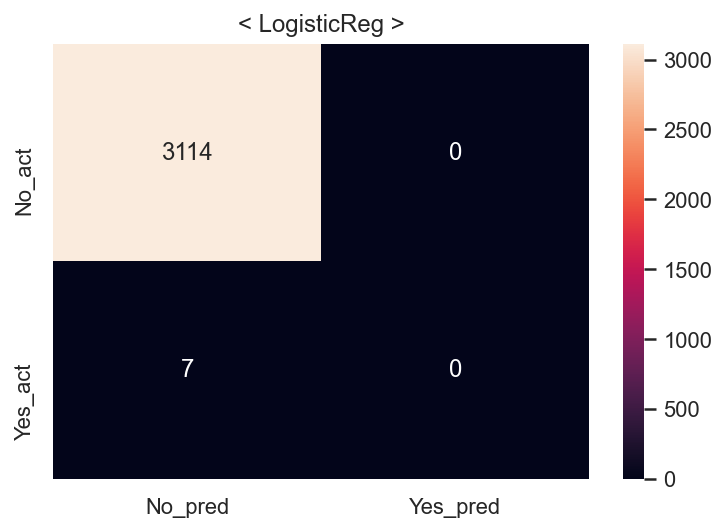

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


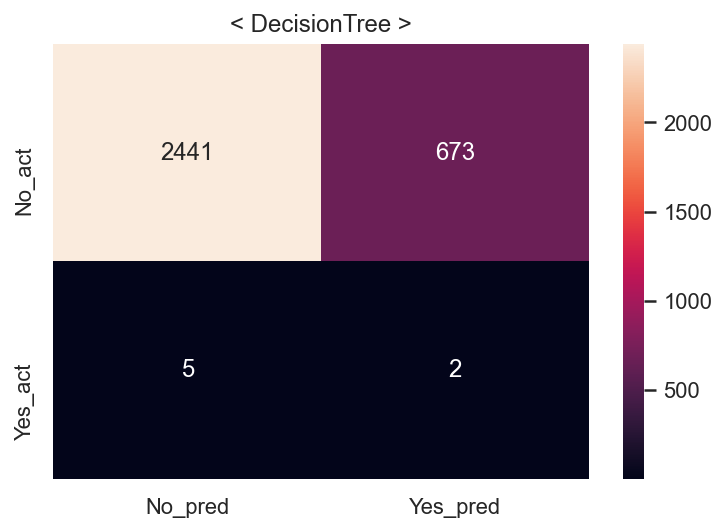

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


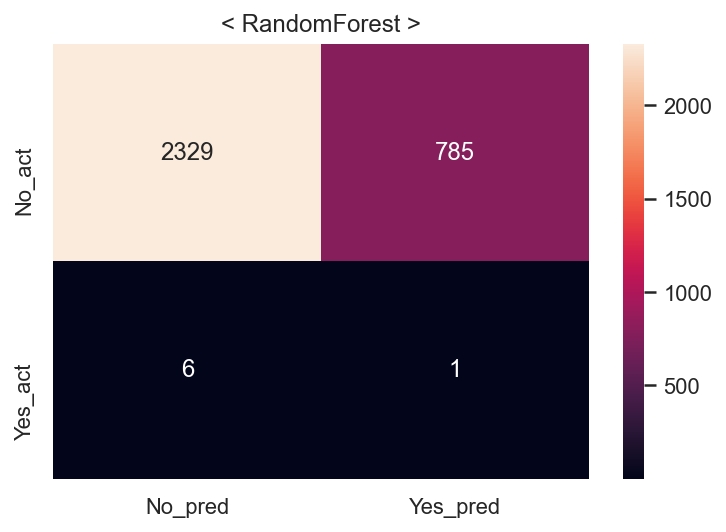

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


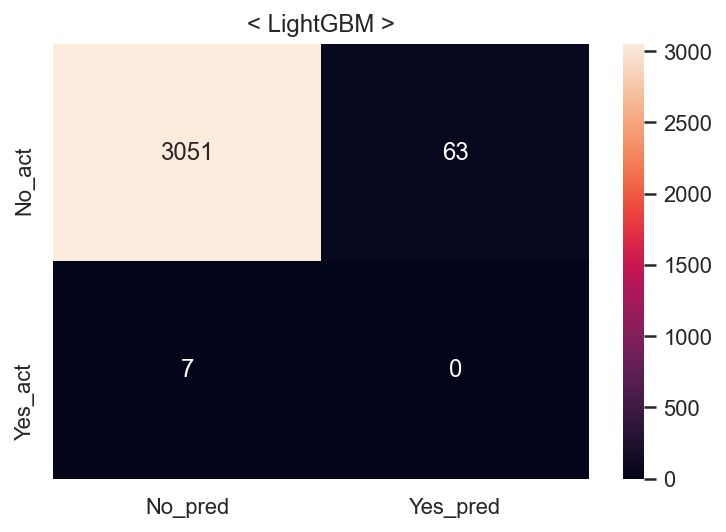

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  17.1s
====Done Evaluation====
====Done Evaluation====


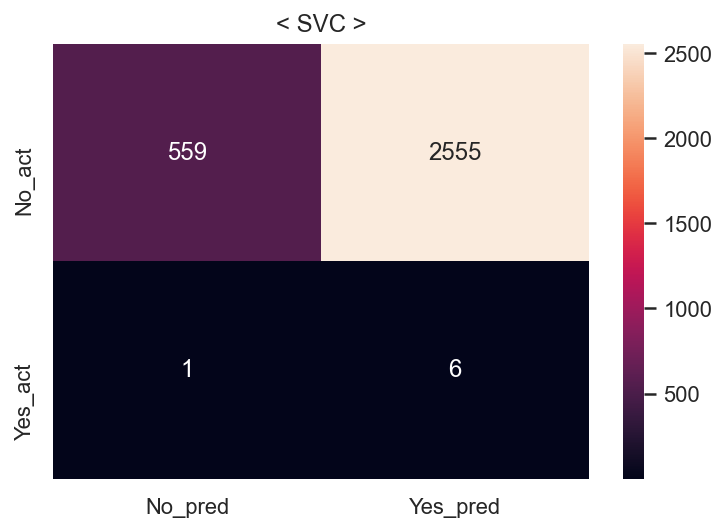

Fit time : 1.36 min


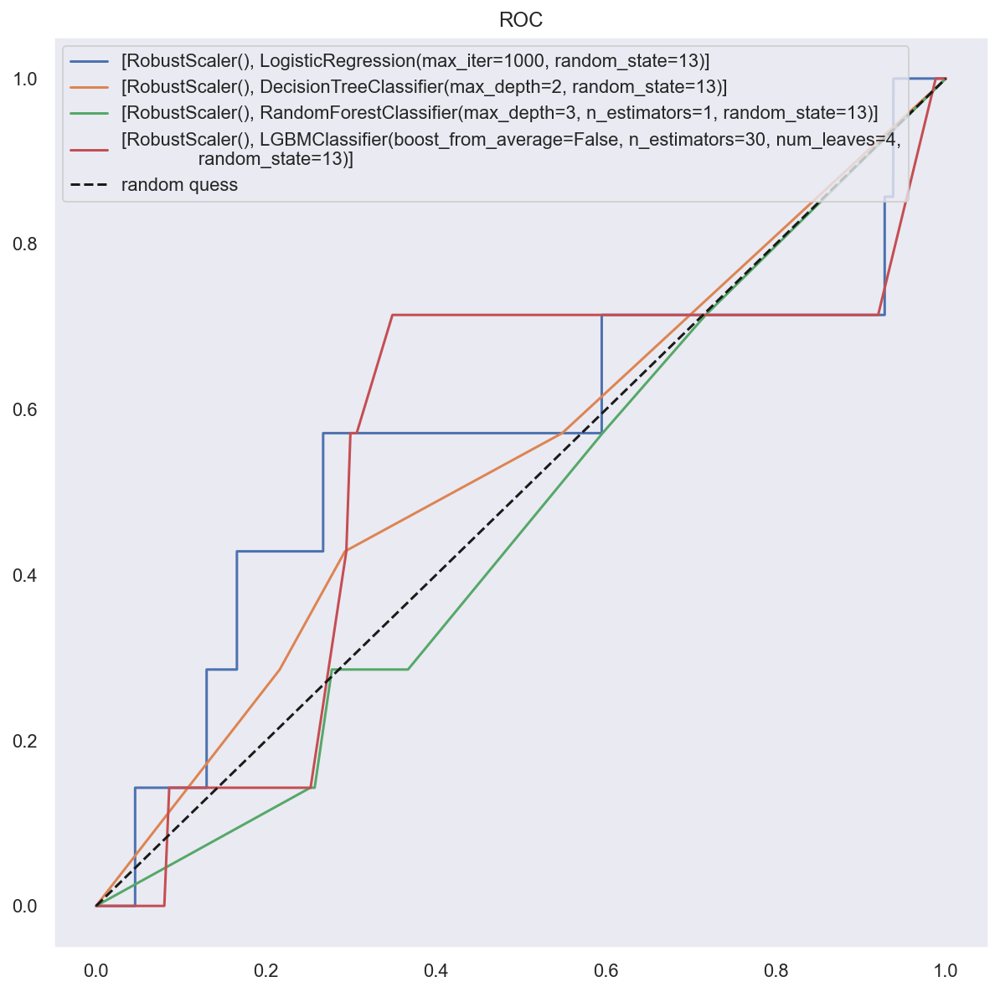

In [35]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
cols_1hot = df_do_dn.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
df_do_dn_1h = pd.get_dummies(df_do, columns=cols_1hot)
print('one-hot result: ', df_do_dn_1h.shape)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='SVMSMOTE')
# fit & evaluation
cv_list31 , result31 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [85]:
result31['null_del'], result31['encoded'], result31["scaler"], result31["sampler"] = 1, 1, 'RB', "SVMSMOTE"
result31

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.998028,0.999796,0.993119,0.996446,0.996520,0.997757,0.000000,0.000000,0.000000,0.500000,1,1,RB,SVMSMOTE
1,DecisionTree,0.917272,0.773078,0.994940,0.870088,0.941121,0.782762,0.002963,0.285714,0.005865,0.534797,1,1,RB,SVMSMOTE
2,RandomForest,0.804227,0.587708,0.994738,0.738876,0.862724,0.746556,0.001272,0.142857,0.002522,0.445385,1,1,RB,SVMSMOTE
3,LightGBM,0.989462,0.969206,0.993726,0.981313,0.990771,0.977571,0.000000,0.000000,0.000000,0.489884,1,1,RB,SVMSMOTE
4,SVC,0.401352,0.317393,0.999393,0.481780,0.584982,0.181032,0.002343,0.857143,0.004673,0.518327,1,1,RB,SVMSMOTE


(2) null 삭제, Robust, ROS

one-hot result:  (15959, 59)
==Split Result==
y_train :  [[0, 1], [12804, 34]]
y_test : [[0, 1], [3114, 7]]
==Sampling Result==
y_train :  [[0, 1], [12804, 34]]
y_train_over : [[0, 1], [12804, 12804]]
[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   1.7s
====Done Evaluation====
====Done Evaluation====


/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


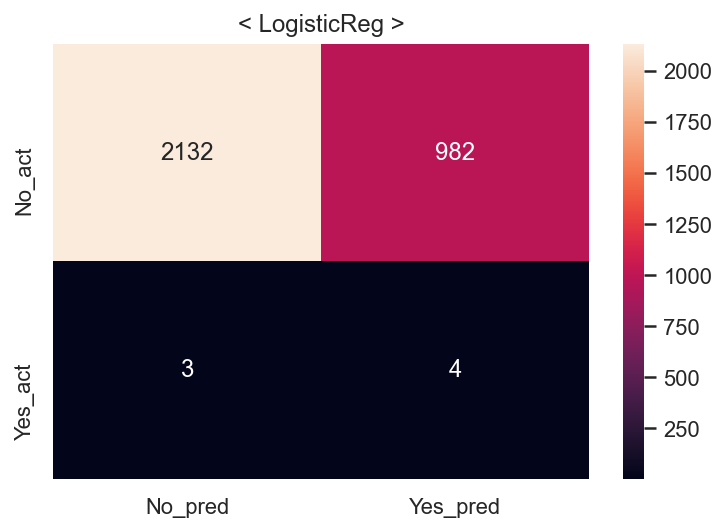

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


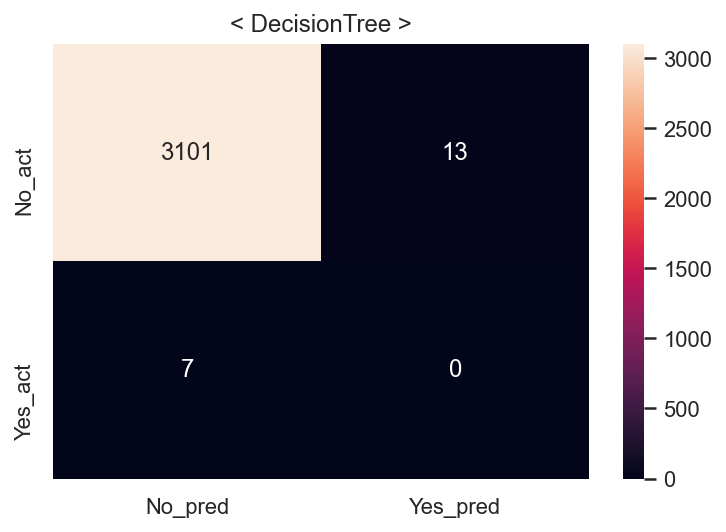

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.0s
====Done Evaluation====
====Done Evaluation====


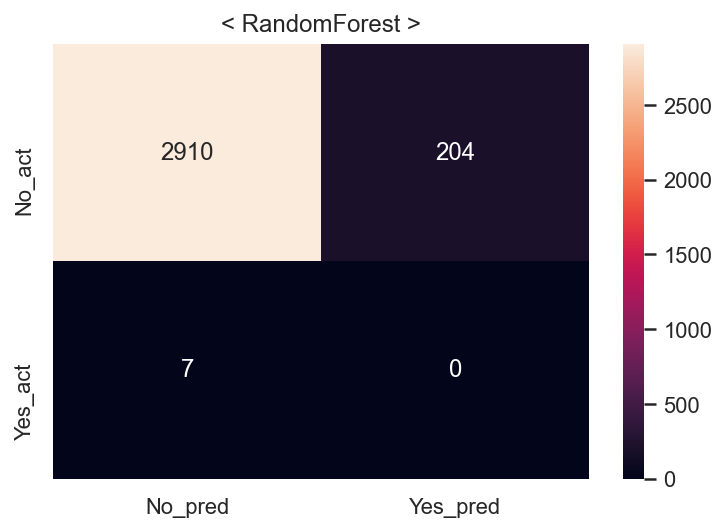

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing clf, total=   0.1s
====Done Evaluation====
====Done Evaluation====


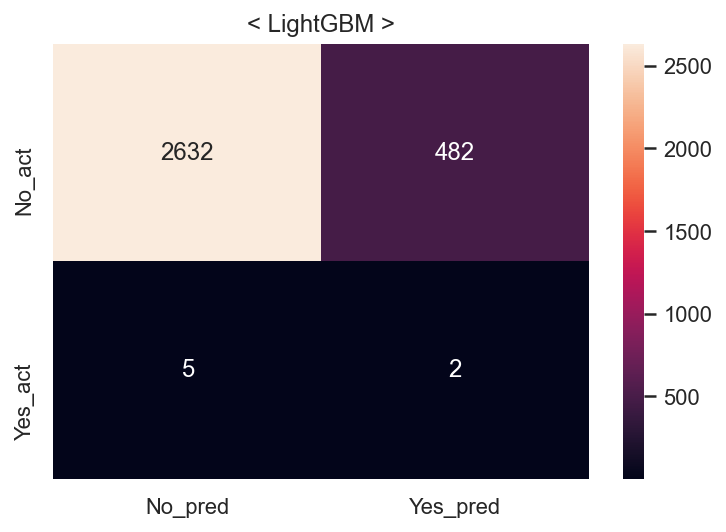

/Users/dockyum/opt/anaconda3/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py:688: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.1s
[Pipeline] ............... (step 2 of 2) Processing clf, total=  21.6s
====Done Evaluation====
====Done Evaluation====


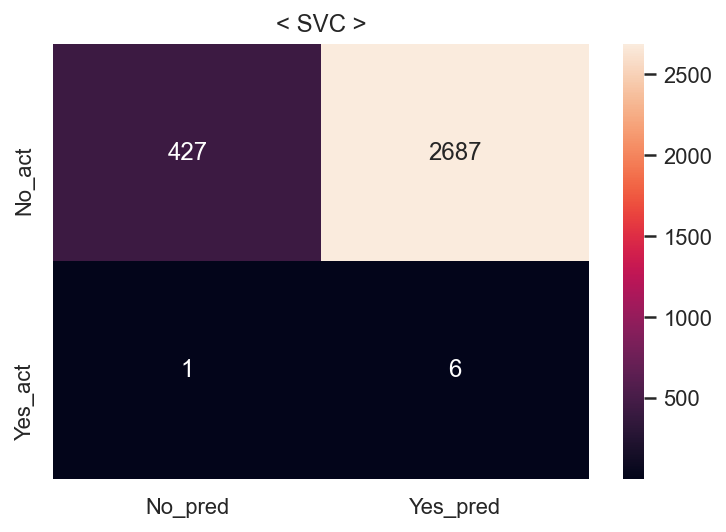

Fit time : 2.03 min


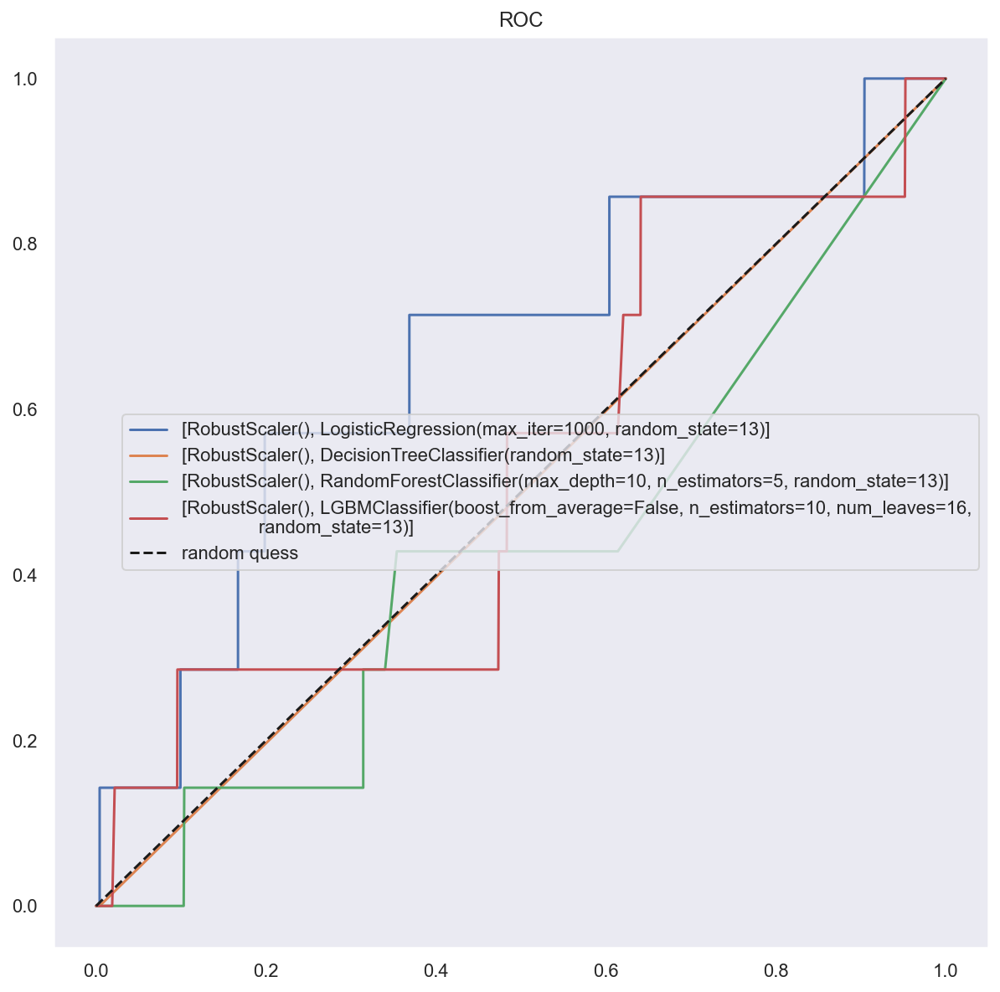

In [36]:
# null 삭제
df_do_dn = df_do.drop(['repair_cost', 'insure_cost', 'acc_type1', 'insurance_site_aid_YN', 'police_site_aid_YN', 'total_prsn_cnt'], axis=1)
# 1hot
cols_1hot = df_do_dn.columns.drop(['fraud_YN', 'sharing_type', 'has_previous_accident', 'socarpass', 'socarsave', 'car_part1', 'car_part2', 'accident_ratio', 'repair_cnt', 'test_set'])
df_do_dn_1h = pd.get_dummies(df_do, columns=cols_1hot)
print('one-hot result: ', df_do_dn_1h.shape)
# split
X_train, X_test, y_train, y_test = ut.split_train_test(df_do_dn_1h)
# sampler
X_train_over, y_train_over = ut.fit_sampler(X_train, y_train, sampler='RandomOverSampler')
# fit & evaluation
cv_list32 , result32 = ut.fit_cv(X_train_over, y_train_over, X_test, y_test, scaler='RB')

In [88]:
result32['null_del'], result32['encoded'], result32["scaler"], result32["sampler"] = 1, 1, 'RB', "RandomOverSampler"
result32

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.849500,0.812238,0.909169,0.857975,0.849500,0.684396,0.004057,0.571429,0.008056,0.628039,1,1,RB,RandomOverSampler
1,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.993592,0.000000,0.000000,0.000000,0.497913,1,1,RB,RandomOverSampler
2,RandomForest,0.981334,0.964011,1.000000,0.981676,0.981334,0.932393,0.000000,0.000000,0.000000,0.467245,1,1,RB,RandomOverSampler
3,LightGBM,0.956068,0.919233,1.000000,0.957917,0.956068,0.843960,0.004132,0.285714,0.008147,0.565465,1,1,RB,RandomOverSampler
4,SVC,0.568377,0.536698,1.000000,0.698508,0.568377,0.138738,0.002228,0.857143,0.004444,0.497133,1,1,RB,RandomOverSampler


In [98]:
results = pd.DataFrame()
results = pd.concat([value for name, value in locals().items() if name.startswith('result')])
results = results.reset_index(drop=True)
results = results.drop(results[-10:].index)
results.shape

(160, 15)

In [101]:
results.isnull().sum()

classifier         0
train accuracy     0
train precision    0
train recall       0
train f1           0
train auc          0
test accuracy      0
test precision     0
test recall        0
test f1            0
test auc           0
null_del           0
encoded            0
scaler             0
sampler            0
dtype: int64

In [106]:
results.to_csv('SVMSMOTE_ROS_results.csv', encoding='utf-8', index=False)

In [108]:
df_tmp = pd.read_csv('SVMSMOTE_ROS_results.csv')
df_tmp.head(10)

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
0,LogisticReg,0.774697,0.553007,0.995547,0.711044,0.842510,0.684396,0.006061,0.857143,0.012036,0.770575,0.0,0.0,None,SVMSMOTE
1,DecisionTree,0.936489,0.816988,0.994738,0.897143,0.954375,0.867350,0.004866,0.285714,0.009569,0.577186,0.0,0.0,None,SVMSMOTE
2,RandomForest,0.917216,0.772956,0.994940,0.870012,0.941082,0.782762,0.002963,0.285714,0.005865,0.534797,0.0,0.0,None,SVMSMOTE
3,LightGBM,0.984897,0.953601,0.994131,0.973444,0.987732,0.968920,0.010870,0.142857,0.020202,0.556817,0.0,0.0,None,SVMSMOTE
4,SVC,0.335757,0.295275,0.999190,0.455842,0.539466,0.091958,0.002464,1.000000,0.004916,0.544958,0.0,0.0,None,SVMSMOTE
5,LogisticReg,0.536278,0.518822,1.000000,0.683190,0.536278,0.079462,0.002085,0.857143,0.004159,0.467428,0.0,0.0,None,RandomOverSampler
6,DecisionTree,1.000000,1.000000,1.000000,1.000000,1.000000,0.994233,0.000000,0.000000,0.000000,0.498234,0.0,0.0,None,RandomOverSampler
7,RandomForest,0.936778,0.887749,1.000000,0.940537,0.936778,0.882730,0.002770,0.142857,0.005435,0.513625,0.0,0.0,None,RandomOverSampler
8,LightGBM,0.939082,0.891395,1.000000,0.942580,0.939082,0.830503,0.005682,0.428571,0.011215,0.629989,0.0,0.0,None,RandomOverSampler
9,SVC,0.500898,0.500449,1.000000,0.667066,0.500898,0.005127,0.002249,1.000000,0.004489,0.501445,0.0,0.0,None,RandomOverSampler


In [129]:
df_tmp.sort_values(by=['test f1', 'test precision'], ascending=False).head(20)

,classifier,train accuracy,train precision,train recall,train f1,train auc,test accuracy,test precision,test recall,test f1,test auc,null_del,encoded,scaler,sampler
3,LightGBM,0.984897,0.953601,0.994131,0.973444,0.987732,0.968920,0.010870,0.142857,0.020202,0.556817,0.0,0.0,None,SVMSMOTE
13,LightGBM,0.984897,0.953601,0.994131,0.973444,0.987732,0.968920,0.010870,0.142857,0.020202,0.556817,0.0,0.0,MM,SVMSMOTE
23,LightGBM,0.980276,0.938659,0.994131,0.965599,0.984530,0.960590,0.008475,0.142857,0.016000,0.552642,0.0,0.0,SD,SVMSMOTE
33,LightGBM,0.980276,0.938659,0.994131,0.965599,0.984530,0.960590,0.008475,0.142857,0.016000,0.552642,0.0,0.0,RB,SVMSMOTE
80,LogisticReg,0.821133,0.609466,0.995547,0.756071,0.874687,0.755207,0.006519,0.714286,0.012920,0.734792,0.0,1.0,None,SVMSMOTE
0,LogisticReg,0.774697,0.553007,0.995547,0.711044,0.842510,0.684396,0.006061,0.857143,0.012036,0.770575,0.0,0.0,None,SVMSMOTE
120,LogisticReg,0.809637,0.594441,0.995547,0.744401,0.866721,0.724127,0.005787,0.714286,0.011481,0.719217,1.0,1.0,None,SVMSMOTE
8,LightGBM,0.939082,0.891395,1.000000,0.942580,0.939082,0.830503,0.005682,0.428571,0.011215,0.629989,0.0,0.0,None,RandomOverSampler
18,LightGBM,0.939082,0.891395,1.000000,0.942580,0.939082,0.830503,0.005682,0.428571,0.011215,0.629989,0.0,0.0,MM,RandomOverSampler
28,LightGBM,0.939042,0.891333,1.000000,0.942545,0.939042,0.830503,0.005682,0.428571,0.011215,0.629989,0.0,0.0,SD,RandomOverSampler
